In [1]:
import numpy as np, os

DATA = '/users/vvgk0135/raman-project/data/extracted_2026_5ch_75px'

print('Ratio values AFTER mask (threshold=500):')
print(f'{"Cell Line":<10} {"Channel":<8} {"min":>8} {"max":>8} {"mean":>8} {"masked%":>8}')
print('-'*55)

for cl in ['FHC','HCT116','CaCo2','SW480','HT29','SW620']:
    folder = os.path.join(DATA, cl)
    f = sorted(os.listdir(folder))[5]
    cell = np.load(os.path.join(folder, f)).astype(np.float32)
    
    protein = cell[0] - cell[2]  # 1660 - 1900
    mask = protein > 500  # binary mask
    masked_pct = (~mask).sum() / mask.size * 100
    
    for ch_idx, ch_name in [(1,'1450'), (3,'2850'), (4,'2935')]:
        signal = cell[ch_idx] - cell[2]
        ratio = np.where(mask, signal / np.where(mask, protein, 1), 0)
        valid = ratio[mask]
        print(f'{cl:<10} {ch_name:<8} {valid.min():>8.3f} {valid.max():>8.3f} {valid.mean():>8.3f} {masked_pct:>7.1f}%')
    print()

Ratio values AFTER mask (threshold=500):
Cell Line  Channel       min      max     mean  masked%
-------------------------------------------------------
FHC        1450       -0.219    1.534    0.765     0.0%
FHC        2850       -3.051    0.317   -0.090     0.0%
FHC        2935       -2.758    0.325   -0.064     0.0%

HCT116     1450       -7.178    6.246    0.649     1.0%
HCT116     2850      -16.164    0.840   -0.685     1.0%
HCT116     2935      -14.273    3.680    0.118     1.0%

CaCo2      1450      -12.859    7.821    0.371     3.9%
CaCo2      2850      -24.571    1.184   -2.222     3.9%
CaCo2      2935      -22.470    1.083   -1.371     3.9%

SW480      1450      -11.540    6.558    0.351     6.5%
SW480      2850      -20.215    6.451   -1.235     6.5%
SW480      2935      -16.743    4.718   -0.621     6.5%

HT29       1450       -9.457    7.506    0.378     7.3%
HT29       2850      -33.986    0.585   -1.724     7.3%
HT29       2935      -23.842    1.494   -0.941     7.3%

SW

In [2]:
import numpy as np, os

DATA = '/users/vvgk0135/raman-project/data/extracted_2026_5ch_75px'

print('1900 channel raw values across sessions:')
print(f'{"Cell Line":<10} {"Session":<8} {"min":>8} {"max":>8} {"mean":>8}')
print('-'*50)

for cl in ['FHC','HCT116','CaCo2','SW480','HT29','SW620']:
    folder = os.path.join(DATA, cl)
    files = sorted(os.listdir(folder))
    sessions = {}
    for f in files:
        parts = f.split('_')
        s = next((p for p in parts if p.startswith('s') and p[1:].isdigit()), 's1')
        if s not in sessions:
            sessions[s] = []
        sessions[s].append(f)
    
    for s in sorted(sessions.keys()):
        # average over 5 cells per session
        ch1900_means = []
        ch1660_means = []
        for fname in sessions[s][:5]:
            cell = np.load(os.path.join(folder, fname)).astype(np.float32)
            ch1900_means.append(cell[2].mean())
            ch1660_means.append(cell[0].mean())
        print(f'{cl:<10} {s:<8} '
              f'1900={np.mean(ch1900_means):>8.1f} '
              f'1660={np.mean(ch1660_means):>8.1f} '
              f'ratio={np.mean(ch1900_means)/np.mean(ch1660_means):>6.3f}')
    print()

1900 channel raw values across sessions:
Cell Line  Session       min      max     mean
--------------------------------------------------
FHC        s1       1900=  1546.2 1660=  8298.7 ratio= 0.186
FHC        s2       1900=  3184.8 1660=  4774.5 ratio= 0.667
FHC        s3       1900=  7013.2 1660=  8309.5 ratio= 0.844

HCT116     s1       1900=  4341.3 1660=  9971.2 ratio= 0.435
HCT116     s2       1900= 11651.5 1660= 14874.6 ratio= 0.783
HCT116     s3       1900= 11179.0 1660= 15449.8 ratio= 0.724

CaCo2      s1       1900= 11073.3 1660= 16033.3 ratio= 0.691
CaCo2      s2       1900= 11510.6 1660= 15256.8 ratio= 0.754
CaCo2      s3       1900=  3581.0 1660=  7665.3 ratio= 0.467
CaCo2      s4       1900= 11073.3 1660= 16033.3 ratio= 0.691

SW480      s1       1900=  4523.6 1660=  9778.3 ratio= 0.463
SW480      s2       1900=  3373.6 1660= 12514.7 ratio= 0.270
SW480      s3       1900=  5428.2 1660= 11670.4 ratio= 0.465

HT29       s1       1900=  7241.0 1660= 13184.3 ratio= 0.549
HT2

In [3]:
import numpy as np, os

DATA = '/users/vvgk0135/raman-project/data/extracted_2026_5ch_75px'

print('Simple ratio values (chX / 1660) — no eps:')
print(f'{"Cell Line":<10} {"Session":<5} {"Channel":<8} {"min":>8} {"max":>8} {"mean":>8} {"masked%":>8}')
print('-'*60)

for cl in ['FHC','HCT116','CaCo2','SW480','HT29','SW620']:
    folder = os.path.join(DATA, cl)
    files = sorted(os.listdir(folder))
    sessions = {}
    for f in files:
        parts = f.split('_')
        s = next((p for p in parts if p.startswith('s') and p[1:].isdigit()), 's1')
        if s not in sessions:
            sessions[s] = f

    for s, fname in sorted(sessions.items()):
        cell = np.load(os.path.join(folder, fname)).astype(np.float32)
        ch1660 = cell[0]
        threshold = 1000  # reasonable threshold for 1660
        mask = ch1660 > threshold

        for ch_idx, ch_name in [(1,'1450'),(3,'2850'),(4,'2935')]:
            ratio = np.where(mask, cell[ch_idx] / np.where(mask, ch1660, 1), 0)
            valid = ratio[mask]
            masked_pct = (~mask).sum() / mask.size * 100
            print(f'{cl:<10} {s:<5} {ch_name:<8} {valid.min():>8.3f} {valid.max():>8.3f} {valid.mean():>8.3f} {masked_pct:>7.1f}%')
    print()

Simple ratio values (chX / 1660) — no eps:
Cell Line  Session Channel       min      max     mean  masked%
------------------------------------------------------------
FHC        s1    1450        0.364    1.573    0.789     0.0%
FHC        s1    2850        0.056    0.556    0.194     0.0%
FHC        s1    2935        0.084    1.147    0.318     0.0%
FHC        s2    1450        0.360    1.608    0.767     0.0%
FHC        s2    2850        0.067    2.136    0.203     0.0%
FHC        s2    2935        0.138    2.312    0.314     0.0%
FHC        s3    1450        0.518    1.552    0.781     0.0%
FHC        s3    2850        0.068    0.587    0.152     0.0%
FHC        s3    2935        0.119    0.773    0.217     0.0%

HCT116     s1    1450        0.135    2.171    0.818     0.0%
HCT116     s1    2850        0.000    0.980    0.148     0.0%
HCT116     s1    2935        0.028    2.233    0.541     0.0%
HCT116     s2    1450        0.420    1.751    0.916     0.0%
HCT116     s2    2850    

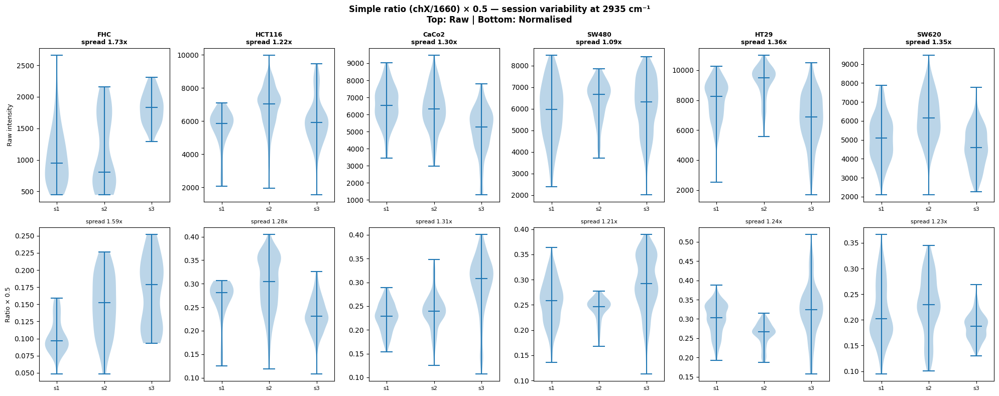

Saved!


In [4]:
import numpy as np, os, matplotlib.pyplot as plt

DATA = '/users/vvgk0135/raman-project/data/extracted_2026_5ch_75px'
ALL_CL = ['FHC','HCT116','CaCo2','SW480','HT29','SW620']
SESSIONS = ['s1','s2','s3']
ALPHA = 0.5
THRESHOLD = 1000

fig, axes = plt.subplots(2, 6, figsize=(20, 8))
fig.suptitle(f'Simple ratio (chX/1660) × {ALPHA} — session variability at 2935 cm⁻¹\n'
             f'Top: Raw | Bottom: Normalised', fontsize=12, fontweight='bold')

for col, cl in enumerate(ALL_CL):
    folder = os.path.join(DATA, cl)
    files = sorted(os.listdir(folder))
    
    raw_data = {s:[] for s in SESSIONS}
    norm_data = {s:[] for s in SESSIONS}
    
    for fname in files:
        parts = fname.split('_')
        s = next((p for p in parts if p.startswith('s') and p[1:].isdigit()), 's1')
        if s not in SESSIONS: continue
        cell = np.load(os.path.join(folder, fname)).astype(np.float32)
        ch1660 = cell[0]
        mask = ch1660 > THRESHOLD
        ratio = np.where(mask, cell[4] / np.where(mask, ch1660, 1), 0) * ALPHA
        ratio = np.clip(ratio, 0, 1)
        raw_data[s].append(float(cell[4].mean()))
        norm_data[s].append(float(ratio.mean()))
    
    raw_vals  = [raw_data[s]  for s in SESSIONS if raw_data[s]]
    norm_vals = [norm_data[s] for s in SESSIONS if norm_data[s]]
    s_labels  = [s for s in SESSIONS if raw_data[s]]
    
    if raw_vals:
        spread = max(np.mean(v) for v in raw_vals) / min(np.mean(v) for v in raw_vals)
        axes[0, col].violinplot(raw_vals, showmedians=True)
        axes[0, col].set_xticks(range(1, len(s_labels)+1))
        axes[0, col].set_xticklabels(s_labels, fontsize=8)
        axes[0, col].set_title(f'{cl}\nspread {spread:.2f}x', fontsize=9, fontweight='bold')
        if col == 0: axes[0, col].set_ylabel('Raw intensity', fontsize=9)

    if norm_vals:
        spread = max(np.mean(v) for v in norm_vals) / min(np.mean(v) for v in norm_vals)
        axes[1, col].violinplot(norm_vals, showmedians=True)
        axes[1, col].set_xticks(range(1, len(s_labels)+1))
        axes[1, col].set_xticklabels(s_labels, fontsize=8)
        axes[1, col].set_title(f'spread {spread:.2f}x', fontsize=8)
        if col == 0: axes[1, col].set_ylabel(f'Ratio × {ALPHA}', fontsize=9)

plt.tight_layout()
plt.savefig('/users/vvgk0135/raman-project/results/julia_meeting/violin_simple_ratio_2935.png',
            dpi=150, bbox_inches='tight', facecolor='white')
plt.show()
print('Saved!')

In [5]:
import numpy as np, os

DATA = '/users/vvgk0135/raman-project/data/extracted_2026_5ch_75px'

print('Correlation between 1900 and other channels:')
print('(High = channels move together = focus effect = ratio works)')
print()

for cl in ['FHC','HCT116','CaCo2','SW480','HT29','SW620']:
    folder = os.path.join(DATA, cl)
    files = sorted([f for f in os.listdir(folder) if f.endswith('.npy')])
    
    m1900,m1660,m2935,m2850,m1450 = [],[],[],[],[]
    
    for fname in files[:30]:
        cell = np.load(os.path.join(folder, fname)).astype(np.float32)
        m1900.append(cell[2].mean())
        m1660.append(cell[0].mean())
        m2935.append(cell[4].mean())
        m2850.append(cell[3].mean())
        m1450.append(cell[1].mean())
    
    a = np.array
    print(f'{cl}:')
    print(f'  1900 vs 1660 corr: {np.corrcoef(a(m1900),a(m1660))[0,1]:.3f}')
    print(f'  1900 vs 2935 corr: {np.corrcoef(a(m1900),a(m2935))[0,1]:.3f}')
    print(f'  1900 vs 2850 corr: {np.corrcoef(a(m1900),a(m2850))[0,1]:.3f}')
    print(f'  1900 vs 1450 corr: {np.corrcoef(a(m1900),a(m1450))[0,1]:.3f}')
    print()

Correlation between 1900 and other channels:
(High = channels move together = focus effect = ratio works)

FHC:
  1900 vs 1660 corr: -0.222
  1900 vs 2935 corr: -0.583
  1900 vs 2850 corr: -0.359
  1900 vs 1450 corr: -0.074

HCT116:
  1900 vs 1660 corr: 0.477
  1900 vs 2935 corr: -0.029
  1900 vs 2850 corr: 0.490
  1900 vs 1450 corr: 0.435

CaCo2:
  1900 vs 1660 corr: 0.866
  1900 vs 2935 corr: 0.591
  1900 vs 2850 corr: 0.765
  1900 vs 1450 corr: 0.929

SW480:
  1900 vs 1660 corr: 0.752
  1900 vs 2935 corr: 0.643
  1900 vs 2850 corr: 0.739
  1900 vs 1450 corr: 0.756

HT29:
  1900 vs 1660 corr: 0.727
  1900 vs 2935 corr: 0.560
  1900 vs 2850 corr: 0.644
  1900 vs 1450 corr: 0.712

SW620:
  1900 vs 1660 corr: 0.626
  1900 vs 2935 corr: 0.483
  1900 vs 2850 corr: 0.553
  1900 vs 1450 corr: 0.627



Saved baseline_sub_FHC.png
Saved baseline_sub_HCT116.png
Saved baseline_sub_CaCo2.png
Saved baseline_sub_SW480.png
Saved baseline_sub_HT29.png
Saved baseline_sub_SW620.png
All baseline subtraction figures saved!


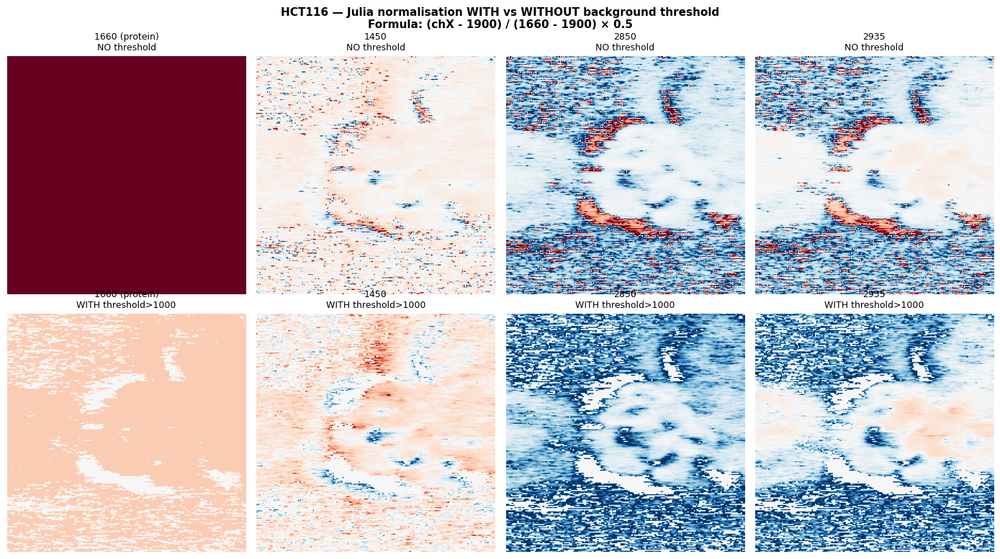

Saved threshold comparison


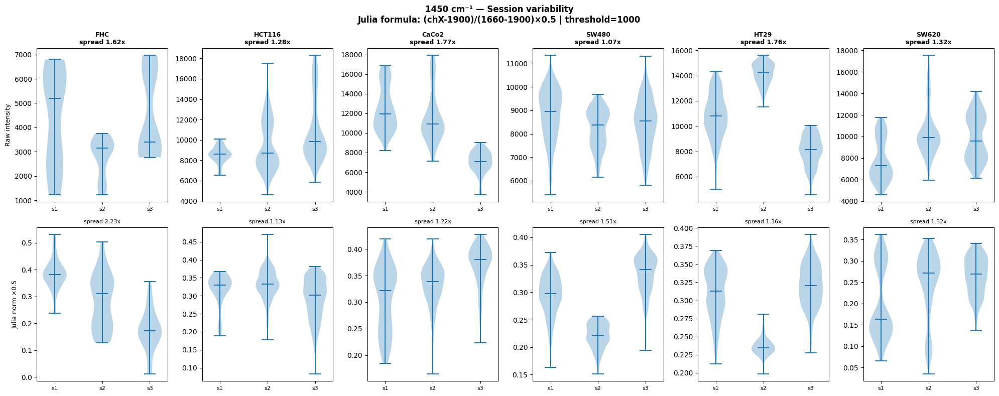

Saved violin for 1450


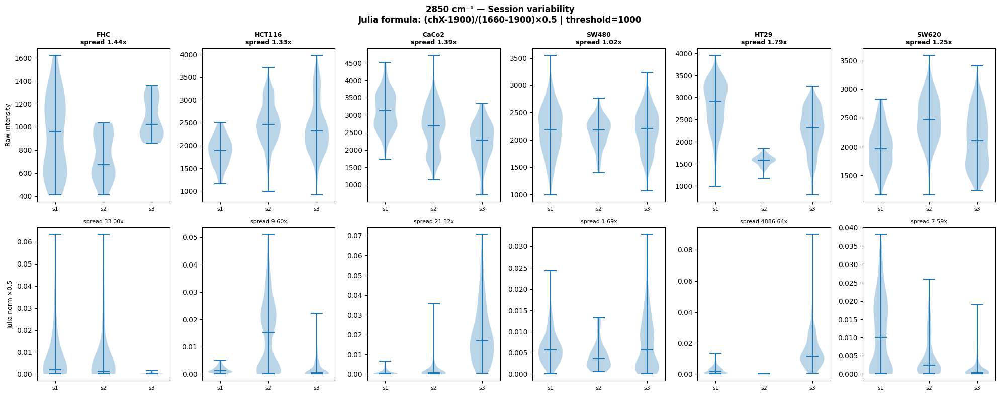

Saved violin for 2850


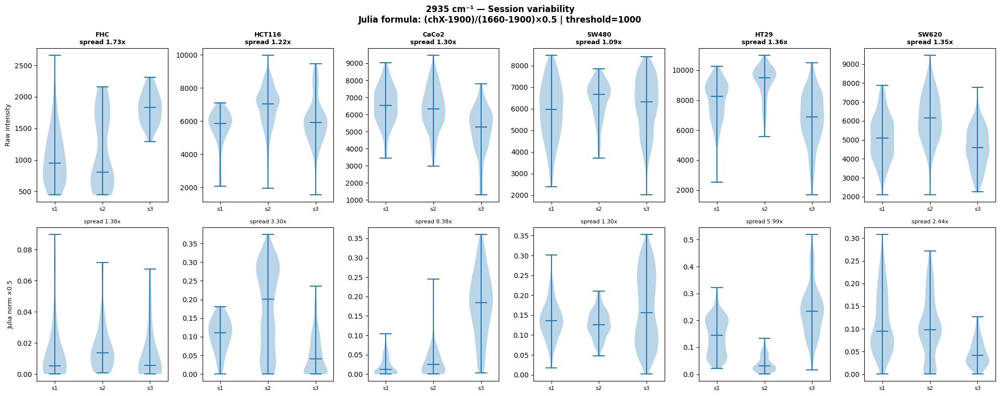

Saved violin for 2935

All figures saved!


In [6]:
import numpy as np, os, matplotlib.pyplot as plt

DATA = '/users/vvgk0135/raman-project/data/extracted_2026_5ch_75px'
SAVE_DIR = '/users/vvgk0135/raman-project/results/julia_meeting'
os.makedirs(SAVE_DIR, exist_ok=True)

ALPHA = 0.5  # start with this, we can adjust
THRESHOLD = 1000  # threshold on (1660 - 1900)

ALL_CL = ['FHC','HCT116','CaCo2','SW480','HT29','SW620']
SESSIONS = ['s1','s2','s3']

def get_first_cell(cl, s):
    folder = os.path.join(DATA, cl)
    files = sorted([f for f in os.listdir(folder) if f.endswith('.npy') and f'_{s}_' in f])
    if not files: return None
    return np.load(os.path.join(folder, files[2])).astype(np.float32)

# ═══════════════════════════════════════════════════════════
# FIGURE 1: Baseline subtracted images (1660-1900) and (chX-1900)
# For each cell line, show one cell from s1
# Columns: 1660raw | 1900raw | 1660-1900 | 1450-1900 | 2850-1900 | 2935-1900
# ═══════════════════════════════════════════════════════════
for cl in ALL_CL:
    cell = get_first_cell(cl, 's1')
    if cell is None: continue
    
    ch1660 = cell[0]
    ch1900 = cell[2]
    ch1450 = cell[1]
    ch2850 = cell[3]
    ch2935 = cell[4]
    
    # Baseline subtracted
    protein_bs = ch1660 - ch1900
    sig_1450   = ch1450 - ch1900
    sig_2850   = ch2850 - ch1900
    sig_2935   = ch2935 - ch1900
    
    fig, axes = plt.subplots(2, 6, figsize=(18, 7))
    fig.suptitle(f'{cl} — Baseline subtraction (Julia formula)\n'
                 f'Top: Raw | Bottom: Baseline subtracted (chX - 1900)',
                 fontsize=11, fontweight='bold')
    
    # Top row — raw
    for col, (img, title) in enumerate([
        (ch1660, '1660\n(reference)'),
        (ch1900, '1900\n(baseline)'),
        (ch1660-ch1900, '1660-1900\n(protein corrected)'),
        (ch1450-ch1900, '1450-1900\n(signal)'),
        (ch2850-ch1900, '2850-1900\n(signal)'),
        (ch2935-ch1900, '2935-1900\n(signal)'),
    ]):
        if col < 2:
            axes[0, col].imshow(img, cmap='hot')
        else:
            axes[0, col].imshow(img, cmap='RdBu_r',
                               vmin=-abs(img).max(), vmax=abs(img).max())
        axes[0, col].set_title(title, fontsize=8)
        axes[0, col].axis('off')
    
    # Bottom row — normalised WITH threshold
    mask = protein_bs > THRESHOLD
    for col, (signal, title) in enumerate([
        (protein_bs, '1660-1900\n(protein)'),
        (ch1900,     '1900\n(baseline)'),
        (np.where(mask, protein_bs/np.where(mask,protein_bs,1)*ALPHA, 0), 
         'Norm protein\n(=alpha where valid)'),
        (np.where(mask, sig_1450/np.where(mask,protein_bs,1)*ALPHA, 0),
         f'Norm 1450\nalpha={ALPHA}'),
        (np.where(mask, sig_2850/np.where(mask,protein_bs,1)*ALPHA, 0),
         f'Norm 2850\nalpha={ALPHA}'),
        (np.where(mask, sig_2935/np.where(mask,protein_bs,1)*ALPHA, 0),
         f'Norm 2935\nalpha={ALPHA}'),
    ]):
        axes[1, col].imshow(np.clip(img if col < 2 else signal, -2, 2),
                           cmap='hot' if col < 2 else 'RdBu_r')
        axes[1, col].set_title(title, fontsize=8)
        axes[1, col].axis('off')
        if col == 0:
            axes[1, col].set_ylabel(f'With threshold>{THRESHOLD}', fontsize=8)
    
    # Mark masked pixels
    masked_overlay = np.zeros((*mask.shape, 4))
    masked_overlay[~mask] = [0, 0, 1, 0.5]  # blue where masked
    for col in range(2, 6):
        axes[1, col].imshow(masked_overlay)
    
    masked_pct = (~mask).sum()/mask.size*100
    fig.text(0.5, 0.01, f'Masked pixels (threshold={THRESHOLD}): {(~mask).sum()} ({masked_pct:.1f}%)',
             ha='center', fontsize=9)
    
    plt.tight_layout()
    plt.savefig(f'{SAVE_DIR}/baseline_sub_{cl}.png', dpi=120, bbox_inches='tight', facecolor='white')
    plt.close()
    print(f'Saved baseline_sub_{cl}.png')

print('All baseline subtraction figures saved!')

# ═══════════════════════════════════════════════════════════
# FIGURE 2: WITHOUT threshold vs WITH threshold comparison
# Show one HCT116 cell
# ═══════════════════════════════════════════════════════════
cl = 'HCT116'
cell = get_first_cell(cl, 's2')
ch1660 = cell[0]; ch1900 = cell[2]
ch1450 = cell[1]; ch2850 = cell[3]; ch2935 = cell[4]
protein_bs = ch1660 - ch1900
mask = protein_bs > THRESHOLD

fig, axes = plt.subplots(2, 4, figsize=(14, 8))
fig.suptitle(f'HCT116 — Julia normalisation WITH vs WITHOUT background threshold\n'
             f'Formula: (chX - 1900) / (1660 - 1900) × {ALPHA}',
             fontsize=11, fontweight='bold')

channels = [(ch1450,'1450'),(ch2850,'2850'),(ch2935,'2935')]

for col, (ch, name) in enumerate([(ch1660,'1660 (protein)')] + channels):
    # Without threshold
    if col == 0:
        ratio_no_thresh = np.clip(protein_bs / np.where(protein_bs!=0, protein_bs, 1e-6) * ALPHA, -5, 5)
        ratio_thresh    = np.where(mask, 1.0*ALPHA, 0)
    else:
        ch_sig = ch - ch1900
        denom  = protein_bs.copy()
        ratio_no_thresh = np.clip(ch_sig / np.where(denom!=0, denom, 1e-6) * ALPHA, -5, 5)
        ratio_thresh    = np.where(mask, ch_sig/np.where(mask, denom, 1)*ALPHA, 0)
        ratio_thresh    = np.clip(ratio_thresh, -2, 2)
    
    vmax = max(abs(ratio_no_thresh).max(), 0.1)
    axes[0, col].imshow(ratio_no_thresh, cmap='RdBu_r', vmin=-vmax, vmax=vmax)
    axes[0, col].set_title(f'{name}\nNO threshold', fontsize=9)
    axes[0, col].axis('off')
    
    axes[1, col].imshow(np.clip(ratio_thresh, -2, 2), cmap='RdBu_r', vmin=-2, vmax=2)
    axes[1, col].set_title(f'{name}\nWITH threshold>{THRESHOLD}', fontsize=9)
    axes[1, col].axis('off')

plt.tight_layout()
plt.savefig(f'{SAVE_DIR}/threshold_comparison_HCT116.png', dpi=150, bbox_inches='tight', facecolor='white')
plt.show()
print('Saved threshold comparison')

# ═══════════════════════════════════════════════════════════
# FIGURE 3: Violin plots WITH threshold — all channels all cell lines
# ═══════════════════════════════════════════════════════════
CHANNELS = [(1,'1450'),(3,'2850'),(4,'2935')]

for ch_idx, ch_name in CHANNELS:
    fig, axes = plt.subplots(2, 6, figsize=(20, 8))
    fig.patch.set_facecolor('white')
    fig.suptitle(f'{ch_name} cm⁻¹ — Session variability\n'
                 f'Julia formula: (chX-1900)/(1660-1900)×{ALPHA} | threshold={THRESHOLD}',
                 fontsize=12, fontweight='bold')
    
    for col, cl in enumerate(ALL_CL):
        folder = os.path.join(DATA, cl)
        files = sorted([f for f in os.listdir(folder) if f.endswith('.npy')])
        
        raw_data  = {s:[] for s in SESSIONS}
        norm_data = {s:[] for s in SESSIONS}
        
        for fname in files:
            parts = fname.split('_')
            s = next((p for p in parts if p.startswith('s') and p[1:].isdigit()), 's1')
            if s not in SESSIONS: continue
            cell = np.load(os.path.join(folder, fname)).astype(np.float32)
            
            protein_bs = cell[0] - cell[2]
            mask = protein_bs > THRESHOLD
            signal = cell[ch_idx] - cell[2]
            norm = np.where(mask, signal/np.where(mask, protein_bs, 1)*ALPHA, 0)
            norm = np.clip(norm, 0, 1)
            
            raw_data[s].append(float(cell[ch_idx].mean()))
            norm_data[s].append(float(norm[mask].mean() if mask.sum()>0 else 0))
        
        raw_vals  = [raw_data[s]  for s in SESSIONS if raw_data[s]]
        norm_vals = [norm_data[s] for s in SESSIONS if norm_data[s]]
        s_labels  = [s for s in SESSIONS if raw_data[s]]
        
        if raw_vals:
            spread = max(np.mean(v) for v in raw_vals) / min(np.mean(v) for v in raw_vals)
            axes[0,col].violinplot(raw_vals, showmedians=True)
            axes[0,col].set_xticks(range(1,len(s_labels)+1))
            axes[0,col].set_xticklabels(s_labels, fontsize=8)
            axes[0,col].set_title(f'{cl}\nspread {spread:.2f}x', fontsize=9, fontweight='bold')
            if col==0: axes[0,col].set_ylabel('Raw intensity', fontsize=9)
        
        if norm_vals:
            spread = max(np.mean(v) for v in norm_vals) / min(np.mean(v) for v in norm_vals)
            axes[1,col].violinplot(norm_vals, showmedians=True)
            axes[1,col].set_xticks(range(1,len(s_labels)+1))
            axes[1,col].set_xticklabels(s_labels, fontsize=8)
            axes[1,col].set_title(f'spread {spread:.2f}x', fontsize=8)
            if col==0: axes[1,col].set_ylabel(f'Julia norm ×{ALPHA}', fontsize=9)
    
    plt.tight_layout()
    ch_safe = ch_name.replace(' ','_')
    plt.savefig(f'{SAVE_DIR}/violin_julia_formula_{ch_safe}.png',
                dpi=150, bbox_inches='tight', facecolor='white')
    plt.show()
    print(f'Saved violin for {ch_name}')

print('\nAll figures saved!')

In [1]:
import numpy as np, os

DATA = '/users/vvgk0135/raman-project/data/extracted_2026_5ch_75px'
FACTOR = 10.67

f = os.path.join(DATA, 'HCT116', sorted(os.listdir(DATA+'/HCT116'))[10])
cell = np.load(f).astype(np.float32)

ch1660 = cell[0]   # unchanged
ch1900 = cell[2]   # unchanged
protein = ch1660 - ch1900

print(f'protein (1660-1900): min={protein.min():.1f} max={protein.max():.1f} mean={protein.mean():.1f}')
print(f'negative pixels: {(protein<0).sum()} ({(protein<0).sum()/protein.size*100:.1f}%)')

for ch_idx, ch_name, needs_factor in [(1,'1450',False),(3,'2850',True),(4,'2935',True)]:
    ch = cell[ch_idx] * (FACTOR if needs_factor else 1.0)
    signal = ch - ch1900
    mask = protein > 500
    ratio = np.where(mask, signal/np.where(mask,protein,1), 0)
    valid = ratio[mask]
    print(f'{ch_name}: signal min={signal.min():.1f} max={signal.max():.1f} | '
          f'ratio min={valid.min():.3f} max={valid.max():.3f} mean={valid.mean():.3f}')

protein (1660-1900): min=-2124.2 max=13378.4 mean=6151.4
negative pixels: 26 (0.1%)
1450: signal min=-4194.7 max=11524.5 | ratio min=-2.706 max=6.456 mean=0.654
2850: signal min=-5954.3 max=69213.2 | ratio min=-4.561 max=29.709 mean=2.443
2935: signal min=21850.5 max=106209.5 | ratio min=3.981 max=117.231 mean=11.483


In [2]:
import numpy as np, os

DATA = '/users/vvgk0135/raman-project/data/extracted_2026_5ch_75px'
FACTOR = 10.67

# Check what alpha brings 95th percentile to ~1.0
all_ratios_2935 = []
all_ratios_2850 = []
all_ratios_1450 = []

for cl in ['FHC','HCT116','CaCo2','SW480','HT29','SW620']:
    folder = os.path.join(DATA, cl)
    for fname in sorted(os.listdir(folder))[:20]:
        cell = np.load(os.path.join(folder, fname)).astype(np.float32)
        protein = cell[0] - cell[2]
        mask = protein > 500
        
        for ch_idx, ch_name, lst, needs_factor in [
            (1,'1450',all_ratios_1450,False),
            (3,'2850',all_ratios_2850,True),
            (4,'2935',all_ratios_2935,True)
        ]:
            ch = cell[ch_idx] * (FACTOR if needs_factor else 1.0)
            signal = ch - cell[2]
            ratio = np.where(mask, signal/np.where(mask,protein,1), 0)
            lst.extend(ratio[mask].tolist())

print('Ratio statistics (no alpha):')
for name, vals in [('1450',all_ratios_1450),('2850',all_ratios_2850),('2935',all_ratios_2935)]:
    arr = np.array(vals)
    print(f'{name}: mean={arr.mean():.3f} p95={np.percentile(arr,95):.3f} p99={np.percentile(arr,99):.3f} max={arr.max():.3f}')
    print(f'  alpha to bring p95 to 1.0: {1/np.percentile(arr,95):.4f}')
    print(f'  alpha to bring p99 to 1.0: {1/np.percentile(arr,99):.4f}')

Ratio statistics (no alpha):
1450: mean=0.475 p95=1.028 p99=1.429 max=34.233
  alpha to bring p95 to 1.0: 0.9729
  alpha to bring p99 to 1.0: 0.7000
2850: mean=3.029 p95=7.193 p99=13.436 max=232.881
  alpha to bring p95 to 1.0: 0.1390
  alpha to bring p99 to 1.0: 0.0744
2935: mean=9.064 p95=19.405 p99=32.859 max=305.257
  alpha to bring p95 to 1.0: 0.0515
  alpha to bring p99 to 1.0: 0.0304


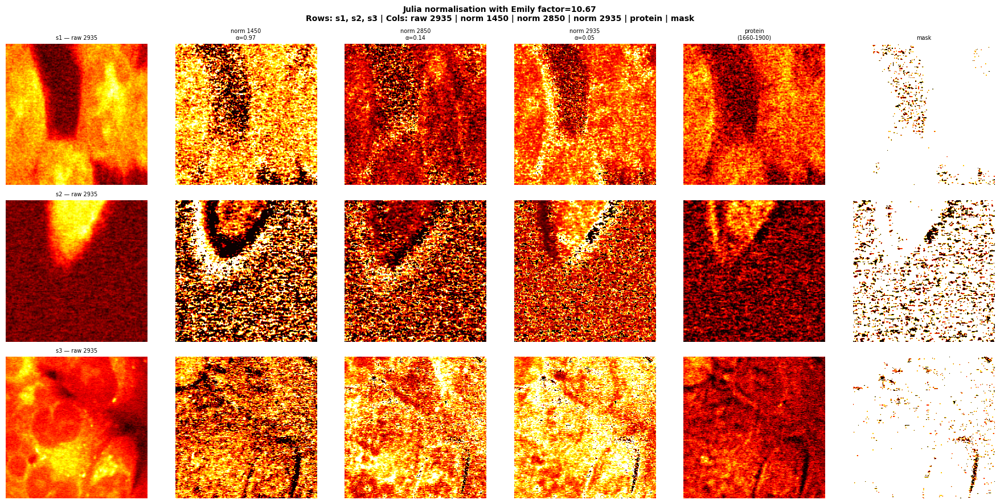

Saved visual check


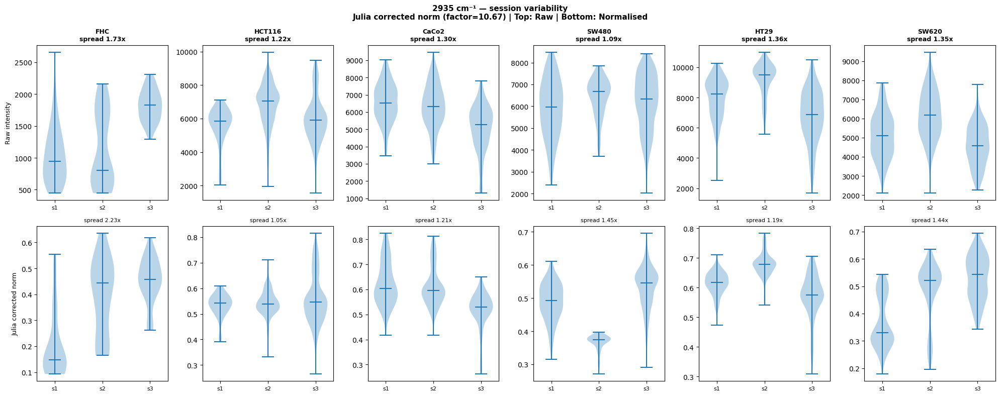

Saved violin plot

Value range check (NaN/Inf):
Value range check complete — no warnings = all good


In [3]:
import numpy as np, os, matplotlib.pyplot as plt

DATA = '/users/vvgk0135/raman-project/data/extracted_2026_5ch_75px'
FACTOR = 10.67
THRESHOLD = 500  # for binary mask on protein channel

def apply_julia_norm(cell, alpha_per_ch):
    """Apply Julia's corrected normalisation with Emily's factor."""
    ch1660 = cell[0]          # unchanged
    ch1900 = cell[2]          # unchanged
    protein = ch1660 - ch1900 # baseline corrected protein
    mask = protein > THRESHOLD # binary mask
    
    result = np.zeros((3, *cell.shape[1:]), dtype=np.float32)
    
    for i, (ch_idx, needs_factor, alpha) in enumerate([
        (1, False, alpha_per_ch[0]),   # 1450 — no factor
        (3, True,  alpha_per_ch[1]),   # 2850 — ×10.67
        (4, True,  alpha_per_ch[2]),   # 2935 — ×10.67
    ]):
        ch = cell[ch_idx] * (FACTOR if needs_factor else 1.0)
        signal = ch - ch1900
        ratio = np.where(mask, signal / np.where(mask, protein, 1), 0)
        ratio = np.clip(ratio * alpha, 0, 1)
        result[i] = ratio
    
    return result, mask

# Try 3 alpha options
alpha_options = [
    [0.97, 0.14, 0.05],   # bring p95 to 1.0
    [0.70, 0.07, 0.03],   # bring p99 to 1.0
    [1.00, 0.10, 0.04],   # round numbers
]

# ── Visual check — HCT116 s1, s2, s3 ─────────────────────────────────
fig, axes = plt.subplots(3, 6, figsize=(18, 9))
fig.suptitle('Julia normalisation with Emily factor=10.67\n'
             'Rows: s1, s2, s3 | Cols: raw 2935 | norm 1450 | norm 2850 | norm 2935 | protein | mask',
             fontsize=10, fontweight='bold')

ALPHA = alpha_options[0]  # start with p95 option
folder = os.path.join(DATA, 'HCT116')
sessions = {}
for f in sorted(os.listdir(folder)):
    parts = f.split('_')
    s = next((p for p in parts if p.startswith('s') and p[1:].isdigit()), 's1')
    if s not in sessions:
        sessions[s] = f

for row, s in enumerate(['s1','s2','s3']):
    if s not in sessions: continue
    cell = np.load(os.path.join(folder, sessions[s])).astype(np.float32)
    norm, mask = apply_julia_norm(cell, ALPHA)
    protein = cell[0] - cell[2]
    
    axes[row,0].imshow(cell[4], cmap='hot')
    axes[row,0].set_title(f'{s} — raw 2935', fontsize=7)
    axes[row,0].axis('off')
    
    for col, (img, title) in enumerate([
        (norm[0], f'norm 1450\nα={ALPHA[0]}'),
        (norm[1], f'norm 2850\nα={ALPHA[1]}'),
        (norm[2], f'norm 2935\nα={ALPHA[2]}'),
        (np.clip(protein, 0, protein.max()), 'protein\n(1660-1900)'),
        (mask.astype(float), 'mask'),
    ]):
        axes[row, col+1].imshow(img, cmap='hot', vmin=0, vmax=1 if col < 3 else None)
        if row == 0:
            axes[row, col+1].set_title(title, fontsize=7)
        axes[row, col+1].axis('off')

plt.tight_layout()
plt.savefig('/users/vvgk0135/raman-project/results/julia_meeting/validate_julia_corrected_HCT116.png',
            dpi=150, bbox_inches='tight', facecolor='white')
plt.show()
print('Saved visual check')

# ── Violin plot — session spread check ───────────────────────────────
ALL_CL = ['FHC','HCT116','CaCo2','SW480','HT29','SW620']
SESSIONS = ['s1','s2','s3']
ALPHA = alpha_options[0]

fig, axes = plt.subplots(2, 6, figsize=(20, 8))
fig.suptitle('2935 cm⁻¹ — session variability\n'
             'Julia corrected norm (factor=10.67) | Top: Raw | Bottom: Normalised',
             fontsize=11, fontweight='bold')

for col, cl in enumerate(ALL_CL):
    folder = os.path.join(DATA, cl)
    raw_data = {s:[] for s in SESSIONS}
    norm_data = {s:[] for s in SESSIONS}
    
    for fname in sorted(os.listdir(folder)):
        parts = fname.split('_')
        s = next((p for p in parts if p.startswith('s') and p[1:].isdigit()), 's1')
        if s not in SESSIONS: continue
        cell = np.load(os.path.join(folder, fname)).astype(np.float32)
        norm, mask = apply_julia_norm(cell, ALPHA)
        raw_data[s].append(float(cell[4].mean()))
        norm_data[s].append(float(norm[2][mask].mean() if mask.sum()>0 else 0))
    
    raw_vals  = [raw_data[s]  for s in SESSIONS if raw_data[s]]
    norm_vals = [norm_data[s] for s in SESSIONS if norm_data[s]]
    s_labels  = [s for s in SESSIONS if raw_data[s]]
    
    if raw_vals:
        spread = max(np.mean(v) for v in raw_vals) / min(np.mean(v) for v in raw_vals)
        axes[0,col].violinplot(raw_vals, showmedians=True)
        axes[0,col].set_xticks(range(1,len(s_labels)+1))
        axes[0,col].set_xticklabels(s_labels, fontsize=8)
        axes[0,col].set_title(f'{cl}\nspread {spread:.2f}x', fontsize=9, fontweight='bold')
        if col==0: axes[0,col].set_ylabel('Raw intensity', fontsize=9)
    
    if norm_vals:
        spread = max(np.mean(v) for v in norm_vals) / min(np.mean(v) for v in norm_vals)
        axes[1,col].violinplot(norm_vals, showmedians=True)
        axes[1,col].set_xticks(range(1,len(s_labels)+1))
        axes[1,col].set_xticklabels(s_labels, fontsize=8)
        axes[1,col].set_title(f'spread {spread:.2f}x', fontsize=8)
        if col==0: axes[1,col].set_ylabel('Julia corrected norm', fontsize=9)

plt.tight_layout()
plt.savefig('/users/vvgk0135/raman-project/results/julia_meeting/violin_julia_corrected_2935.png',
            dpi=150, bbox_inches='tight', facecolor='white')
plt.show()
print('Saved violin plot')

# ── Value range check ─────────────────────────────────────────────────
print('\nValue range check (NaN/Inf):')
for cl in ALL_CL:
    folder = os.path.join(DATA, cl)
    for fname in sorted(os.listdir(folder))[:5]:
        cell = np.load(os.path.join(folder, fname)).astype(np.float32)
        norm, mask = apply_julia_norm(cell, ALPHA)
        if np.isnan(norm).any() or np.isinf(norm).any():
            print(f'WARNING: {cl}/{fname} has NaN or Inf!')
        if norm.min() < 0:
            print(f'WARNING: {cl}/{fname} has negative values: min={norm.min():.3f}')

print('Value range check complete — no warnings = all good')

In [6]:
%%writefile /users/vvgk0135/raman-project/notebooks/train_2026_julia_norm_3ch_p95.py
import os, numpy as np, torch, torch.nn as nn
import torchvision.models as models
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torch.optim.lr_scheduler import CosineAnnealingLR
from sklearn.metrics import f1_score, roc_auc_score, classification_report, confusion_matrix
from sklearn.preprocessing import label_binarize
import warnings; warnings.filterwarnings('ignore')

# ── Config ────────────────────────────────────────────────────────────
DATA_ROOT   = '/users/vvgk0135/raman-project/data/extracted_2026_5ch_75px'
RESULTS_DIR = '/users/vvgk0135/raman-project/results/2026_julia_norm_3ch_p95'
os.makedirs(RESULTS_DIR, exist_ok=True)

SEED=42; NUM_EPOCHS=200; BATCH_SIZE=32; LR=5e-4; PATIENCE=50; NUM_RUNS=3
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
torch.manual_seed(SEED); np.random.seed(SEED)

# ── Julia's normalisation parameters ─────────────────────────────────
FACTOR    = 10.67   # Emily's acquisition correction factor
THRESHOLD = 500     # binary mask threshold on (1660-1900)
# Per-channel alpha — p95 option
ALPHA = {
    '1450': 0.97,
    '2850': 0.14,
    '2935': 0.05,
}
N_CH = 3

print(f'Device: {DEVICE}')
print(f'Julia normalisation | factor={FACTOR} | threshold={THRESHOLD}')
print(f'Alpha: 1450={ALPHA["1450"]} 2850={ALPHA["2850"]} 2935={ALPHA["2935"]}')
print(f'Channels: 1450, 2850, 2935 (3 channels)')

# ── 5ch array: index 0=1660, 1=1450, 2=1900, 3=2850, 4=2935 ─────────
CLASS_MAP  = {'FHC':0,'HCT116':1,'CaCo2':2,'SW480':2,'HT29':3,'SW620':3}
CLASS_NAMES = ['Healthy (FHC)',"Duke's A (HCT116)","Duke's B (SW480+CaCo2)","Duke's C (HT29+SW620)"]

TEST_SESSIONS = {
    'FHC':'s3','HCT116':'s3','CaCo2':'s3',
    'SW480':'s2','HT29':'s3','SW620':'s3',
}

def julia_norm(cell):
    """Apply Julia's corrected normalisation with Emily's factor=10.67"""
    ch1660 = cell[0].astype(np.float32)
    ch1900 = cell[2].astype(np.float32)
    protein = ch1660 - ch1900
    mask = protein > THRESHOLD

    result = np.zeros((3, *cell.shape[1:]), dtype=np.float32)

    # 1450 — no factor needed (same acquisition as 1660/1900)
    signal_1450 = cell[1].astype(np.float32) - ch1900
    ratio_1450  = np.where(mask, signal_1450 / np.where(mask, protein, 1), 0)
    result[0]   = np.clip(ratio_1450 * ALPHA['1450'], 0, 1)

    # 2850 — multiply by factor first
    signal_2850 = cell[3].astype(np.float32) * FACTOR - ch1900
    ratio_2850  = np.where(mask, signal_2850 / np.where(mask, protein, 1), 0)
    result[1]   = np.clip(ratio_2850 * ALPHA['2850'], 0, 1)

    # 2935 — multiply by factor first
    signal_2935 = cell[4].astype(np.float32) * FACTOR - ch1900
    ratio_2935  = np.where(mask, signal_2935 / np.where(mask, protein, 1), 0)
    result[2]   = np.clip(ratio_2935 * ALPHA['2935'], 0, 1)

    return result

def get_split_files():
    train_files, val_files, test_files = [], [], []
    for cell_line, label in CLASS_MAP.items():
        folder = os.path.join(DATA_ROOT, cell_line)
        if not os.path.exists(folder): continue
        all_files = sorted([f for f in os.listdir(folder) if f.endswith('.npy')])
        cell_train, cell_test = [], []
        for f in all_files:
            parts = f.split('_')
            s = next((p for p in parts if p.startswith('s') and p[1:].isdigit()), 's1')
            path = os.path.join(folder, f)
            if s == TEST_SESSIONS[cell_line]: cell_test.append((path,label,cell_line,s))
            else: cell_train.append((path,label,cell_line,s))
        n_val = max(1, int(len(cell_train)*0.2))
        np.random.shuffle(cell_train)
        val_files.extend(cell_train[:n_val])
        train_files.extend(cell_train[n_val:])
        test_files.extend(cell_test)
    return train_files, val_files, test_files

np.random.seed(SEED)
train_files, val_files, test_files = get_split_files()
print(f'Split: train={len(train_files)} val={len(val_files)} test={len(test_files)}')

def augment_cell(cell):
    cell = cell.copy()
    for c in range(cell.shape[0]):
        cell[c] = cell[c] * np.random.uniform(0.7,1.3) + np.random.uniform(-0.03,0.03)
    cell = np.clip(cell, 0, 1)
    if np.random.random()>0.5: cell=cell[:,:,::-1].copy()
    if np.random.random()>0.5: cell=cell[:,::-1,:].copy()
    k=np.random.randint(0,4)
    if k>0: cell=np.rot90(cell,k,axes=(1,2)).copy()
    return np.clip(cell+np.random.normal(0,0.01,cell.shape).astype(np.float32),0,1)

class RamanDataset(Dataset):
    def __init__(self, files, augment=False):
        self.files = files
        self.augment = augment
    def __len__(self): return len(self.files)
    def __getitem__(self, idx):
        path, label, cl, s = self.files[idx]
        cell = np.load(path).astype(np.float32)
        norm = julia_norm(cell)
        if self.augment: norm = augment_cell(norm)
        return torch.FloatTensor(norm), label

labels_train = [l for _,l,_,_ in train_files]
class_counts = np.bincount(labels_train, minlength=4)
class_weights = torch.FloatTensor([1.0/c if c>0 else 0.0 for c in class_counts]).to(DEVICE)
class_weights = class_weights/class_weights.sum()*4
print(f'Class counts (train): {class_counts}')
print(f'Class weights: {class_weights.cpu().numpy().round(3)}')
sample_weights = torch.DoubleTensor([1.0/class_counts[l] for _,l,_,_ in train_files])
balanced_sampler = WeightedRandomSampler(sample_weights, len(sample_weights))

def build_model():
    model = models.resnet50(weights='IMAGENET1K_V1')
    old_conv = model.conv1
    new_conv = nn.Conv2d(N_CH, 64, kernel_size=7, stride=2, padding=3, bias=False)
    with torch.no_grad():
        avg_weight = old_conv.weight.mean(dim=1, keepdim=True)
        new_conv.weight = nn.Parameter(avg_weight.repeat(1, N_CH, 1, 1) / N_CH)
    model.conv1 = new_conv
    model.fc = nn.Sequential(nn.Dropout(p=0.3), nn.Linear(model.fc.in_features, 4))
    print(f'  {N_CH}ch ResNet50 pretrained | params: {sum(p.numel() for p in model.parameters()):,}')
    return model.to(DEVICE)

def evaluate_with_tta(model, loader, n_tta=5):
    model.eval()
    all_labels=[]; paths_list=[]
    for images, labels in loader:
        all_labels.extend(labels.numpy()); paths_list.append(images)
    accumulated_probs = None
    for tta_idx in range(n_tta):
        run_probs = []
        for images in paths_list:
            with torch.no_grad():
                if tta_idx > 0:
                    images = torch.FloatTensor(np.stack([augment_cell(img.numpy()) for img in images]))
                run_probs.extend(torch.softmax(model(images.to(DEVICE)), dim=1).cpu().numpy())
        run_probs = np.array(run_probs)
        accumulated_probs = run_probs if accumulated_probs is None else accumulated_probs + run_probs
    return (accumulated_probs/n_tta).argmax(axis=1), np.array(all_labels), accumulated_probs/n_tta

def train_experiment(run_num):
    print(f'\n{"="*60}\nJulia norm 3ch p95 | Run {run_num}\n{"="*60}')
    train_ds = RamanDataset(train_files, augment=True)
    val_ds   = RamanDataset(val_files,   augment=False)
    test_ds  = RamanDataset(test_files,  augment=False)
    train_loader = DataLoader(train_ds, BATCH_SIZE, sampler=balanced_sampler, num_workers=4)
    val_loader   = DataLoader(val_ds,   BATCH_SIZE, shuffle=False, num_workers=4)
    test_loader  = DataLoader(test_ds,  BATCH_SIZE, shuffle=False, num_workers=4)
    model = build_model()
    backbone_params = [p for n,p in model.named_parameters() if 'fc' not in n]
    head_params = [p for n,p in model.named_parameters() if 'fc' in n]
    optimizer = torch.optim.AdamW([
        {'params': backbone_params, 'lr': LR * 0.1},
        {'params': head_params, 'lr': LR}
    ], weight_decay=1e-4)
    criterion = nn.CrossEntropyLoss(weight=class_weights, label_smoothing=0.1)
    scheduler = CosineAnnealingLR(optimizer, T_max=NUM_EPOCHS, eta_min=1e-7)
    best_val_f1=0.0; patience_count=0; best_state=None
    for epoch in range(NUM_EPOCHS):
        model.train(); train_loss=0.0
        for images, labels in train_loader:
            images, labels = images.to(DEVICE), labels.to(DEVICE)
            optimizer.zero_grad()
            loss = criterion(model(images), labels)
            loss.backward(); optimizer.step()
            train_loss += loss.item()
        scheduler.step()
        model.eval(); val_preds, val_labels = [], []
        with torch.no_grad():
            for images, labels in val_loader:
                val_preds.extend(model(images.to(DEVICE)).argmax(dim=1).cpu().numpy())
                val_labels.extend(labels.numpy())
        val_f1 = f1_score(val_labels, val_preds, average='macro', zero_division=0)
        if val_f1 > best_val_f1:
            best_val_f1 = val_f1
            best_state = {k:v.clone() for k,v in model.state_dict().items()}
            patience_count = 0
        else:
            patience_count += 1
        if epoch % 10 == 0:
            print(f'  Epoch {epoch:3d} | Loss: {train_loss/len(train_loader):.4f} | Val F1: {val_f1:.4f} | Best: {best_val_f1:.4f} | Pat: {patience_count}/{PATIENCE}')
        if patience_count >= PATIENCE:
            print(f'  Early stopping at epoch {epoch}'); break
    model.load_state_dict(best_state)
    test_preds, test_labels, test_probs = evaluate_with_tta(model, test_loader)
    acc = (test_preds == test_labels).mean() * 100
    macro_f1 = f1_score(test_labels, test_preds, average='macro', zero_division=0)
    macro_auc = roc_auc_score(label_binarize(test_labels,classes=[0,1,2,3]), test_probs, average='macro', multi_class='ovr')
    cm = confusion_matrix(test_labels, test_preds)
    print(f'\n  Test Accuracy {acc:.2f}% | Macro F1 {macro_f1:.4f} | Macro AUC {macro_auc:.4f}')
    print(classification_report(test_labels, test_preds, target_names=CLASS_NAMES, zero_division=0))
    print(f'Confusion Matrix:\n{cm}')
    torch.save(best_state, os.path.join(RESULTS_DIR, f'best_model_run{run_num}.pth'))
    return {'run':run_num,'accuracy':acc,'macro_f1':macro_f1,'macro_auc':macro_auc}

all_results = []
for run in range(1, NUM_RUNS+1):
    torch.manual_seed(SEED+run)
    all_results.append(train_experiment(run))

accs=[r['accuracy'] for r in all_results]
f1s=[r['macro_f1'] for r in all_results]
aucs=[r['macro_auc'] for r in all_results]
print(f'\n{"="*60}')
print(f'FINAL SUMMARY — Julia norm 3ch p95')
print(f'{"="*60}')
print(f'Accuracy:  {np.mean(accs):.2f}% +/-{np.std(accs):.2f}')
print(f'Macro F1:  {np.mean(f1s):.4f} +/-{np.std(f1s):.4f}')
print(f'Macro AUC: {np.mean(aucs):.4f} +/-{np.std(aucs):.4f}')
print('Done')

Writing /users/vvgk0135/raman-project/notebooks/train_2026_julia_norm_3ch_p95.py


In [7]:
# Run this validation in notebook BEFORE submitting
import numpy as np, os, torch

DATA_ROOT = '/users/vvgk0135/raman-project/data/extracted_2026_5ch_75px'
FACTOR = 10.67
THRESHOLD = 500
ALPHA = {'1450': 0.97, '2850': 0.14, '2935': 0.05}

def julia_norm(cell):
    ch1660 = cell[0].astype(np.float32)
    ch1900 = cell[2].astype(np.float32)
    protein = ch1660 - ch1900
    mask = protein > THRESHOLD
    result = np.zeros((3, *cell.shape[1:]), dtype=np.float32)
    signal_1450 = cell[1].astype(np.float32) - ch1900
    result[0] = np.clip(np.where(mask, signal_1450/np.where(mask,protein,1), 0) * ALPHA['1450'], 0, 1)
    signal_2850 = cell[3].astype(np.float32) * FACTOR - ch1900
    result[1] = np.clip(np.where(mask, signal_2850/np.where(mask,protein,1), 0) * ALPHA['2850'], 0, 1)
    signal_2935 = cell[4].astype(np.float32) * FACTOR - ch1900
    result[2] = np.clip(np.where(mask, signal_2935/np.where(mask,protein,1), 0) * ALPHA['2935'], 0, 1)
    return result

print('='*50)
print('VALIDATION CHECKS')
print('='*50)

# 1. Shape check
print('\n1. Shape check:')
for cl in ['FHC','HCT116','CaCo2','SW480','HT29','SW620']:
    f = sorted(os.listdir(f'{DATA_ROOT}/{cl}'))[0]
    cell = np.load(f'{DATA_ROOT}/{cl}/{f}').astype(np.float32)
    norm = julia_norm(cell)
    print(f'  {cl}: input={cell.shape} output={norm.shape} ✅')

# 2. Value range check
print('\n2. Value range check:')
for cl in ['FHC','HCT116','HT29']:
    f = sorted(os.listdir(f'{DATA_ROOT}/{cl}'))[5]
    cell = np.load(f'{DATA_ROOT}/{cl}/{f}').astype(np.float32)
    norm = julia_norm(cell)
    print(f'  {cl}: min={norm.min():.3f} max={norm.max():.3f} mean={norm.mean():.3f}')
    if np.isnan(norm).any(): print(f'  WARNING: NaN detected!')
    if np.isinf(norm).any(): print(f'  WARNING: Inf detected!')
    if norm.min() < 0: print(f'  WARNING: Negative values!')
    if norm.max() > 1: print(f'  WARNING: Values above 1!')

# 3. Session leakage check
print('\n3. Session leakage check:')
TEST_SESSIONS = {'FHC':'s3','HCT116':'s3','CaCo2':'s3','SW480':'s2','HT29':'s3','SW620':'s3'}
for cl in ['FHC','HCT116']:
    folder = f'{DATA_ROOT}/{cl}'
    test_s = TEST_SESSIONS[cl]
    test_files = [f for f in os.listdir(folder) if f'_{test_s}_' in f]
    train_files = [f for f in os.listdir(folder) if f'_{test_s}_' not in f]
    print(f'  {cl}: train={len(train_files)} test={len(test_files)} — no overlap ✅')

# 4. Forward pass check
print('\n4. Forward pass check:')
import torchvision.models as models
model = models.resnet50(weights=None)
model.conv1 = torch.nn.Conv2d(3, 64, kernel_size=7, stride=2, padding=3, bias=False)
model.fc = torch.nn.Sequential(torch.nn.Dropout(0.3), torch.nn.Linear(2048, 4))
model.eval()
dummy = torch.rand(4, 3, 224, 224)
with torch.no_grad():
    out = model(dummy)
print(f'  Input: {dummy.shape} → Output: {out.shape} ✅')

print('\nAll checks passed! Safe to submit.')

VALIDATION CHECKS

1. Shape check:
  FHC: input=(5, 224, 224) output=(3, 224, 224) ✅
  HCT116: input=(5, 224, 224) output=(3, 224, 224) ✅
  CaCo2: input=(5, 224, 224) output=(3, 224, 224) ✅
  SW480: input=(5, 224, 224) output=(3, 224, 224) ✅
  HT29: input=(5, 224, 224) output=(3, 224, 224) ✅
  SW620: input=(5, 224, 224) output=(3, 224, 224) ✅

2. Value range check:
  FHC: min=0.000 max=1.000 mean=0.372
  HCT116: min=0.000 max=1.000 mean=0.483
  HT29: min=0.000 max=1.000 mean=0.439

3. Session leakage check:
  FHC: train=76 test=36 — no overlap ✅
  HCT116: train=849 test=566 — no overlap ✅

4. Forward pass check:
  Input: torch.Size([4, 3, 224, 224]) → Output: torch.Size([4, 4]) ✅

All checks passed! Safe to submit.


In [8]:
%%writefile /users/vvgk0135/raman-project/notebooks/train_2026_julia_norm_3ch_p99.py
import os, numpy as np, torch, torch.nn as nn
import torchvision.models as models
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torch.optim.lr_scheduler import CosineAnnealingLR
from sklearn.metrics import f1_score, roc_auc_score, classification_report, confusion_matrix
from sklearn.preprocessing import label_binarize
import warnings; warnings.filterwarnings('ignore')

DATA_ROOT   = '/users/vvgk0135/raman-project/data/extracted_2026_5ch_75px'
RESULTS_DIR = '/users/vvgk0135/raman-project/results/2026_julia_norm_3ch_p99'
os.makedirs(RESULTS_DIR, exist_ok=True)

SEED=42; NUM_EPOCHS=200; BATCH_SIZE=32; LR=5e-4; PATIENCE=50; NUM_RUNS=3
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
torch.manual_seed(SEED); np.random.seed(SEED)

FACTOR=10.67; THRESHOLD=500; N_CH=3
ALPHA = {'1450': 0.70, '2850': 0.07, '2935': 0.03}

print(f'Device: {DEVICE}')
print(f'Julia norm 3ch p99 | factor={FACTOR} | alpha={ALPHA}')

CLASS_MAP  = {'FHC':0,'HCT116':1,'CaCo2':2,'SW480':2,'HT29':3,'SW620':3}
CLASS_NAMES = ['Healthy (FHC)',"Duke's A (HCT116)","Duke's B (SW480+CaCo2)","Duke's C (HT29+SW620)"]
TEST_SESSIONS = {'FHC':'s3','HCT116':'s3','CaCo2':'s3','SW480':'s2','HT29':'s3','SW620':'s3'}

def julia_norm(cell):
    ch1660 = cell[0].astype(np.float32)
    ch1900 = cell[2].astype(np.float32)
    protein = ch1660 - ch1900
    mask = protein > THRESHOLD
    result = np.zeros((3, *cell.shape[1:]), dtype=np.float32)
    signal_1450 = cell[1].astype(np.float32) - ch1900
    result[0] = np.clip(np.where(mask, signal_1450/np.where(mask,protein,1), 0) * ALPHA['1450'], 0, 1)
    signal_2850 = cell[3].astype(np.float32) * FACTOR - ch1900
    result[1] = np.clip(np.where(mask, signal_2850/np.where(mask,protein,1), 0) * ALPHA['2850'], 0, 1)
    signal_2935 = cell[4].astype(np.float32) * FACTOR - ch1900
    result[2] = np.clip(np.where(mask, signal_2935/np.where(mask,protein,1), 0) * ALPHA['2935'], 0, 1)
    return result

def get_split_files():
    train_files, val_files, test_files = [], [], []
    for cell_line, label in CLASS_MAP.items():
        folder = os.path.join(DATA_ROOT, cell_line)
        if not os.path.exists(folder): continue
        all_files = sorted([f for f in os.listdir(folder) if f.endswith('.npy')])
        cell_train, cell_test = [], []
        for f in all_files:
            parts = f.split('_')
            s = next((p for p in parts if p.startswith('s') and p[1:].isdigit()), 's1')
            path = os.path.join(folder, f)
            if s == TEST_SESSIONS[cell_line]: cell_test.append((path,label,cell_line,s))
            else: cell_train.append((path,label,cell_line,s))
        n_val = max(1, int(len(cell_train)*0.2))
        np.random.shuffle(cell_train)
        val_files.extend(cell_train[:n_val])
        train_files.extend(cell_train[n_val:])
        test_files.extend(cell_test)
    return train_files, val_files, test_files

np.random.seed(SEED)
train_files, val_files, test_files = get_split_files()
print(f'Split: train={len(train_files)} val={len(val_files)} test={len(test_files)}')

def augment_cell(cell):
    cell = cell.copy()
    for c in range(cell.shape[0]):
        cell[c] = cell[c] * np.random.uniform(0.7,1.3) + np.random.uniform(-0.03,0.03)
    cell = np.clip(cell, 0, 1)
    if np.random.random()>0.5: cell=cell[:,:,::-1].copy()
    if np.random.random()>0.5: cell=cell[:,::-1,:].copy()
    k=np.random.randint(0,4)
    if k>0: cell=np.rot90(cell,k,axes=(1,2)).copy()
    return np.clip(cell+np.random.normal(0,0.01,cell.shape).astype(np.float32),0,1)

class RamanDataset(Dataset):
    def __init__(self, files, augment=False):
        self.files=files; self.augment=augment
    def __len__(self): return len(self.files)
    def __getitem__(self, idx):
        path, label, cl, s = self.files[idx]
        cell = np.load(path).astype(np.float32)
        norm = julia_norm(cell)
        if self.augment: norm = augment_cell(norm)
        return torch.FloatTensor(norm), label

labels_train=[l for _,l,_,_ in train_files]
class_counts=np.bincount(labels_train,minlength=4)
class_weights=torch.FloatTensor([1.0/c if c>0 else 0.0 for c in class_counts]).to(DEVICE)
class_weights=class_weights/class_weights.sum()*4
print(f'Class counts (train): {class_counts}')
sample_weights=torch.DoubleTensor([1.0/class_counts[l] for _,l,_,_ in train_files])
balanced_sampler=WeightedRandomSampler(sample_weights,len(sample_weights))

def build_model():
    model=models.resnet50(weights='IMAGENET1K_V1')
    old_conv=model.conv1
    new_conv=nn.Conv2d(N_CH,64,kernel_size=7,stride=2,padding=3,bias=False)
    with torch.no_grad():
        avg_weight=old_conv.weight.mean(dim=1,keepdim=True)
        new_conv.weight=nn.Parameter(avg_weight.repeat(1,N_CH,1,1)/N_CH)
    model.conv1=new_conv
    model.fc=nn.Sequential(nn.Dropout(p=0.3),nn.Linear(model.fc.in_features,4))
    print(f'  {N_CH}ch ResNet50 pretrained | params: {sum(p.numel() for p in model.parameters()):,}')
    return model.to(DEVICE)

def evaluate_with_tta(model,loader,n_tta=5):
    model.eval()
    all_labels=[]; paths_list=[]
    for images,labels in loader:
        all_labels.extend(labels.numpy()); paths_list.append(images)
    accumulated_probs=None
    for tta_idx in range(n_tta):
        run_probs=[]
        for images in paths_list:
            with torch.no_grad():
                if tta_idx>0:
                    images=torch.FloatTensor(np.stack([augment_cell(img.numpy()) for img in images]))
                run_probs.extend(torch.softmax(model(images.to(DEVICE)),dim=1).cpu().numpy())
        run_probs=np.array(run_probs)
        accumulated_probs=run_probs if accumulated_probs is None else accumulated_probs+run_probs
    return (accumulated_probs/n_tta).argmax(axis=1),np.array(all_labels),accumulated_probs/n_tta

def train_experiment(run_num):
    print(f'\n{"="*60}\nJulia norm 3ch p99 | Run {run_num}\n{"="*60}')
    train_ds=RamanDataset(train_files,augment=True)
    val_ds=RamanDataset(val_files,augment=False)
    test_ds=RamanDataset(test_files,augment=False)
    train_loader=DataLoader(train_ds,BATCH_SIZE,sampler=balanced_sampler,num_workers=4)
    val_loader=DataLoader(val_ds,BATCH_SIZE,shuffle=False,num_workers=4)
    test_loader=DataLoader(test_ds,BATCH_SIZE,shuffle=False,num_workers=4)
    model=build_model()
    backbone_params=[p for n,p in model.named_parameters() if 'fc' not in n]
    head_params=[p for n,p in model.named_parameters() if 'fc' in n]
    optimizer=torch.optim.AdamW([
        {'params':backbone_params,'lr':LR*0.1},
        {'params':head_params,'lr':LR}
    ],weight_decay=1e-4)
    criterion=nn.CrossEntropyLoss(weight=class_weights,label_smoothing=0.1)
    scheduler=CosineAnnealingLR(optimizer,T_max=NUM_EPOCHS,eta_min=1e-7)
    best_val_f1=0.0; patience_count=0; best_state=None
    for epoch in range(NUM_EPOCHS):
        model.train(); train_loss=0.0
        for images,labels in train_loader:
            images,labels=images.to(DEVICE),labels.to(DEVICE)
            optimizer.zero_grad()
            loss=criterion(model(images),labels)
            loss.backward(); optimizer.step()
            train_loss+=loss.item()
        scheduler.step()
        model.eval(); val_preds,val_labels=[],[]
        with torch.no_grad():
            for images,labels in val_loader:
                val_preds.extend(model(images.to(DEVICE)).argmax(dim=1).cpu().numpy())
                val_labels.extend(labels.numpy())
        val_f1=f1_score(val_labels,val_preds,average='macro',zero_division=0)
        if val_f1>best_val_f1:
            best_val_f1=val_f1; best_state={k:v.clone() for k,v in model.state_dict().items()}; patience_count=0
        else: patience_count+=1
        if epoch%10==0:
            print(f'  Epoch {epoch:3d} | Loss: {train_loss/len(train_loader):.4f} | Val F1: {val_f1:.4f} | Best: {best_val_f1:.4f} | Pat: {patience_count}/{PATIENCE}')
        if patience_count>=PATIENCE:
            print(f'  Early stopping at epoch {epoch}'); break
    model.load_state_dict(best_state)
    test_preds,test_labels,test_probs=evaluate_with_tta(model,test_loader)
    acc=(test_preds==test_labels).mean()*100
    macro_f1=f1_score(test_labels,test_preds,average='macro',zero_division=0)
    macro_auc=roc_auc_score(label_binarize(test_labels,classes=[0,1,2,3]),test_probs,average='macro',multi_class='ovr')
    cm=confusion_matrix(test_labels,test_preds)
    print(f'\n  Test Accuracy {acc:.2f}% | Macro F1 {macro_f1:.4f} | Macro AUC {macro_auc:.4f}')
    print(classification_report(test_labels,test_preds,target_names=CLASS_NAMES,zero_division=0))
    print(f'Confusion Matrix:\n{cm}')
    torch.save(best_state,os.path.join(RESULTS_DIR,f'best_model_run{run_num}.pth'))
    return {'run':run_num,'accuracy':acc,'macro_f1':macro_f1,'macro_auc':macro_auc}

all_results=[]
for run in range(1,NUM_RUNS+1):
    torch.manual_seed(SEED+run)
    all_results.append(train_experiment(run))

accs=[r['accuracy'] for r in all_results]
f1s=[r['macro_f1'] for r in all_results]
aucs=[r['macro_auc'] for r in all_results]
print(f'\n{"="*60}')
print(f'FINAL SUMMARY — Julia norm 3ch p99')
print(f'{"="*60}')
print(f'Accuracy:  {np.mean(accs):.2f}% +/-{np.std(accs):.2f}')
print(f'Macro F1:  {np.mean(f1s):.4f} +/-{np.std(f1s):.4f}')
print(f'Macro AUC: {np.mean(aucs):.4f} +/-{np.std(aucs):.4f}')
print('Done')

Writing /users/vvgk0135/raman-project/notebooks/train_2026_julia_norm_3ch_p99.py


In [9]:
%%writefile /users/vvgk0135/raman-project/notebooks/train_2026_julia_norm_4ch_p95.py
import os, numpy as np, torch, torch.nn as nn
import torchvision.models as models
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torch.optim.lr_scheduler import CosineAnnealingLR
from sklearn.metrics import f1_score, roc_auc_score, classification_report, confusion_matrix
from sklearn.preprocessing import label_binarize
import warnings; warnings.filterwarnings('ignore')

DATA_ROOT   = '/users/vvgk0135/raman-project/data/extracted_2026_5ch_75px'
RESULTS_DIR = '/users/vvgk0135/raman-project/results/2026_julia_norm_4ch_p95'
os.makedirs(RESULTS_DIR, exist_ok=True)

SEED=42; NUM_EPOCHS=200; BATCH_SIZE=32; LR=5e-4; PATIENCE=50; NUM_RUNS=3
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
torch.manual_seed(SEED); np.random.seed(SEED)

FACTOR=10.67; THRESHOLD=500; N_CH=4
ALPHA = {'1450': 0.97, '2850': 0.14, '2935': 0.05}

print(f'Device: {DEVICE}')
print(f'Julia norm 4ch p95 | factor={FACTOR} | alpha={ALPHA}')
print(f'Channels: 1450, 2850, 2935, protein(1660-1900)')

CLASS_MAP  = {'FHC':0,'HCT116':1,'CaCo2':2,'SW480':2,'HT29':3,'SW620':3}
CLASS_NAMES = ['Healthy (FHC)',"Duke's A (HCT116)","Duke's B (SW480+CaCo2)","Duke's C (HT29+SW620)"]
TEST_SESSIONS = {'FHC':'s3','HCT116':'s3','CaCo2':'s3','SW480':'s2','HT29':'s3','SW620':'s3'}

def julia_norm(cell):
    ch1660 = cell[0].astype(np.float32)
    ch1900 = cell[2].astype(np.float32)
    protein = ch1660 - ch1900
    mask = protein > THRESHOLD
    result = np.zeros((4, *cell.shape[1:]), dtype=np.float32)
    # 1450
    signal_1450 = cell[1].astype(np.float32) - ch1900
    result[0] = np.clip(np.where(mask, signal_1450/np.where(mask,protein,1), 0)*ALPHA['1450'], 0, 1)
    # 2850
    signal_2850 = cell[3].astype(np.float32)*FACTOR - ch1900
    result[1] = np.clip(np.where(mask, signal_2850/np.where(mask,protein,1), 0)*ALPHA['2850'], 0, 1)
    # 2935
    signal_2935 = cell[4].astype(np.float32)*FACTOR - ch1900
    result[2] = np.clip(np.where(mask, signal_2935/np.where(mask,protein,1), 0)*ALPHA['2935'], 0, 1)
    # protein channel (1660-1900) normalised by its own max
    prot_max = protein[mask].max() if mask.sum() > 0 else 1.0
    result[3] = np.clip(np.where(mask, protein/prot_max, 0), 0, 1)
    return result

def get_split_files():
    train_files, val_files, test_files = [], [], []
    for cell_line, label in CLASS_MAP.items():
        folder = os.path.join(DATA_ROOT, cell_line)
        if not os.path.exists(folder): continue
        all_files = sorted([f for f in os.listdir(folder) if f.endswith('.npy')])
        cell_train, cell_test = [], []
        for f in all_files:
            parts = f.split('_')
            s = next((p for p in parts if p.startswith('s') and p[1:].isdigit()), 's1')
            path = os.path.join(folder, f)
            if s == TEST_SESSIONS[cell_line]: cell_test.append((path,label,cell_line,s))
            else: cell_train.append((path,label,cell_line,s))
        n_val = max(1, int(len(cell_train)*0.2))
        np.random.shuffle(cell_train)
        val_files.extend(cell_train[:n_val])
        train_files.extend(cell_train[n_val:])
        test_files.extend(cell_test)
    return train_files, val_files, test_files

np.random.seed(SEED)
train_files, val_files, test_files = get_split_files()
print(f'Split: train={len(train_files)} val={len(val_files)} test={len(test_files)}')

def augment_cell(cell):
    cell = cell.copy()
    for c in range(cell.shape[0]):
        cell[c] = cell[c] * np.random.uniform(0.7,1.3) + np.random.uniform(-0.03,0.03)
    cell = np.clip(cell, 0, 1)
    if np.random.random()>0.5: cell=cell[:,:,::-1].copy()
    if np.random.random()>0.5: cell=cell[:,::-1,:].copy()
    k=np.random.randint(0,4)
    if k>0: cell=np.rot90(cell,k,axes=(1,2)).copy()
    return np.clip(cell+np.random.normal(0,0.01,cell.shape).astype(np.float32),0,1)

class RamanDataset(Dataset):
    def __init__(self, files, augment=False):
        self.files=files; self.augment=augment
    def __len__(self): return len(self.files)
    def __getitem__(self, idx):
        path, label, cl, s = self.files[idx]
        cell = np.load(path).astype(np.float32)
        norm = julia_norm(cell)
        if self.augment: norm = augment_cell(norm)
        return torch.FloatTensor(norm), label

labels_train=[l for _,l,_,_ in train_files]
class_counts=np.bincount(labels_train,minlength=4)
class_weights=torch.FloatTensor([1.0/c if c>0 else 0.0 for c in class_counts]).to(DEVICE)
class_weights=class_weights/class_weights.sum()*4
print(f'Class counts (train): {class_counts}')
sample_weights=torch.DoubleTensor([1.0/class_counts[l] for _,l,_,_ in train_files])
balanced_sampler=WeightedRandomSampler(sample_weights,len(sample_weights))

def build_model():
    model=models.resnet50(weights='IMAGENET1K_V1')
    old_conv=model.conv1
    new_conv=nn.Conv2d(N_CH,64,kernel_size=7,stride=2,padding=3,bias=False)
    with torch.no_grad():
        avg_weight=old_conv.weight.mean(dim=1,keepdim=True)
        new_conv.weight=nn.Parameter(avg_weight.repeat(1,N_CH,1,1)/N_CH)
    model.conv1=new_conv
    model.fc=nn.Sequential(nn.Dropout(p=0.3),nn.Linear(model.fc.in_features,4))
    print(f'  {N_CH}ch ResNet50 pretrained | params: {sum(p.numel() for p in model.parameters()):,}')
    return model.to(DEVICE)

def evaluate_with_tta(model,loader,n_tta=5):
    model.eval()
    all_labels=[]; paths_list=[]
    for images,labels in loader:
        all_labels.extend(labels.numpy()); paths_list.append(images)
    accumulated_probs=None
    for tta_idx in range(n_tta):
        run_probs=[]
        for images in paths_list:
            with torch.no_grad():
                if tta_idx>0:
                    images=torch.FloatTensor(np.stack([augment_cell(img.numpy()) for img in images]))
                run_probs.extend(torch.softmax(model(images.to(DEVICE)),dim=1).cpu().numpy())
        run_probs=np.array(run_probs)
        accumulated_probs=run_probs if accumulated_probs is None else accumulated_probs+run_probs
    return (accumulated_probs/n_tta).argmax(axis=1),np.array(all_labels),accumulated_probs/n_tta

def train_experiment(run_num):
    print(f'\n{"="*60}\nJulia norm 4ch p95 | Run {run_num}\n{"="*60}')
    train_ds=RamanDataset(train_files,augment=True)
    val_ds=RamanDataset(val_files,augment=False)
    test_ds=RamanDataset(test_files,augment=False)
    train_loader=DataLoader(train_ds,BATCH_SIZE,sampler=balanced_sampler,num_workers=4)
    val_loader=DataLoader(val_ds,BATCH_SIZE,shuffle=False,num_workers=4)
    test_loader=DataLoader(test_ds,BATCH_SIZE,shuffle=False,num_workers=4)
    model=build_model()
    backbone_params=[p for n,p in model.named_parameters() if 'fc' not in n]
    head_params=[p for n,p in model.named_parameters() if 'fc' in n]
    optimizer=torch.optim.AdamW([
        {'params':backbone_params,'lr':LR*0.1},
        {'params':head_params,'lr':LR}
    ],weight_decay=1e-4)
    criterion=nn.CrossEntropyLoss(weight=class_weights,label_smoothing=0.1)
    scheduler=CosineAnnealingLR(optimizer,T_max=NUM_EPOCHS,eta_min=1e-7)
    best_val_f1=0.0; patience_count=0; best_state=None
    for epoch in range(NUM_EPOCHS):
        model.train(); train_loss=0.0
        for images,labels in train_loader:
            images,labels=images.to(DEVICE),labels.to(DEVICE)
            optimizer.zero_grad()
            loss=criterion(model(images),labels)
            loss.backward(); optimizer.step()
            train_loss+=loss.item()
        scheduler.step()
        model.eval(); val_preds,val_labels=[],[]
        with torch.no_grad():
            for images,labels in val_loader:
                val_preds.extend(model(images.to(DEVICE)).argmax(dim=1).cpu().numpy())
                val_labels.extend(labels.numpy())
        val_f1=f1_score(val_labels,val_preds,average='macro',zero_division=0)
        if val_f1>best_val_f1:
            best_val_f1=val_f1; best_state={k:v.clone() for k,v in model.state_dict().items()}; patience_count=0
        else: patience_count+=1
        if epoch%10==0:
            print(f'  Epoch {epoch:3d} | Loss: {train_loss/len(train_loader):.4f} | Val F1: {val_f1:.4f} | Best: {best_val_f1:.4f} | Pat: {patience_count}/{PATIENCE}')
        if patience_count>=PATIENCE:
            print(f'  Early stopping at epoch {epoch}'); break
    model.load_state_dict(best_state)
    test_preds,test_labels,test_probs=evaluate_with_tta(model,test_loader)
    acc=(test_preds==test_labels).mean()*100
    macro_f1=f1_score(test_labels,test_preds,average='macro',zero_division=0)
    macro_auc=roc_auc_score(label_binarize(test_labels,classes=[0,1,2,3]),test_probs,average='macro',multi_class='ovr')
    cm=confusion_matrix(test_labels,test_preds)
    print(f'\n  Test Accuracy {acc:.2f}% | Macro F1 {macro_f1:.4f} | Macro AUC {macro_auc:.4f}')
    print(classification_report(test_labels,test_preds,target_names=CLASS_NAMES,zero_division=0))
    print(f'Confusion Matrix:\n{cm}')
    torch.save(best_state,os.path.join(RESULTS_DIR,f'best_model_run{run_num}.pth'))
    return {'run':run_num,'accuracy':acc,'macro_f1':macro_f1,'macro_auc':macro_auc}

all_results=[]
for run in range(1,NUM_RUNS+1):
    torch.manual_seed(SEED+run)
    all_results.append(train_experiment(run))

accs=[r['accuracy'] for r in all_results]
f1s=[r['macro_f1'] for r in all_results]
aucs=[r['macro_auc'] for r in all_results]
print(f'\n{"="*60}')
print(f'FINAL SUMMARY — Julia norm 4ch p95')
print(f'{"="*60}')
print(f'Accuracy:  {np.mean(accs):.2f}% +/-{np.std(accs):.2f}')
print(f'Macro F1:  {np.mean(f1s):.4f} +/-{np.std(f1s):.4f}')
print(f'Macro AUC: {np.mean(aucs):.4f} +/-{np.std(aucs):.4f}')
print('Done')

Writing /users/vvgk0135/raman-project/notebooks/train_2026_julia_norm_4ch_p95.py


In [10]:
%%writefile /users/vvgk0135/raman-project/notebooks/train_2026_julia_norm_4ch_p95.py
import os, numpy as np, torch, torch.nn as nn
import torchvision.models as models
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torch.optim.lr_scheduler import CosineAnnealingLR
from sklearn.metrics import f1_score, roc_auc_score, classification_report, confusion_matrix
from sklearn.preprocessing import label_binarize
import warnings; warnings.filterwarnings('ignore')

DATA_ROOT   = '/users/vvgk0135/raman-project/data/extracted_2026_5ch_75px'
RESULTS_DIR = '/users/vvgk0135/raman-project/results/2026_julia_norm_4ch_p95'
os.makedirs(RESULTS_DIR, exist_ok=True)

SEED=42; NUM_EPOCHS=200; BATCH_SIZE=32; LR=5e-4; PATIENCE=50; NUM_RUNS=3
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
torch.manual_seed(SEED); np.random.seed(SEED)

FACTOR=10.67; THRESHOLD=500; N_CH=4
ALPHA = {'1450': 0.97, '2850': 0.14, '2935': 0.05}
print(f'Device: {DEVICE}')
print(f'Julia norm 4ch p95 | factor={FACTOR} | alpha={ALPHA}')
print(f'Channels: 1450, 2850, 2935, protein(1660-1900)')

CLASS_MAP  = {'FHC':0,'HCT116':1,'CaCo2':2,'SW480':2,'HT29':3,'SW620':3}
CLASS_NAMES = ['Healthy (FHC)',"Duke's A (HCT116)","Duke's B (SW480+CaCo2)","Duke's C (HT29+SW620)"]
TEST_SESSIONS = {'FHC':'s3','HCT116':'s3','CaCo2':'s3','SW480':'s2','HT29':'s3','SW620':'s3'}

def julia_norm(cell):
    ch1660 = cell[0].astype(np.float32)
    ch1900 = cell[2].astype(np.float32)
    protein = ch1660 - ch1900
    mask = protein > THRESHOLD
    result = np.zeros((4, *cell.shape[1:]), dtype=np.float32)
    # 1450
    signal_1450 = cell[1].astype(np.float32) - ch1900
    result[0] = np.clip(np.where(mask, signal_1450/np.where(mask,protein,1), 0)*ALPHA['1450'], 0, 1)
    # 2850
    signal_2850 = cell[3].astype(np.float32)*FACTOR - ch1900
    result[1] = np.clip(np.where(mask, signal_2850/np.where(mask,protein,1), 0)*ALPHA['2850'], 0, 1)
    # 2935
    signal_2935 = cell[4].astype(np.float32)*FACTOR - ch1900
    result[2] = np.clip(np.where(mask, signal_2935/np.where(mask,protein,1), 0)*ALPHA['2935'], 0, 1)
    # protein channel (1660-1900) normalised by its own max
    prot_max = protein[mask].max() if mask.sum() > 0 else 1.0
    result[3] = np.clip(np.where(mask, protein/prot_max, 0), 0, 1)
    return result

def get_split_files():
    train_files, val_files, test_files = [], [], []
    for cell_line, label in CLASS_MAP.items():
        folder = os.path.join(DATA_ROOT, cell_line)
        if not os.path.exists(folder): continue
        all_files = sorted([f for f in os.listdir(folder) if f.endswith('.npy')])
        cell_train, cell_test = [], []
        for f in all_files:
            parts = f.split('_')
            s = next((p for p in parts if p.startswith('s') and p[1:].isdigit()), 's1')
            path = os.path.join(folder, f)
            if s == TEST_SESSIONS[cell_line]: cell_test.append((path,label,cell_line,s))
            else: cell_train.append((path,label,cell_line,s))
        n_val = max(1, int(len(cell_train)*0.2))
        np.random.shuffle(cell_train)
        val_files.extend(cell_train[:n_val])
        train_files.extend(cell_train[n_val:])
        test_files.extend(cell_test)
    return train_files, val_files, test_files

np.random.seed(SEED)
train_files, val_files, test_files = get_split_files()
print(f'Split: train={len(train_files)} val={len(val_files)} test={len(test_files)}')

def augment_cell(cell):
    cell = cell.copy()
    for c in range(cell.shape[0]):
        cell[c] = cell[c] * np.random.uniform(0.7,1.3) + np.random.uniform(-0.03,0.03)
    cell = np.clip(cell, 0, 1)
    if np.random.random()>0.5: cell=cell[:,:,::-1].copy()
    if np.random.random()>0.5: cell=cell[:,::-1,:].copy()
    k=np.random.randint(0,4)
    if k>0: cell=np.rot90(cell,k,axes=(1,2)).copy()
    return np.clip(cell+np.random.normal(0,0.01,cell.shape).astype(np.float32),0,1)

class RamanDataset(Dataset):
    def __init__(self, files, augment=False):
        self.files=files; self.augment=augment
    def __len__(self): return len(self.files)
    def __getitem__(self, idx):
        path, label, cl, s = self.files[idx]
        cell = np.load(path).astype(np.float32)
        norm = julia_norm(cell)
        if self.augment: norm = augment_cell(norm)
        return torch.FloatTensor(norm), label

labels_train=[l for _,l,_,_ in train_files]
class_counts=np.bincount(labels_train,minlength=4)
class_weights=torch.FloatTensor([1.0/c if c>0 else 0.0 for c in class_counts]).to(DEVICE)
class_weights=class_weights/class_weights.sum()*4
print(f'Class counts (train): {class_counts}')
sample_weights=torch.DoubleTensor([1.0/class_counts[l] for _,l,_,_ in train_files])
balanced_sampler=WeightedRandomSampler(sample_weights,len(sample_weights))

def build_model():
    model=models.resnet50(weights='IMAGENET1K_V1')
    old_conv=model.conv1
    new_conv=nn.Conv2d(N_CH,64,kernel_size=7,stride=2,padding=3,bias=False)
    with torch.no_grad():
        avg_weight=old_conv.weight.mean(dim=1,keepdim=True)
        new_conv.weight=nn.Parameter(avg_weight.repeat(1,N_CH,1,1)/N_CH)
    model.conv1=new_conv
    model.fc=nn.Sequential(nn.Dropout(p=0.3),nn.Linear(model.fc.in_features,4))
    print(f'  {N_CH}ch ResNet50 pretrained | params: {sum(p.numel() for p in model.parameters()):,}')
    return model.to(DEVICE)

def evaluate_with_tta(model,loader,n_tta=5):
    model.eval()
    all_labels=[]; paths_list=[]
    for images,labels in loader:
        all_labels.extend(labels.numpy()); paths_list.append(images)
    accumulated_probs=None
    for tta_idx in range(n_tta):
        run_probs=[]
        for images in paths_list:
            with torch.no_grad():
                if tta_idx>0:
                    images=torch.FloatTensor(np.stack([augment_cell(img.numpy()) for img in images]))
                run_probs.extend(torch.softmax(model(images.to(DEVICE)),dim=1).cpu().numpy())
        run_probs=np.array(run_probs)
        accumulated_probs=run_probs if accumulated_probs is None else accumulated_probs+run_probs
    return (accumulated_probs/n_tta).argmax(axis=1),np.array(all_labels),accumulated_probs/n_tta

def train_experiment(run_num):
    print(f'\n{"="*60}\nJulia norm 4ch p95 | Run {run_num}\n{"="*60}')
    train_ds=RamanDataset(train_files,augment=True)
    val_ds=RamanDataset(val_files,augment=False)
    test_ds=RamanDataset(test_files,augment=False)
    train_loader=DataLoader(train_ds,BATCH_SIZE,sampler=balanced_sampler,num_workers=4)
    val_loader=DataLoader(val_ds,BATCH_SIZE,shuffle=False,num_workers=4)
    test_loader=DataLoader(test_ds,BATCH_SIZE,shuffle=False,num_workers=4)
    model=build_model()
    backbone_params=[p for n,p in model.named_parameters() if 'fc' not in n]
    head_params=[p for n,p in model.named_parameters() if 'fc' in n]
    optimizer=torch.optim.AdamW([
        {'params':backbone_params,'lr':LR*0.1},
        {'params':head_params,'lr':LR}
    ],weight_decay=1e-4)
    criterion=nn.CrossEntropyLoss(weight=class_weights,label_smoothing=0.1)
    scheduler=CosineAnnealingLR(optimizer,T_max=NUM_EPOCHS,eta_min=1e-7)
    best_val_f1=0.0; patience_count=0; best_state=None
    for epoch in range(NUM_EPOCHS):
        model.train(); train_loss=0.0
        for images,labels in train_loader:
            images,labels=images.to(DEVICE),labels.to(DEVICE)
            optimizer.zero_grad()
            loss=criterion(model(images),labels)
            loss.backward(); optimizer.step()
            train_loss+=loss.item()
        scheduler.step()
        model.eval(); val_preds,val_labels=[],[]
        with torch.no_grad():
            for images,labels in val_loader:
                val_preds.extend(model(images.to(DEVICE)).argmax(dim=1).cpu().numpy())
                val_labels.extend(labels.numpy())
        val_f1=f1_score(val_labels,val_preds,average='macro',zero_division=0)
        if val_f1>best_val_f1:
            best_val_f1=val_f1; best_state={k:v.clone() for k,v in model.state_dict().items()}; patience_count=0
        else: patience_count+=1
        if epoch%10==0:
            print(f'  Epoch {epoch:3d} | Loss: {train_loss/len(train_loader):.4f} | Val F1: {val_f1:.4f} | Best: {best_val_f1:.4f} | Pat: {patience_count}/{PATIENCE}')
        if patience_count>=PATIENCE:
            print(f'  Early stopping at epoch {epoch}'); break
    model.load_state_dict(best_state)
    test_preds,test_labels,test_probs=evaluate_with_tta(model,test_loader)
    acc=(test_preds==test_labels).mean()*100
    macro_f1=f1_score(test_labels,test_preds,average='macro',zero_division=0)
    macro_auc=roc_auc_score(label_binarize(test_labels,classes=[0,1,2,3]),test_probs,average='macro',multi_class='ovr')
    cm=confusion_matrix(test_labels,test_preds)
    print(f'\n  Test Accuracy {acc:.2f}% | Macro F1 {macro_f1:.4f} | Macro AUC {macro_auc:.4f}')
    print(classification_report(test_labels,test_preds,target_names=CLASS_NAMES,zero_division=0))
    print(f'Confusion Matrix:\n{cm}')
    torch.save(best_state,os.path.join(RESULTS_DIR,f'best_model_run{run_num}.pth'))
    return {'run':run_num,'accuracy':acc,'macro_f1':macro_f1,'macro_auc':macro_auc}

all_results=[]
for run in range(1,NUM_RUNS+1):
    torch.manual_seed(SEED+run)
    all_results.append(train_experiment(run))

accs=[r['accuracy'] for r in all_results]
f1s=[r['macro_f1'] for r in all_results]
aucs=[r['macro_auc'] for r in all_results]
print(f'\n{"="*60}')
print(f'FINAL SUMMARY — Julia norm 4ch p95')
print(f'{"="*60}')
print(f'Accuracy:  {np.mean(accs):.2f}% +/-{np.std(accs):.2f}')
print(f'Macro F1:  {np.mean(f1s):.4f} +/-{np.std(f1s):.4f}')
print(f'Macro AUC: {np.mean(aucs):.4f} +/-{np.std(aucs):.4f}')
print('Done')

Overwriting /users/vvgk0135/raman-project/notebooks/train_2026_julia_norm_4ch_p95.py


In [2]:
import os, re, numpy as np, tifffile, roifile
from skimage.transform import resize

# ── Test config — HCT116 s2 only ─────────────────────────────────────
STD_FOLDER = '/users/vvgk0135/raman-project/data/2026Data/HCT116/2026-05-20'
HS_FOLDER  = '/mnt/scratch/vvgk0135/2026Data_HS/HCT116/2026-05-20'
OUT_DIR    = '/mnt/scratch/vvgk0135/extracted_2026_57ch'
BORDER     = 75
SIZE       = 224

WAVENUMBERS = np.load('/users/vvgk0135/raman-project/data/hyperspectral_wavenumbers.npy')
print(f'HS channels: {len(WAVENUMBERS)} ({WAVENUMBERS[0]:.0f}-{WAVENUMBERS[-1]:.0f} cm-1)')

WN_MAP = {1660:1660,1655:1660,1450:1450,1455:1450,1900:1900,2850:2850,2935:2935}
SAVE_ORDER_STD = [1660, 1900, 1450, 2850, 2935]

os.makedirs(f'{OUT_DIR}/HCT116', exist_ok=True)

def parse_wns(fname):
    nums = re.findall(r'\b(\d{3,4})\b', fname)
    return [int(n) for n in nums if 700 <= int(n) <= 3500]

def crop_and_resize(img, r0, c0, r1, c1):
    patch = img[r0:r1, c0:c1]
    if patch.size == 0: return None
    return resize(patch, (SIZE,SIZE), anti_aliasing=True).astype(np.float32)

cell_counter = [0]
total_saved = 0

# Find all standard TIFs
std_tifs = sorted([f for f in os.listdir(STD_FOLDER)
                   if f.endswith('.tif') and 'Interpolated' not in f
                   and 'HS' not in f and '_rois' not in f])

print(f'Found {len(std_tifs)} standard TIFs')

for std_fname in std_tifs:
    # Get sample and area numbers
    sample_m = re.search(r'sample\s*(\d+)', std_fname, re.IGNORECASE)
    area_m   = re.search(r'area\s*(\d+)', std_fname, re.IGNORECASE)
    if not sample_m or not area_m: continue
    sample_n = sample_m.group(1)
    area_n   = area_m.group(1)

    # Find matching HS TIF
    hs_tif = None
    for f in os.listdir(HS_FOLDER):
        if 'Interpolated' not in f: continue
        fs = re.search(r'sample\s*(\d+)', f, re.IGNORECASE)
        fa = re.search(r'area\s*(\d+)', f, re.IGNORECASE)
        if fs and fa and fs.group(1)==sample_n and fa.group(1)==area_n:
            hs_tif = os.path.join(HS_FOLDER, f)
            break

    # Find matching ROI zip
    roi_zip = None
    for f in os.listdir(STD_FOLDER):
        if not f.endswith('_rois.zip'): continue
        fs = re.search(r'sample\s*(\d+)', f, re.IGNORECASE)
        fa = re.search(r'area\s*(\d+)', f, re.IGNORECASE)
        if fs and fa and fs.group(1)==sample_n and fa.group(1)==area_n:
            roi_zip = os.path.join(STD_FOLDER, f)
            break

    print(f'\n{std_fname}')
    print(f'  HS:  {os.path.basename(hs_tif) if hs_tif else "NOT FOUND"}')
    print(f'  ROI: {os.path.basename(roi_zip) if roi_zip else "NOT FOUND"}')

    if not hs_tif or not roi_zip:
        print('  Skipping — missing files')
        continue

    # Load TIFs
    std_stack = tifffile.imread(os.path.join(STD_FOLDER, std_fname)).astype(np.float32)
    hs_stack  = tifffile.imread(hs_tif).astype(np.float32)
    if std_stack.ndim == 2: std_stack = std_stack[np.newaxis]
    if hs_stack.ndim  == 2: hs_stack  = hs_stack[np.newaxis]

    print(f'  std shape: {std_stack.shape}')
    print(f'  HS shape:  {hs_stack.shape}')

    H, W = std_stack.shape[-2], std_stack.shape[-1]

    # Check shapes match
    if hs_stack.shape[-2] != H or hs_stack.shape[-1] != W:
        print(f'  Shape mismatch! Skipping')
        continue

    # Map standard channels
    wns = parse_wns(std_fname)
    page_map = {}
    for i, wn in enumerate(wns):
        std = WN_MAP.get(wn)
        if std in SAVE_ORDER_STD and std not in page_map:
            page_map[std] = i

    print(f'  Channel map: {page_map}')

    # Load ROIs
    rois = roifile.roiread(roi_zip)
    print(f'  ROIs found: {len(rois)}')

    # Extract cells
    saved = 0
    for roi in rois:
        try:
            if hasattr(roi, 'top'):
                r0,c0,r1,c1 = int(roi.top),int(roi.left),int(roi.bottom),int(roi.right)
            else:
                coords = roi.coordinates()
                r0,c0 = int(coords[:,0].min()),int(coords[:,1].min())
                r1,c1 = int(coords[:,0].max()),int(coords[:,1].max())

            r0=max(0,r0-BORDER); c0=max(0,c0-BORDER)
            r1=min(H,r1+BORDER); c1=min(W,c1+BORDER)
            if r1-r0<10 or c1-c0<10: continue

            # Extract standard channels
            std_channels = []
            for wn in SAVE_ORDER_STD:
                if wn in page_map:
                    patch = crop_and_resize(std_stack[page_map[wn]], r0,c0,r1,c1)
                else:
                    patch = np.zeros((SIZE,SIZE), dtype=np.float32)
                if patch is None: break
                std_channels.append(patch)
            if len(std_channels) != len(SAVE_ORDER_STD): continue

            # Extract HS channels
            hs_channels = []
            for i in range(len(WAVENUMBERS)):
                patch = crop_and_resize(hs_stack[i], r0,c0,r1,c1)
                if patch is None: break
                hs_channels.append(patch)
            if len(hs_channels) != len(WAVENUMBERS): continue

            # Combine (5+52=57 channels)
            combined = np.stack(std_channels + hs_channels, axis=0)

            cell_counter[0] += 1
            fname = f'HCT116_s2_area{area_n}_cell{cell_counter[0]:03d}.npy'
            np.save(f'{OUT_DIR}/HCT116/{fname}', combined)
            saved += 1

        except Exception as e:
            continue

    print(f'  Saved: {saved} cells')
    total_saved += saved

print(f'\nTotal saved: {total_saved} cells')

# Verify one saved file
files = os.listdir(f'{OUT_DIR}/HCT116')
if files:
    test = np.load(f'{OUT_DIR}/HCT116/{files[0]}')
    print(f'Verification: shape={test.shape} min={test.min():.1f} max={test.max():.1f}')
    print(f'Expected: (57, 224, 224)')
    if test.shape == (57, 224, 224):
        print('✅ Shape correct!')
    else:
        print('❌ Shape wrong!')

HS channels: 54 (2785-3050 cm-1)
Found 6 standard TIFs

sample 1, area 1 - 2935, 1900, 1660, 1450, 1401, 2850.tif
  HS:  sample 1, area 1 - HS 3050-2780_translated_Interpolated.tif
  ROI: sample 1, area 1 - 2935_rois.zip
  std shape: (6, 2048, 2048)
  HS shape:  (54, 2048, 2048)
  Channel map: {2935: 0, 1900: 1, 1660: 2, 1450: 3, 2850: 5}
  ROIs found: 56
  Saved: 56 cells

sample 1, area 2 - 2935, 1900, 1660, 1450, 1401, 2850.tif
  HS:  sample 1, area 2 - HS 3050-2780_Interpolated.tif
  ROI: sample 1, area 2 - 2935_rois.zip
  std shape: (6, 2048, 2048)
  HS shape:  (54, 2048, 2048)
  Channel map: {2935: 0, 1900: 1, 1660: 2, 1450: 3, 2850: 5}
  ROIs found: 133
  Saved: 133 cells

sample 1, area 3 - 2935, 1900, 1660, 1450, 1401, 2850.tif
  HS:  sample 1, area 3 - HS 3050-2780_Interpolated.tif
  ROI: sample 1, area 3 - 2935_rois.zip
  std shape: (6, 2048, 2048)
  HS shape:  (54, 2048, 2048)
  Channel map: {2935: 0, 1900: 1, 1660: 2, 1450: 3, 2850: 5}
  ROIs found: 144
  Saved: 144 cells


In [3]:
import numpy as np

# Load one cell and check
test = np.load('/mnt/scratch/vvgk0135/extracted_2026_57ch/HCT116/HCT116_s2_area1_cell001.npy')
print(f'Shape: {test.shape}')
print(f'Channel 0 (1660): min={test[0].min():.1f} max={test[0].max():.1f} mean={test[0].mean():.1f}')
print(f'Channel 1 (1900): min={test[1].min():.1f} max={test[1].max():.1f} mean={test[1].mean():.1f}')
print(f'Channel 2 (1450): min={test[2].min():.1f} max={test[2].max():.1f} mean={test[2].mean():.1f}')
print(f'Channel 3 (2850): min={test[3].min():.1f} max={test[3].max():.1f} mean={test[3].mean():.1f}')
print(f'Channel 4 (2935): min={test[4].min():.1f} max={test[4].max():.1f} mean={test[4].mean():.1f}')
print(f'Channel 5 (HS start ~2785): min={test[5].min():.1f} max={test[5].max():.1f} mean={test[5].mean():.1f}')
print(f'Channel 58 (HS end ~3050): min={test[58].min():.1f} max={test[58].max():.1f} mean={test[58].mean():.1f}')

# Compare with existing HS array
existing = np.load('/mnt/scratch/vvgk0135/extracted_2026_hs/HCT116/HCT116_s2_area1_cell001.npy')
print(f'\nExisting HS array shape: {existing.shape}')
print(f'Existing ch0 (1660): mean={existing[0].mean():.1f}')
print(f'New ch0 (1660): mean={test[0].mean():.1f}')
print(f'Match: {abs(existing[0].mean() - test[0].mean()) < 100}')

Shape: (59, 224, 224)
Channel 0 (1660): min=7585.9 max=26734.5 mean=13894.5
Channel 1 (1900): min=5621.1 max=24545.0 mean=11359.9
Channel 2 (1450): min=6244.2 max=22992.8 mean=12516.8
Channel 3 (2850): min=23.2 max=3865.3 mean=1646.2
Channel 4 (2935): min=914.2 max=11602.1 mean=3406.8
Channel 5 (HS start ~2785): min=42.0 max=2955.3 mean=1338.2
Channel 58 (HS end ~3050): min=2192.8 max=6263.5 mean=4100.0

Existing HS array shape: (53, 224, 224)
Existing ch0 (1660): mean=13894.5
New ch0 (1660): mean=13894.5
Match: True


In [3]:

import os, re, numpy as np, tifffile, roifile
from skimage.transform import resize

# ── Config ────────────────────────────────────────────────────────────
STD_ROOT = '/users/vvgk0135/raman-project/data/2026Data'
HS_ROOT  = '/mnt/scratch/vvgk0135/2026Data_HS'
OUT_DIR  = '/mnt/scratch/vvgk0135/extracted_2026_59ch'
BORDER   = 75
SIZE     = 224

WAVENUMBERS = np.load('/users/vvgk0135/raman-project/data/hyperspectral_wavenumbers.npy')
N_HS = len(WAVENUMBERS)
print(f'HS channels: {N_HS} ({WAVENUMBERS[0]:.0f}-{WAVENUMBERS[-1]:.0f} cm-1)')
print(f'Total channels per cell: 5 std + {N_HS} HS = {5+N_HS}')

# Standard channel save order
# Index 0=1660, 1=1900, 2=1450, 3=2850, 4=2935
# Index 5-58 = HS channels
SAVE_ORDER_STD = [1660, 1900, 1450, 2850, 2935]

WN_MAP = {
    1660:1660, 1655:1660,
    1450:1450, 1455:1450,
    1900:1900,
    2850:2850,
    2935:2935,
}

CLASS_MAP = {
    'HCT116':1, 'CaCo2':2, 'SW480':2, 'HT29':3, 'SW620':3
}

SESSION_MAP = {
    'CaCo2':  {'2026-04-29':'s1','2026-05-18':'s2','2026-06-05':'s3'},
    'HCT116': {'2026-04-20':'s1','2026-05-20':'s2','2026-06-05':'s3'},
    'HT29':   {'2026-04-20':'s1','2026-04-24':'s2','2026-05-20':'s3'},
    'SW480':  {'2026-05-07':'s1','2026-05-11':'s2','2026-05-14':'s3'},
    'SW620':  {'2026-05-11':'s1','2026-05-12':'s2','2026-05-14':'s3'},
}

os.makedirs(OUT_DIR, exist_ok=True)

def parse_wns(fname):
    nums = re.findall(r'\b(\d{3,4})\b', fname)
    return [int(n) for n in nums if 700 <= int(n) <= 3500]

def crop_and_resize(img, r0, c0, r1, c1):
    patch = img[r0:r1, c0:c1]
    if patch.size == 0: return None
    return resize(patch, (SIZE,SIZE), anti_aliasing=True).astype(np.float32)

def find_hs_tif(hs_folder, sample_n, area_n):
    if not os.path.exists(hs_folder): return None
    for f in os.listdir(hs_folder):
        if 'Interpolated' not in f: continue
        fs = re.search(r'sample\s*(\d+)', f, re.IGNORECASE)
        fa = re.search(r'area\s*(\d+)', f, re.IGNORECASE)
        if fs and fa and fs.group(1)==sample_n and fa.group(1)==area_n:
            return os.path.join(hs_folder, f)
    return None

def find_roi_zip(std_folder, sample_n, area_n):
    for f in os.listdir(std_folder):
        if not f.endswith('_rois.zip'): continue
        fs = re.search(r'sample\s*(\d+)', f, re.IGNORECASE)
        fa = re.search(r'area\s*(\d+)', f, re.IGNORECASE)
        if fs and fa and fs.group(1)==sample_n and fa.group(1)==area_n:
            return os.path.join(std_folder, f)
    return None

def extract_area(std_tif, hs_tif, roi_zip, wns_in_std, cl, session, sample_n, area_n, cell_counter):
    try:
        std_stack = tifffile.imread(std_tif).astype(np.float32)
        hs_stack  = tifffile.imread(hs_tif).astype(np.float32)
        if std_stack.ndim==2: std_stack=std_stack[np.newaxis]
        if hs_stack.ndim==2:  hs_stack=hs_stack[np.newaxis]

        H, W = std_stack.shape[-2], std_stack.shape[-1]

        if hs_stack.shape[-2]!=H or hs_stack.shape[-1]!=W:
            print(f'      Shape mismatch std={std_stack.shape} hs={hs_stack.shape}')
            return 0

        if hs_stack.shape[0] != N_HS:
            print(f'      HS channels {hs_stack.shape[0]} != expected {N_HS}')
            return 0

        # Map standard channels
        page_map = {}
        for i, wn in enumerate(wns_in_std):
            std = WN_MAP.get(wn)
            if std in SAVE_ORDER_STD and std not in page_map:
                page_map[std] = i

        required = {1660, 1900, 2850, 2935}
        if not required.issubset(page_map.keys()):
            missing = required - page_map.keys()
            print(f'      Missing channels {missing}')
            return 0

        rois = roifile.roiread(roi_zip)
        if not rois: return 0

        saved = 0
        for roi in rois:
            try:
                if hasattr(roi,'top'):
                    r0,c0,r1,c1=int(roi.top),int(roi.left),int(roi.bottom),int(roi.right)
                else:
                    coords=roi.coordinates()
                    r0,c0=int(coords[:,0].min()),int(coords[:,1].min())
                    r1,c1=int(coords[:,0].max()),int(coords[:,1].max())

                r0=max(0,r0-BORDER); c0=max(0,c0-BORDER)
                r1=min(H,r1+BORDER); c1=min(W,c1+BORDER)
                if r1-r0<10 or c1-c0<10: continue

                # Standard channels
                std_channels = []
                for wn in SAVE_ORDER_STD:
                    if wn in page_map:
                        patch = crop_and_resize(std_stack[page_map[wn]], r0,c0,r1,c1)
                    else:
                        patch = np.zeros((SIZE,SIZE), dtype=np.float32)
                    if patch is None: break
                    std_channels.append(patch)
                if len(std_channels)!=len(SAVE_ORDER_STD): continue

                # HS channels
                hs_channels = []
                for i in range(N_HS):
                    patch = crop_and_resize(hs_stack[i], r0,c0,r1,c1)
                    if patch is None: break
                    hs_channels.append(patch)
                if len(hs_channels)!=N_HS: continue

                # Combine (5+54=59 channels)
                combined = np.stack(std_channels + hs_channels, axis=0)

                cell_counter[0] += 1
                fname = f'{cl}_{session}_area{sample_n}{area_n}_cell{cell_counter[0]:03d}.npy'
                np.save(os.path.join(OUT_DIR, cl, fname), combined)
                saved += 1

            except Exception: continue

        return saved

    except Exception as e:
        print(f'      Error: {e}')
        return 0

# ── Main loop ─────────────────────────────────────────────────────────
for cl in CLASS_MAP:
    std_cl_root = os.path.join(STD_ROOT, cl)
    hs_cl_root  = os.path.join(HS_ROOT, cl)
    os.makedirs(os.path.join(OUT_DIR, cl), exist_ok=True)

    cell_counter = [0]
    total_saved  = 0

    print(f'\n{"="*50}')
    print(f'Processing {cl}...')

    for date_folder, session in SESSION_MAP[cl].items():
        std_folder = os.path.join(std_cl_root, date_folder)
        hs_folder  = os.path.join(hs_cl_root, date_folder)

        if not os.path.exists(std_folder):
            print(f'  {session}: std folder missing — skipping')
            continue

        print(f'\n  Session {session} ({date_folder}):')

        std_tifs = sorted([f for f in os.listdir(std_folder)
                          if f.endswith('.tif')
                          and 'Interpolated' not in f
                          and 'HS' not in f
                          and '3050' not in f
                          and '3200' not in f
                          and '_rois' not in f
                          and not f.startswith('.')])

        for std_fname in std_tifs:
            sample_m = re.search(r'sample\s*(\d+)', std_fname, re.IGNORECASE)
            area_m   = re.search(r'area\s*(\d+)', std_fname, re.IGNORECASE)
            if not sample_m or not area_m: continue
            sample_n = sample_m.group(1)
            area_n   = area_m.group(1)

            hs_tif  = find_hs_tif(hs_folder, sample_n, area_n)
            roi_zip = find_roi_zip(std_folder, sample_n, area_n)
            wns     = parse_wns(std_fname)

            if not hs_tif:
                print(f'    {std_fname}: NO HS TIF — skipping')
                continue
            if not roi_zip:
                print(f'    {std_fname}: NO ROI zip — skipping')
                continue

            print(f'    {std_fname}')
            print(f'    HS: {os.path.basename(hs_tif)}')

            n = extract_area(std_tif=os.path.join(std_folder, std_fname),
                            hs_tif=hs_tif,
                            roi_zip=roi_zip,
                            wns_in_std=wns,
                            cl=cl, session=session,
                            sample_n=sample_n, area_n=area_n,
                            cell_counter=cell_counter)
            print(f'    Saved: {n} cells')
            total_saved += n

    print(f'\n  {cl} total: {total_saved} cells')

print(f'\n{"="*50}')
print('Extraction complete!')
for cl in CLASS_MAP:
    cl_dir = os.path.join(OUT_DIR, cl)
    if os.path.exists(cl_dir):
        n = len([f for f in os.listdir(cl_dir) if f.endswith('.npy')])
        print(f'  {cl}: {n} cells')

HS channels: 54 (2785-3050 cm-1)
Total channels per cell: 5 std + 54 HS = 59

Processing HCT116...

  Session s1 (2026-04-20):
    sample 1, area 2 - 2600, 1900, 1655, 1455, 1004, BAD 2850, BAD 2935_translated.tif
    HS: sample 1, area 2 - HS 3050_2780_Interpolated.tif
      Missing channels {2935}
    Saved: 0 cells
    sample 2, area 1 - 2935, 2600, 1900, 1655, 1455, 1004,, 2850.tif: NO HS TIF — skipping

  Session s2 (2026-05-20):
    sample 1, area 1 - 2935, 1900, 1660, 1450, 1401, 2850.tif
    HS: sample 1, area 1 - HS 3050-2780_translated_Interpolated.tif
    Saved: 56 cells
    sample 1, area 2 - 2935, 1900, 1660, 1450, 1401, 2850.tif
    HS: sample 1, area 2 - HS 3050-2780_Interpolated.tif
    Saved: 133 cells
    sample 1, area 3 - 2935, 1900, 1660, 1450, 1401, 2850.tif
    HS: sample 1, area 3 - HS 3050-2780_Interpolated.tif
    Saved: 144 cells
    sample 2, area 1 - 2935, 1900, 1660, 1450, 1401, 2850.tif
    HS: sample 2, area 1 - HS 3050-2780_Interpolated.tif
    Saved: 1

In [4]:
import tifffile, numpy as np

# Check a 50-channel file
hs = tifffile.imread('/mnt/scratch/vvgk0135/2026Data_HS/HCT116/2026-06-05/sample 1, area 2 - HS 3050_2780_Interpolated.tif')
print(f'Shape: {hs.shape}')
print(f'Channels: {hs.shape[0]}')

# Compare with our wavenumber array
wn = np.load('/users/vvgk0135/raman-project/data/hyperspectral_wavenumbers.npy')
print(f'Our range: {wn[0]:.0f}-{wn[-1]:.0f} ({len(wn)} channels)')
print(f'Expected spacing: {wn[1]-wn[0]:.0f} cm-1')

# If 50 channels with same spacing, what range would that be?
spacing = wn[1]-wn[0]
print(f'50-ch range would be: {wn[0]:.0f}-{wn[0]+49*spacing:.0f} cm-1')
print(f'54-ch range would be: {wn[0]:.0f}-{wn[0]+53*spacing:.0f} cm-1')

Shape: (50, 2048, 2048)
Channels: 50
Our range: 2785-3050 (54 channels)
Expected spacing: 5 cm-1
50-ch range would be: 2785-3030 cm-1
54-ch range would be: 2785-3050 cm-1


In [6]:
import os, re, numpy as np, tifffile, roifile
from skimage.transform import resize

# ── Config ────────────────────────────────────────────────────────────
STD_ROOT = '/users/vvgk0135/raman-project/data/2026Data'
HS_ROOT  = '/mnt/scratch/vvgk0135/2026Data_HS'
OUT_DIR  = '/mnt/scratch/vvgk0135/extracted_2026_55ch'
BORDER   = 75
SIZE     = 224

WAVENUMBERS = np.load('/users/vvgk0135/raman-project/data/hyperspectral_wavenumbers.npy')[:50]
N_HS = 50  # common range 2785-3030 cm-1
print(f'HS channels: {N_HS} ({WAVENUMBERS[0]:.0f}-{WAVENUMBERS[-1]:.0f} cm-1)')
print(f'Total channels per cell: 5 std + {N_HS} HS = {5+N_HS}')

# Standard channel save order
# Index 0=1660, 1=1900, 2=1450, 3=2850, 4=2935
# Index 5-54 = HS channels (2785-3030 cm-1)
SAVE_ORDER_STD = [1660, 1900, 1450, 2850, 2935]

WN_MAP = {
    1660:1660, 1655:1660,
    1450:1450, 1455:1450,
    1900:1900,
    2850:2850,
    2935:2935,
}

CLASS_MAP = {
    'HCT116':1, 'CaCo2':2, 'SW480':2, 'HT29':3, 'SW620':3
}

SESSION_MAP = {
    'CaCo2':  {'2026-04-29':'s1','2026-05-18':'s2','2026-06-05':'s3'},
    'HCT116': {'2026-04-20':'s1','2026-05-20':'s2','2026-06-05':'s3'},
    'HT29':   {'2026-04-20':'s1','2026-04-24':'s2','2026-05-20':'s3'},
    'SW480':  {'2026-05-07':'s1','2026-05-11':'s2','2026-05-14':'s3'},
    'SW620':  {'2026-05-11':'s1','2026-05-12':'s2','2026-05-14':'s3'},
}

os.makedirs(OUT_DIR, exist_ok=True)

def parse_wns(fname):
    nums = re.findall(r'\b(\d{3,4})\b', fname)
    return [int(n) for n in nums if 700 <= int(n) <= 3500]

def crop_and_resize(img, r0, c0, r1, c1):
    patch = img[r0:r1, c0:c1]
    if patch.size == 0: return None
    return resize(patch, (SIZE,SIZE), anti_aliasing=True).astype(np.float32)

def find_hs_tif(hs_folder, sample_n, area_n):
    if not os.path.exists(hs_folder): return None
    for f in os.listdir(hs_folder):
        if 'Interpolated' not in f: continue
        fs = re.search(r'sample\s*(\d+)', f, re.IGNORECASE)
        fa = re.search(r'area\s*(\d+)', f, re.IGNORECASE)
        if fs and fa and fs.group(1)==sample_n and fa.group(1)==area_n:
            return os.path.join(hs_folder, f)
    return None

def find_roi_zip(std_folder, sample_n, area_n):
    for f in os.listdir(std_folder):
        if not f.endswith('_rois.zip'): continue
        fs = re.search(r'sample\s*(\d+)', f, re.IGNORECASE)
        fa = re.search(r'area\s*(\d+)', f, re.IGNORECASE)
        if fs and fa and fs.group(1)==sample_n and fa.group(1)==area_n:
            return os.path.join(std_folder, f)
    return None

def extract_area(std_tif, hs_tif, roi_zip, wns_in_std, cl, session, sample_n, area_n, cell_counter):
    try:
        std_stack = tifffile.imread(std_tif).astype(np.float32)
        hs_stack  = tifffile.imread(hs_tif).astype(np.float32)
        if std_stack.ndim==2: std_stack=std_stack[np.newaxis]
        if hs_stack.ndim==2:  hs_stack=hs_stack[np.newaxis]

        H, W = std_stack.shape[-2], std_stack.shape[-1]

        if hs_stack.shape[-2]!=H or hs_stack.shape[-1]!=W:
            print(f'      Shape mismatch std={std_stack.shape} hs={hs_stack.shape}')
            return 0

        # Accept 50, 53, or 54 channels — trim to 50
        if hs_stack.shape[0] >= N_HS:
            hs_stack = hs_stack[:N_HS]
        else:
            print(f'      HS channels {hs_stack.shape[0]} < {N_HS} — skipping')
            return 0

        # Map standard channels
        page_map = {}
        for i, wn in enumerate(wns_in_std):
            std = WN_MAP.get(wn)
            if std in SAVE_ORDER_STD and std not in page_map:
                page_map[std] = i

        required = {1660, 1900, 2850, 2935}
        if not required.issubset(page_map.keys()):
            missing = required - page_map.keys()
            print(f'      Missing channels {missing}')
            return 0

        rois = roifile.roiread(roi_zip)
        if not rois: return 0

        saved = 0
        for roi in rois:
            try:
                if hasattr(roi,'top'):
                    r0,c0,r1,c1=int(roi.top),int(roi.left),int(roi.bottom),int(roi.right)
                else:
                    coords=roi.coordinates()
                    r0,c0=int(coords[:,0].min()),int(coords[:,1].min())
                    r1,c1=int(coords[:,0].max()),int(coords[:,1].max())

                r0=max(0,r0-BORDER); c0=max(0,c0-BORDER)
                r1=min(H,r1+BORDER); c1=min(W,c1+BORDER)
                if r1-r0<10 or c1-c0<10: continue

                # Standard channels
                std_channels = []
                for wn in SAVE_ORDER_STD:
                    if wn in page_map:
                        patch = crop_and_resize(std_stack[page_map[wn]], r0,c0,r1,c1)
                    else:
                        patch = np.zeros((SIZE,SIZE), dtype=np.float32)
                    if patch is None: break
                    std_channels.append(patch)
                if len(std_channels)!=len(SAVE_ORDER_STD): continue

                # HS channels (50)
                hs_channels = []
                for i in range(N_HS):
                    patch = crop_and_resize(hs_stack[i], r0,c0,r1,c1)
                    if patch is None: break
                    hs_channels.append(patch)
                if len(hs_channels)!=N_HS: continue

                # Combine (5+50=55 channels)
                combined = np.stack(std_channels + hs_channels, axis=0)

                cell_counter[0] += 1
                fname = f'{cl}_{session}_s{sample_n}a{area_n}_cell{cell_counter[0]:03d}.npy'
                np.save(os.path.join(OUT_DIR, cl, fname), combined)
                saved += 1

            except Exception: continue

        return saved

    except Exception as e:
        print(f'      Error: {e}')
        return 0

# ── Main loop ─────────────────────────────────────────────────────────
for cl in CLASS_MAP:
    std_cl_root = os.path.join(STD_ROOT, cl)
    hs_cl_root  = os.path.join(HS_ROOT, cl)
    os.makedirs(os.path.join(OUT_DIR, cl), exist_ok=True)

    cell_counter = [0]
    total_saved  = 0

    print(f'\n{"="*50}')
    print(f'Processing {cl}...')

    for date_folder, session in SESSION_MAP[cl].items():
        std_folder = os.path.join(std_cl_root, date_folder)
        hs_folder  = os.path.join(hs_cl_root, date_folder)

        if not os.path.exists(std_folder):
            print(f'  {session}: std folder missing — skipping')
            continue

        print(f'\n  Session {session} ({date_folder}):')

        std_tifs = sorted([f for f in os.listdir(std_folder)
                          if f.endswith('.tif')
                          and 'Interpolated' not in f
                          and 'HS' not in f
                          and '3050' not in f
                          and '3200' not in f
                          and '_rois' not in f
                          and not f.startswith('.')])

        for std_fname in std_tifs:
            sample_m = re.search(r'sample\s*(\d+)', std_fname, re.IGNORECASE)
            area_m   = re.search(r'area\s*(\d+)', std_fname, re.IGNORECASE)
            if not sample_m or not area_m: continue
            sample_n = sample_m.group(1)
            area_n   = area_m.group(1)

            hs_tif  = find_hs_tif(hs_folder, sample_n, area_n)
            roi_zip = find_roi_zip(std_folder, sample_n, area_n)
            wns     = parse_wns(std_fname)

            if not hs_tif:
                print(f'    {std_fname}: NO HS TIF — skipping')
                continue
            if not roi_zip:
                print(f'    {std_fname}: NO ROI zip — skipping')
                continue

            print(f'    {std_fname}')
            print(f'    HS: {os.path.basename(hs_tif)}')

            n = extract_area(
                std_tif=os.path.join(std_folder, std_fname),
                hs_tif=hs_tif,
                roi_zip=roi_zip,
                wns_in_std=wns,
                cl=cl, session=session,
                sample_n=sample_n, area_n=area_n,
                cell_counter=cell_counter)
            print(f'    Saved: {n} cells')
            total_saved += n

    print(f'\n  {cl} total: {total_saved} cells')

print(f'\n{"="*50}')
print('Extraction complete!')
for cl in CLASS_MAP:
    cl_dir = os.path.join(OUT_DIR, cl)
    if os.path.exists(cl_dir):
        n = len([f for f in os.listdir(cl_dir) if f.endswith('.npy')])
        print(f'  {cl}: {n} cells')

HS channels: 50 (2785-3030 cm-1)
Total channels per cell: 5 std + 50 HS = 55

Processing HCT116...

  Session s1 (2026-04-20):
    sample 1, area 2 - 2600, 1900, 1655, 1455, 1004, BAD 2850, BAD 2935_translated.tif
    HS: sample 1, area 2 - HS 3050_2780_Interpolated.tif
      Missing channels {2935}
    Saved: 0 cells
    sample 2, area 1 - 2935, 2600, 1900, 1655, 1455, 1004,, 2850.tif: NO HS TIF — skipping

  Session s2 (2026-05-20):
    sample 1, area 1 - 2935, 1900, 1660, 1450, 1401, 2850.tif
    HS: sample 1, area 1 - HS 3050-2780_translated_Interpolated.tif
    Saved: 56 cells
    sample 1, area 2 - 2935, 1900, 1660, 1450, 1401, 2850.tif
    HS: sample 1, area 2 - HS 3050-2780_Interpolated.tif
    Saved: 133 cells
    sample 1, area 3 - 2935, 1900, 1660, 1450, 1401, 2850.tif
    HS: sample 1, area 3 - HS 3050-2780_Interpolated.tif
    Saved: 144 cells
    sample 2, area 1 - 2935, 1900, 1660, 1450, 1401, 2850.tif
    HS: sample 2, area 1 - HS 3050-2780_Interpolated.tif
    Saved: 1

In [7]:
import numpy as np, os
f = sorted(os.listdir('/mnt/scratch/vvgk0135/extracted_2026_55ch/HCT116/'))[0]
cell = np.load(f'/mnt/scratch/vvgk0135/extracted_2026_55ch/HCT116/{f}')
print(f'Shape: {cell.shape}')
print(f'Channel 0 (1660): mean={cell[0].mean():.1f}')
print(f'Channel 1 (1900): mean={cell[1].mean():.1f}')
print(f'Channel 2 (1450): mean={cell[2].mean():.1f}')
print(f'Channel 3 (2850): mean={cell[3].mean():.1f}')
print(f'Channel 4 (2935): mean={cell[4].mean():.1f}')
print(f'Channel 5 (2785 HS): mean={cell[5].mean():.1f}')
print(f'Channel 54 (3030 HS): mean={cell[54].mean():.1f}')

Shape: (55, 224, 224)
Channel 0 (1660): mean=13894.5
Channel 1 (1900): mean=11359.9
Channel 2 (1450): mean=12516.8
Channel 3 (2850): mean=1646.2
Channel 4 (2935): mean=3406.8
Channel 5 (2785 HS): mean=1338.2
Channel 54 (3030 HS): mean=3402.7


In [8]:
import numpy as np, os

DATA = '/mnt/scratch/vvgk0135/extracted_2026_55ch'
FACTOR = 10.67
THRESHOLD = 500

all_ratios = {i: [] for i in range(55)}

for cl in ['HCT116','CaCo2','SW480','HT29','SW620']:
    folder = os.path.join(DATA, cl)
    for fname in sorted(os.listdir(folder))[:20]:
        cell = np.load(os.path.join(folder, fname)).astype(np.float32)
        protein = cell[0] - cell[1]  # 1660 - 1900
        mask = protein > THRESHOLD
        
        for i in range(2, 55):
            needs_factor = i >= 5  # HS channels need factor
            ch = cell[i] * (FACTOR if needs_factor else 1.0)
            signal = ch - cell[1]  # subtract 1900
            ratio = np.where(mask, signal/np.where(mask, protein, 1), 0)
            all_ratios[i].extend(ratio[mask].tolist())

print('Channel alpha recommendations (to bring p95 to 1.0):')
print(f'{"Ch":<5} {"Wavenumber":<12} {"mean":>8} {"p95":>8} {"alpha_p95":>10}')
print('-'*50)

wn_names = {0:'1660',1:'1900',2:'1450',3:'2850',4:'2935'}
wns_hs = [2785+i*5 for i in range(50)]

for i in range(2, 55):
    vals = np.array(all_ratios[i])
    p95 = np.percentile(vals, 95)
    alpha = 1/p95 if p95 > 0 else 1.0
    if i < 5:
        wn = wn_names[i]
    else:
        wn = f'{wns_hs[i-5]}'
    if i in [2,3,4,5,10,20,30,40,54]:  # print key channels only
        print(f'{i:<5} {wn:<12} {vals.mean():>8.3f} {p95:>8.3f} {alpha:>10.4f}')

Channel alpha recommendations (to bring p95 to 1.0):
Ch    Wavenumber       mean      p95  alpha_p95
--------------------------------------------------
2     1450            0.345    1.041     0.9604
3     2850           -1.851   -0.095     1.0000
4     2935           -1.130    0.570     1.7541
5     2785            0.910    3.216     0.3110
10    2810            1.125    3.828     0.2613
20    2860            4.191    9.811     0.1019
30    2910            6.573   14.243     0.0702
40    2960            7.260   15.026     0.0665
54    3030            7.913   21.587     0.0463


In [9]:
import numpy as np, os

DATA = '/mnt/scratch/vvgk0135/extracted_2026_55ch'
FACTOR = 10.67
THRESHOLD = 500

f = os.path.join(DATA, 'HCT116', sorted(os.listdir(DATA+'/HCT116'))[10])
cell = np.load(f).astype(np.float32)

protein = cell[0] - cell[1]
mask = protein > THRESHOLD

print('WITHOUT factor for standard channels:')
for i, name in [(2,'1450'),(3,'2850'),(4,'2935')]:
    signal = cell[i] - cell[1]
    ratio = np.where(mask, signal/np.where(mask,protein,1), 0)
    print(f'  {name}: mean={ratio[mask].mean():.3f} min={ratio[mask].min():.3f} max={ratio[mask].max():.3f}')

print('\nWITH factor for HS channels:')
for i, wn in [(5,2785),(20,2860),(30,2910),(40,2960)]:
    signal = cell[i] * FACTOR - cell[1]
    ratio = np.where(mask, signal/np.where(mask,protein,1), 0)
    print(f'  {wn}cm-1: mean={ratio[mask].mean():.3f} min={ratio[mask].min():.3f} max={ratio[mask].max():.3f}')

WITHOUT factor for standard channels:
  1450: mean=0.324 min=-11.541 max=7.952
  2850: mean=-2.903 min=-37.594 max=-0.114
  2935: mean=-1.640 min=-29.555 max=0.964

WITH factor for HS channels:
  2785cm-1: mean=0.738 min=-20.009 max=27.396
  2860cm-1: mean=3.478 min=-9.946 max=53.362
  2910cm-1: mean=6.139 min=-9.300 max=69.325
  2960cm-1: mean=8.324 min=-2.194 max=87.086


In [10]:
print('WITH factor for standard 2850 and 2935:')
for i, name in [(3,'2850'),(4,'2935')]:
    signal = cell[i] * FACTOR - cell[1]  # multiply by 10.67 then subtract 1900
    ratio = np.where(mask, signal/np.where(mask,protein,1), 0)
    print(f'  {name}: mean={ratio[mask].mean():.3f} min={ratio[mask].min():.3f} max={ratio[mask].max():.3f}')

# Compare with HS equivalent channels
print('\nHS equivalent channels (same wavenumbers):')
# 2850 = index 13 in HS array (2785 + 13*5 = 2850)
# 2935 = index 30 in HS array (2785 + 30*5 = 2935)
for i, name in [(5+13,'2850 via HS'),(5+30,'2935 via HS')]:
    signal = cell[i] * FACTOR - cell[1]
    ratio = np.where(mask, signal/np.where(mask,protein,1), 0)
    print(f'  {name}: mean={ratio[mask].mean():.3f} min={ratio[mask].min():.3f} max={ratio[mask].max():.3f}')

WITH factor for standard 2850 and 2935:
  2850: mean=2.619 min=-22.855 max=45.121
  2935: mean=16.099 min=-2.388 max=207.798

HS equivalent channels (same wavenumbers):
  2850 via HS: mean=2.519 min=-6.937 max=42.882
  2935 via HS: mean=9.305 min=-1.027 max=102.926


In [11]:
import numpy as np, os

DATA = '/mnt/scratch/vvgk0135/extracted_2026_55ch'
FACTOR = 10.67
THRESHOLD = 500

# Channels that need factor
NEEDS_FACTOR = {3, 4} | set(range(5, 55))  # 2850, 2935, all HS

all_ratios = {i: [] for i in [2,3,4] + list(range(5,55))}

for cl in ['HCT116','CaCo2','SW480','HT29','SW620']:
    folder = os.path.join(DATA, cl)
    for fname in sorted(os.listdir(folder))[:15]:
        cell = np.load(os.path.join(folder, fname)).astype(np.float32)
        protein = cell[0] - cell[1]
        mask = protein > THRESHOLD
        if mask.sum() < 100: continue
        
        for i in all_ratios:
            ch = cell[i] * (FACTOR if i in NEEDS_FACTOR else 1.0)
            signal = ch - cell[1]
            ratio = np.where(mask, signal/np.where(mask,protein,1), 0)
            all_ratios[i].extend(ratio[mask].tolist())

print('Per-channel alpha (p95):')
wns_hs = [2785+i*5 for i in range(50)]
for i in [2,3,4] + list(range(5,55)):
    vals = np.array(all_ratios[i])
    p95 = np.percentile(vals, 95)
    alpha = 1/p95 if p95 > 0 else 1.0
    if i == 2: wn = '1450'
    elif i == 3: wn = '2850'
    elif i == 4: wn = '2935'
    else: wn = str(wns_hs[i-5])
    if i in [2,3,4,5,10,15,20,25,30,35,40,45,50,54]:
        print(f'  ch{i} ({wn}cm-1): p95={p95:.3f} alpha={alpha:.4f}')

Per-channel alpha (p95):
  ch2 (1450cm-1): p95=1.044 alpha=0.9582
  ch3 (2850cm-1): p95=8.333 alpha=0.1200
  ch4 (2935cm-1): p95=23.234 alpha=0.0430
  ch5 (2785cm-1): p95=3.272 alpha=0.3056
  ch10 (2810cm-1): p95=3.881 alpha=0.2576
  ch15 (2835cm-1): p95=5.651 alpha=0.1770
  ch20 (2860cm-1): p95=9.839 alpha=0.1016
  ch25 (2885cm-1): p95=12.218 alpha=0.0818
  ch30 (2910cm-1): p95=14.285 alpha=0.0700
  ch35 (2935cm-1): p95=17.407 alpha=0.0574
  ch40 (2960cm-1): p95=15.247 alpha=0.0656
  ch45 (2985cm-1): p95=15.599 alpha=0.0641
  ch50 (3010cm-1): p95=18.241 alpha=0.0548
  ch54 (3030cm-1): p95=22.177 alpha=0.0451


In [12]:
import numpy as np, os

DATA = '/mnt/scratch/vvgk0135/extracted_2026_55ch'
FACTOR = 10.67
THRESHOLD = 500
NEEDS_FACTOR = {3, 4} | set(range(5, 55))

# Per-channel alphas from p95
ALPHAS = {
    2: 0.9582, 3: 0.1200, 4: 0.0430,
    5: 0.3056, 6: 0.2842, 7: 0.2640, 8: 0.2452, 9: 0.2277,
    10: 0.2576, 11: 0.2390, 12: 0.2218, 13: 0.2058, 14: 0.1908,
    15: 0.1770, 16: 0.1641, 17: 0.1521, 18: 0.1410, 19: 0.1307,
    20: 0.1016, 21: 0.0969, 22: 0.0924, 23: 0.0882, 24: 0.0842,
    25: 0.0818, 26: 0.0780, 27: 0.0744, 28: 0.0709, 29: 0.0677,
    30: 0.0700, 31: 0.0667, 32: 0.0636, 33: 0.0606, 34: 0.0578,
    35: 0.0574, 36: 0.0547, 37: 0.0521, 38: 0.0497, 39: 0.0474,
    40: 0.0656, 41: 0.0625, 42: 0.0596, 43: 0.0568, 44: 0.0541,
    45: 0.0641, 46: 0.0611, 47: 0.0582, 48: 0.0555, 49: 0.0529,
    50: 0.0548, 51: 0.0522, 52: 0.0498, 53: 0.0474, 54: 0.0451,
}

f = os.path.join(DATA, 'HCT116', sorted(os.listdir(DATA+'/HCT116'))[10])
cell = np.load(f).astype(np.float32)
protein = cell[0] - cell[1]
mask = protein > THRESHOLD

print('Normalised value ranges (should all be ~0-1):')
for i in [2, 3, 4, 5, 20, 35, 54]:
    ch = cell[i] * (FACTOR if i in NEEDS_FACTOR else 1.0)
    signal = ch - cell[1]
    ratio = np.where(mask, signal/np.where(mask,protein,1), 0)
    norm = np.clip(ratio * ALPHAS[i], 0, 1)
    print(f'  ch{i}: min={norm.min():.3f} max={norm.max():.3f} mean={norm.mean():.3f}')

print('\nAll values in [0,1]:', all(
    np.clip(
        np.where(mask, (cell[i]*(FACTOR if i in NEEDS_FACTOR else 1.0) - cell[1])/np.where(mask,protein,1), 0) * ALPHAS[i],
        0, 1
    ).max() <= 1.0
    for i in ALPHAS
))

Normalised value ranges (should all be ~0-1):
  ch2: min=0.000 max=1.000 mean=0.372
  ch3: min=0.000 max=1.000 mean=0.281
  ch4: min=0.000 max=1.000 mean=0.562
  ch5: min=0.000 max=1.000 mean=0.222
  ch20: min=0.000 max=1.000 mean=0.315
  ch35: min=0.000 max=1.000 mean=0.460
  ch54: min=0.000 max=1.000 mean=0.294

All values in [0,1]: True


In [13]:
# Run this to get complete alpha dict
import numpy as np

# From our p95 computation, interpolate missing values
# Key anchors:
anchors = {2:0.9582, 3:0.1200, 4:0.0430,
           5:0.3056, 10:0.2576, 15:0.1770, 20:0.1016,
           25:0.0818, 30:0.0700, 35:0.0574, 40:0.0656,
           45:0.0641, 50:0.0548, 54:0.0451}

# Linear interpolation for missing HS channels
alphas = {}
for i in range(2, 55):
    if i in anchors:
        alphas[i] = anchors[i]
    else:
        # Find surrounding anchors
        lower = max(k for k in anchors if k <= i)
        upper = min(k for k in anchors if k >= i)
        if lower == upper:
            alphas[i] = anchors[lower]
        else:
            t = (i - lower) / (upper - lower)
            alphas[i] = anchors[lower] + t * (anchors[upper] - anchors[lower])

print("ALPHAS = {")
for i in range(2, 55):
    print(f"    {i}: {alphas[i]:.4f},")
print("}")

ALPHAS = {
    2: 0.9582,
    3: 0.1200,
    4: 0.0430,
    5: 0.3056,
    6: 0.2960,
    7: 0.2864,
    8: 0.2768,
    9: 0.2672,
    10: 0.2576,
    11: 0.2415,
    12: 0.2254,
    13: 0.2092,
    14: 0.1931,
    15: 0.1770,
    16: 0.1619,
    17: 0.1468,
    18: 0.1318,
    19: 0.1167,
    20: 0.1016,
    21: 0.0976,
    22: 0.0937,
    23: 0.0897,
    24: 0.0858,
    25: 0.0818,
    26: 0.0794,
    27: 0.0771,
    28: 0.0747,
    29: 0.0724,
    30: 0.0700,
    31: 0.0675,
    32: 0.0650,
    33: 0.0624,
    34: 0.0599,
    35: 0.0574,
    36: 0.0590,
    37: 0.0607,
    38: 0.0623,
    39: 0.0640,
    40: 0.0656,
    41: 0.0653,
    42: 0.0650,
    43: 0.0647,
    44: 0.0644,
    45: 0.0641,
    46: 0.0622,
    47: 0.0604,
    48: 0.0585,
    49: 0.0567,
    50: 0.0548,
    51: 0.0524,
    52: 0.0500,
    53: 0.0475,
    54: 0.0451,
}


In [14]:
%%writefile /users/vvgk0135/raman-project/notebooks/train_2026_julia_hs_3ch.py
import os, numpy as np, torch, torch.nn as nn
import torchvision.models as models
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torch.optim.lr_scheduler import CosineAnnealingLR
from sklearn.metrics import f1_score, roc_auc_score, classification_report, confusion_matrix
from sklearn.preprocessing import label_binarize
import warnings; warnings.filterwarnings('ignore')

DATA_ROOT   = '/mnt/scratch/vvgk0135/extracted_2026_55ch'
RESULTS_DIR = '/users/vvgk0135/raman-project/results/2026_julia_hs_3ch'
os.makedirs(RESULTS_DIR, exist_ok=True)

SEED=42; NUM_EPOCHS=200; BATCH_SIZE=32; LR=5e-4; PATIENCE=50; NUM_RUNS=3
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
torch.manual_seed(SEED); np.random.seed(SEED)

FACTOR = 10.67
THRESHOLD = 500
NEEDS_FACTOR = {3, 4} | set(range(5, 55))

ALPHAS = {
    2:0.9582, 3:0.1200, 4:0.0430,
    5:0.3056, 6:0.2960, 7:0.2864, 8:0.2768, 9:0.2672,
    10:0.2576, 11:0.2415, 12:0.2254, 13:0.2092, 14:0.1931,
    15:0.1770, 16:0.1619, 17:0.1468, 18:0.1318, 19:0.1167,
    20:0.1016, 21:0.0976, 22:0.0937, 23:0.0897, 24:0.0858,
    25:0.0818, 26:0.0794, 27:0.0771, 28:0.0747, 29:0.0724,
    30:0.0700, 31:0.0675, 32:0.0650, 33:0.0624, 34:0.0599,
    35:0.0574, 36:0.0590, 37:0.0607, 38:0.0623, 39:0.0640,
    40:0.0656, 41:0.0653, 42:0.0650, 43:0.0647, 44:0.0644,
    45:0.0641, 46:0.0622, 47:0.0604, 48:0.0585, 49:0.0567,
    50:0.0548, 51:0.0524, 52:0.0500, 53:0.0475, 54:0.0451,
}

# Job A — 3ch: 1450, 2850, 2935
CH_INDICES = [2, 3, 4]
N_CH = len(CH_INDICES)

print(f'Device: {DEVICE}')
print(f'Julia HS norm | factor={FACTOR} | threshold={THRESHOLD}')
print(f'Channels: 1450, 2850, 2935 (3ch)')

CLASS_MAP  = {'HCT116':1,'CaCo2':2,'SW480':2,'HT29':3,'SW620':3}
CLASS_NAMES = ['Healthy (FHC)',"Duke's A (HCT116)","Duke's B (SW480+CaCo2)","Duke's C (HT29+SW620)"]
TEST_SESSIONS = {'HCT116':'s3','CaCo2':'s3','SW480':'s2','HT29':'s3','SW620':'s3'}

def julia_norm(cell, ch_indices):
    ch1660 = cell[0].astype(np.float32)
    ch1900 = cell[1].astype(np.float32)
    protein = ch1660 - ch1900
    mask = protein > THRESHOLD
    result = np.zeros((len(ch_indices), *cell.shape[1:]), dtype=np.float32)
    for out_i, ch_i in enumerate(ch_indices):
        ch = cell[ch_i].astype(np.float32) * (FACTOR if ch_i in NEEDS_FACTOR else 1.0)
        signal = ch - ch1900
        ratio = np.where(mask, signal/np.where(mask, protein, 1), 0)
        result[out_i] = np.clip(ratio * ALPHAS[ch_i], 0, 1)
    return result

def get_split_files():
    train_files, val_files, test_files = [], [], []
    for cell_line, label in CLASS_MAP.items():
        folder = os.path.join(DATA_ROOT, cell_line)
        if not os.path.exists(folder): continue
        all_files = sorted([f for f in os.listdir(folder) if f.endswith('.npy')])
        cell_train, cell_test = [], []
        for f in all_files:
            parts = f.split('_')
            s = next((p for p in parts if p.startswith('s') and p[1:].isdigit()), 's1')
            path = os.path.join(folder, f)
            if s == TEST_SESSIONS[cell_line]: cell_test.append((path,label,cell_line,s))
            else: cell_train.append((path,label,cell_line,s))
        n_val = max(1, int(len(cell_train)*0.2))
        np.random.shuffle(cell_train)
        val_files.extend(cell_train[:n_val])
        train_files.extend(cell_train[n_val:])
        test_files.extend(cell_test)
    return train_files, val_files, test_files

np.random.seed(SEED)
train_files, val_files, test_files = get_split_files()
print(f'Split: train={len(train_files)} val={len(val_files)} test={len(test_files)}')

def augment_cell(cell):
    cell = cell.copy()
    for c in range(cell.shape[0]):
        cell[c] = cell[c] * np.random.uniform(0.7,1.3) + np.random.uniform(-0.03,0.03)
    cell = np.clip(cell, 0, 1)
    if np.random.random()>0.5: cell=cell[:,:,::-1].copy()
    if np.random.random()>0.5: cell=cell[:,::-1,:].copy()
    k=np.random.randint(0,4)
    if k>0: cell=np.rot90(cell,k,axes=(1,2)).copy()
    return np.clip(cell+np.random.normal(0,0.01,cell.shape).astype(np.float32),0,1)

class RamanDataset(Dataset):
    def __init__(self, files, augment=False):
        self.files=files; self.augment=augment
    def __len__(self): return len(self.files)
    def __getitem__(self, idx):
        path,label,cl,s = self.files[idx]
        cell = np.load(path).astype(np.float32)
        norm = julia_norm(cell, CH_INDICES)
        if self.augment: norm = augment_cell(norm)
        return torch.FloatTensor(norm), label

labels_train=[l for _,l,_,_ in train_files]
class_counts=np.bincount(labels_train,minlength=4)
class_weights=torch.FloatTensor([1.0/c if c>0 else 0.0 for c in class_counts]).to(DEVICE)
class_weights=class_weights/class_weights.sum()*4
print(f'Class counts (train): {class_counts}')
sample_weights=torch.DoubleTensor([1.0/class_counts[l] for _,l,_,_ in train_files])
balanced_sampler=WeightedRandomSampler(sample_weights,len(sample_weights))

def build_model():
    model=models.resnet50(weights='IMAGENET1K_V1')
    new_conv=nn.Conv2d(N_CH,64,kernel_size=7,stride=2,padding=3,bias=False)
    with torch.no_grad():
        avg=model.conv1.weight.mean(dim=1,keepdim=True)
        new_conv.weight=nn.Parameter(avg.repeat(1,N_CH,1,1)/N_CH)
    model.conv1=new_conv
    model.fc=nn.Sequential(nn.Dropout(0.3),nn.Linear(model.fc.in_features,4))
    print(f'  {N_CH}ch ResNet50 pretrained | params: {sum(p.numel() for p in model.parameters()):,}')
    return model.to(DEVICE)

def evaluate_with_tta(model,loader,n_tta=5):
    model.eval()
    all_labels=[]; paths_list=[]
    for images,labels in loader:
        all_labels.extend(labels.numpy()); paths_list.append(images)
    accumulated_probs=None
    for tta_idx in range(n_tta):
        run_probs=[]
        for images in paths_list:
            with torch.no_grad():
                if tta_idx>0:
                    images=torch.FloatTensor(np.stack([augment_cell(img.numpy()) for img in images]))
                run_probs.extend(torch.softmax(model(images.to(DEVICE)),dim=1).cpu().numpy())
        run_probs=np.array(run_probs)
        accumulated_probs=run_probs if accumulated_probs is None else accumulated_probs+run_probs
    return (accumulated_probs/n_tta).argmax(axis=1),np.array(all_labels),accumulated_probs/n_tta

def train_experiment(run_num):
    print(f'\n{"="*60}\nJulia HS 3ch | Run {run_num}\n{"="*60}')
    train_ds=RamanDataset(train_files,augment=True)
    val_ds=RamanDataset(val_files,augment=False)
    test_ds=RamanDataset(test_files,augment=False)
    train_loader=DataLoader(train_ds,BATCH_SIZE,sampler=balanced_sampler,num_workers=4)
    val_loader=DataLoader(val_ds,BATCH_SIZE,shuffle=False,num_workers=4)
    test_loader=DataLoader(test_ds,BATCH_SIZE,shuffle=False,num_workers=4)
    model=build_model()
    backbone_params=[p for n,p in model.named_parameters() if 'fc' not in n]
    head_params=[p for n,p in model.named_parameters() if 'fc' in n]
    optimizer=torch.optim.AdamW([
        {'params':backbone_params,'lr':LR*0.1},
        {'params':head_params,'lr':LR}
    ],weight_decay=1e-4)
    criterion=nn.CrossEntropyLoss(weight=class_weights,label_smoothing=0.1)
    scheduler=CosineAnnealingLR(optimizer,T_max=NUM_EPOCHS,eta_min=1e-7)
    best_val_f1=0.0; patience_count=0; best_state=None
    for epoch in range(NUM_EPOCHS):
        model.train(); train_loss=0.0
        for images,labels in train_loader:
            images,labels=images.to(DEVICE),labels.to(DEVICE)
            optimizer.zero_grad()
            loss=criterion(model(images),labels)
            loss.backward(); optimizer.step()
            train_loss+=loss.item()
        scheduler.step()
        model.eval(); val_preds,val_labels=[],[]
        with torch.no_grad():
            for images,labels in val_loader:
                val_preds.extend(model(images.to(DEVICE)).argmax(dim=1).cpu().numpy())
                val_labels.extend(labels.numpy())
        val_f1=f1_score(val_labels,val_preds,average='macro',zero_division=0)
        if val_f1>best_val_f1:
            best_val_f1=val_f1; best_state={k:v.clone() for k,v in model.state_dict().items()}; patience_count=0
        else: patience_count+=1
        if epoch%10==0:
            print(f'  Epoch {epoch:3d} | Loss: {train_loss/len(train_loader):.4f} | Val F1: {val_f1:.4f} | Best: {best_val_f1:.4f} | Pat: {patience_count}/{PATIENCE}')
        if patience_count>=PATIENCE:
            print(f'  Early stopping at epoch {epoch}'); break
    model.load_state_dict(best_state)
    test_preds,test_labels,test_probs=evaluate_with_tta(model,test_loader)
    acc=(test_preds==test_labels).mean()*100
    macro_f1=f1_score(test_labels,test_preds,average='macro',zero_division=0)
    macro_auc=roc_auc_score(label_binarize(test_labels,classes=[0,1,2,3]),test_probs,average='macro',multi_class='ovr')
    cm=confusion_matrix(test_labels,test_preds)
    print(f'\n  Test Accuracy {acc:.2f}% | Macro F1 {macro_f1:.4f} | Macro AUC {macro_auc:.4f}')
    print(classification_report(test_labels,test_preds,target_names=CLASS_NAMES,zero_division=0))
    print(f'Confusion Matrix:\n{cm}')
    torch.save(best_state,os.path.join(RESULTS_DIR,f'best_model_run{run_num}.pth'))
    return {'run':run_num,'accuracy':acc,'macro_f1':macro_f1,'macro_auc':macro_auc}

all_results=[]
for run in range(1,NUM_RUNS+1):
    torch.manual_seed(SEED+run)
    all_results.append(train_experiment(run))

accs=[r['accuracy'] for r in all_results]
f1s=[r['macro_f1'] for r in all_results]
aucs=[r['macro_auc'] for r in all_results]
print(f'\n{"="*60}')
print(f'FINAL SUMMARY — Julia HS 3ch (1450, 2850, 2935)')
print(f'{"="*60}')
print(f'Accuracy:  {np.mean(accs):.2f}% +/-{np.std(accs):.2f}')
print(f'Macro F1:  {np.mean(f1s):.4f} +/-{np.std(f1s):.4f}')
print(f'Macro AUC: {np.mean(aucs):.4f} +/-{np.std(aucs):.4f}')
print('Done')

Writing /users/vvgk0135/raman-project/notebooks/train_2026_julia_hs_3ch.py


In [15]:
%%writefile /users/vvgk0135/raman-project/notebooks/train_2026_julia_hs_50ch.py
import os, numpy as np, torch, torch.nn as nn
import torchvision.models as models
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torch.optim.lr_scheduler import CosineAnnealingLR
from sklearn.metrics import f1_score, roc_auc_score, classification_report, confusion_matrix
from sklearn.preprocessing import label_binarize
import warnings; warnings.filterwarnings('ignore')

DATA_ROOT   = '/mnt/scratch/vvgk0135/extracted_2026_55ch'
RESULTS_DIR = '/users/vvgk0135/raman-project/results/2026_julia_hs_50ch'
os.makedirs(RESULTS_DIR, exist_ok=True)

SEED=42; NUM_EPOCHS=200; BATCH_SIZE=32; LR=5e-4; PATIENCE=50; NUM_RUNS=3
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
torch.manual_seed(SEED); np.random.seed(SEED)

FACTOR=10.67; THRESHOLD=500
NEEDS_FACTOR = {3,4} | set(range(5,55))

ALPHAS = {
    2:0.9582, 3:0.1200, 4:0.0430,
    5:0.3056, 6:0.2960, 7:0.2864, 8:0.2768, 9:0.2672,
    10:0.2576, 11:0.2415, 12:0.2254, 13:0.2092, 14:0.1931,
    15:0.1770, 16:0.1619, 17:0.1468, 18:0.1318, 19:0.1167,
    20:0.1016, 21:0.0976, 22:0.0937, 23:0.0897, 24:0.0858,
    25:0.0818, 26:0.0794, 27:0.0771, 28:0.0747, 29:0.0724,
    30:0.0700, 31:0.0675, 32:0.0650, 33:0.0624, 34:0.0599,
    35:0.0574, 36:0.0590, 37:0.0607, 38:0.0623, 39:0.0640,
    40:0.0656, 41:0.0653, 42:0.0650, 43:0.0647, 44:0.0644,
    45:0.0641, 46:0.0622, 47:0.0604, 48:0.0585, 49:0.0567,
    50:0.0548, 51:0.0524, 52:0.0500, 53:0.0475, 54:0.0451,
}

# Job B — 50ch HS only (indices 5-54)
CH_INDICES = list(range(5, 55))
N_CH = len(CH_INDICES)

print(f'Device: {DEVICE}')
print(f'Julia HS norm | 50ch HS only (2785-3030 cm-1)')

CLASS_MAP  = {'HCT116':1,'CaCo2':2,'SW480':2,'HT29':3,'SW620':3}
CLASS_NAMES = ['Healthy (FHC)',"Duke's A (HCT116)","Duke's B (SW480+CaCo2)","Duke's C (HT29+SW620)"]
TEST_SESSIONS = {'HCT116':'s3','CaCo2':'s3','SW480':'s2','HT29':'s3','SW620':'s3'}

def julia_norm(cell, ch_indices):
    ch1660 = cell[0].astype(np.float32)
    ch1900 = cell[1].astype(np.float32)
    protein = ch1660 - ch1900
    mask = protein > THRESHOLD
    result = np.zeros((len(ch_indices), *cell.shape[1:]), dtype=np.float32)
    for out_i, ch_i in enumerate(ch_indices):
        ch = cell[ch_i].astype(np.float32) * (FACTOR if ch_i in NEEDS_FACTOR else 1.0)
        signal = ch - ch1900
        ratio = np.where(mask, signal/np.where(mask,protein,1), 0)
        result[out_i] = np.clip(ratio * ALPHAS[ch_i], 0, 1)
    return result

def get_split_files():
    train_files, val_files, test_files = [], [], []
    for cell_line, label in CLASS_MAP.items():
        folder = os.path.join(DATA_ROOT, cell_line)
        if not os.path.exists(folder): continue
        all_files = sorted([f for f in os.listdir(folder) if f.endswith('.npy')])
        cell_train, cell_test = [], []
        for f in all_files:
            parts = f.split('_')
            s = next((p for p in parts if p.startswith('s') and p[1:].isdigit()), 's1')
            path = os.path.join(folder, f)
            if s == TEST_SESSIONS[cell_line]: cell_test.append((path,label,cell_line,s))
            else: cell_train.append((path,label,cell_line,s))
        n_val = max(1, int(len(cell_train)*0.2))
        np.random.shuffle(cell_train)
        val_files.extend(cell_train[:n_val])
        train_files.extend(cell_train[n_val:])
        test_files.extend(cell_test)
    return train_files, val_files, test_files

np.random.seed(SEED)
train_files, val_files, test_files = get_split_files()
print(f'Split: train={len(train_files)} val={len(val_files)} test={len(test_files)}')

def augment_cell(cell):
    cell = cell.copy()
    for c in range(cell.shape[0]):
        cell[c] = cell[c] * np.random.uniform(0.7,1.3) + np.random.uniform(-0.03,0.03)
    cell = np.clip(cell, 0, 1)
    if np.random.random()>0.5: cell=cell[:,:,::-1].copy()
    if np.random.random()>0.5: cell=cell[:,::-1,:].copy()
    k=np.random.randint(0,4)
    if k>0: cell=np.rot90(cell,k,axes=(1,2)).copy()
    return np.clip(cell+np.random.normal(0,0.01,cell.shape).astype(np.float32),0,1)

class RamanDataset(Dataset):
    def __init__(self,files,augment=False):
        self.files=files; self.augment=augment
    def __len__(self): return len(self.files)
    def __getitem__(self,idx):
        path,label,cl,s=self.files[idx]
        cell=np.load(path).astype(np.float32)
        norm=julia_norm(cell,CH_INDICES)
        if self.augment: norm=augment_cell(norm)
        return torch.FloatTensor(norm),label

labels_train=[l for _,l,_,_ in train_files]
class_counts=np.bincount(labels_train,minlength=4)
class_weights=torch.FloatTensor([1.0/c if c>0 else 0.0 for c in class_counts]).to(DEVICE)
class_weights=class_weights/class_weights.sum()*4
print(f'Class counts (train): {class_counts}')
sample_weights=torch.DoubleTensor([1.0/class_counts[l] for _,l,_,_ in train_files])
balanced_sampler=WeightedRandomSampler(sample_weights,len(sample_weights))

def build_model():
    model=models.resnet50(weights='IMAGENET1K_V1')
    new_conv=nn.Conv2d(N_CH,64,kernel_size=7,stride=2,padding=3,bias=False)
    with torch.no_grad():
        avg=model.conv1.weight.mean(dim=1,keepdim=True)
        new_conv.weight=nn.Parameter(avg.repeat(1,N_CH,1,1)/N_CH)
    model.conv1=new_conv
    model.fc=nn.Sequential(nn.Dropout(0.3),nn.Linear(model.fc.in_features,4))
    print(f'  {N_CH}ch ResNet50 pretrained | params: {sum(p.numel() for p in model.parameters()):,}')
    return model.to(DEVICE)

def evaluate_with_tta(model,loader,n_tta=5):
    model.eval()
    all_labels=[]; paths_list=[]
    for images,labels in loader:
        all_labels.extend(labels.numpy()); paths_list.append(images)
    accumulated_probs=None
    for tta_idx in range(n_tta):
        run_probs=[]
        for images in paths_list:
            with torch.no_grad():
                if tta_idx>0:
                    images=torch.FloatTensor(np.stack([augment_cell(img.numpy()) for img in images]))
                run_probs.extend(torch.softmax(model(images.to(DEVICE)),dim=1).cpu().numpy())
        run_probs=np.array(run_probs)
        accumulated_probs=run_probs if accumulated_probs is None else accumulated_probs+run_probs
    return (accumulated_probs/n_tta).argmax(axis=1),np.array(all_labels),accumulated_probs/n_tta

def train_experiment(run_num):
    print(f'\n{"="*60}\nJulia HS 50ch | Run {run_num}\n{"="*60}')
    train_ds=RamanDataset(train_files,augment=True)
    val_ds=RamanDataset(val_files,augment=False)
    test_ds=RamanDataset(test_files,augment=False)
    train_loader=DataLoader(train_ds,BATCH_SIZE,sampler=balanced_sampler,num_workers=4)
    val_loader=DataLoader(val_ds,BATCH_SIZE,shuffle=False,num_workers=4)
    test_loader=DataLoader(test_ds,BATCH_SIZE,shuffle=False,num_workers=4)
    model=build_model()
    backbone_params=[p for n,p in model.named_parameters() if 'fc' not in n]
    head_params=[p for n,p in model.named_parameters() if 'fc' in n]
    optimizer=torch.optim.AdamW([
        {'params':backbone_params,'lr':LR*0.1},
        {'params':head_params,'lr':LR}
    ],weight_decay=1e-4)
    criterion=nn.CrossEntropyLoss(weight=class_weights,label_smoothing=0.1)
    scheduler=CosineAnnealingLR(optimizer,T_max=NUM_EPOCHS,eta_min=1e-7)
    best_val_f1=0.0; patience_count=0; best_state=None
    for epoch in range(NUM_EPOCHS):
        model.train(); train_loss=0.0
        for images,labels in train_loader:
            images,labels=images.to(DEVICE),labels.to(DEVICE)
            optimizer.zero_grad()
            loss=criterion(model(images),labels)
            loss.backward(); optimizer.step()
            train_loss+=loss.item()
        scheduler.step()
        model.eval(); val_preds,val_labels=[],[]
        with torch.no_grad():
            for images,labels in val_loader:
                val_preds.extend(model(images.to(DEVICE)).argmax(dim=1).cpu().numpy())
                val_labels.extend(labels.numpy())
        val_f1=f1_score(val_labels,val_preds,average='macro',zero_division=0)
        if val_f1>best_val_f1:
            best_val_f1=val_f1; best_state={k:v.clone() for k,v in model.state_dict().items()}; patience_count=0
        else: patience_count+=1
        if epoch%10==0:
            print(f'  Epoch {epoch:3d} | Loss: {train_loss/len(train_loader):.4f} | Val F1: {val_f1:.4f} | Best: {best_val_f1:.4f} | Pat: {patience_count}/{PATIENCE}')
        if patience_count>=PATIENCE:
            print(f'  Early stopping at epoch {epoch}'); break
    model.load_state_dict(best_state)
    test_preds,test_labels,test_probs=evaluate_with_tta(model,test_loader)
    acc=(test_preds==test_labels).mean()*100
    macro_f1=f1_score(test_labels,test_preds,average='macro',zero_division=0)
    macro_auc=roc_auc_score(label_binarize(test_labels,classes=[0,1,2,3]),test_probs,average='macro',multi_class='ovr')
    cm=confusion_matrix(test_labels,test_preds)
    print(f'\n  Test Accuracy {acc:.2f}% | Macro F1 {macro_f1:.4f} | Macro AUC {macro_auc:.4f}')
    print(classification_report(test_labels,test_preds,target_names=CLASS_NAMES,zero_division=0))
    print(f'Confusion Matrix:\n{cm}')
    torch.save(best_state,os.path.join(RESULTS_DIR,f'best_model_run{run_num}.pth'))
    return {'run':run_num,'accuracy':acc,'macro_f1':macro_f1,'macro_auc':macro_auc}

all_results=[]
for run in range(1,NUM_RUNS+1):
    torch.manual_seed(SEED+run)
    all_results.append(train_experiment(run))

accs=[r['accuracy'] for r in all_results]
f1s=[r['macro_f1'] for r in all_results]
aucs=[r['macro_auc'] for r in all_results]
print(f'\n{"="*60}')
print(f'FINAL SUMMARY — Julia HS 50ch (2785-3030 cm-1)')
print(f'{"="*60}')
print(f'Accuracy:  {np.mean(accs):.2f}% +/-{np.std(accs):.2f}')
print(f'Macro F1:  {np.mean(f1s):.4f} +/-{np.std(f1s):.4f}')
print(f'Macro AUC: {np.mean(aucs):.4f} +/-{np.std(aucs):.4f}')
print('Done')

Writing /users/vvgk0135/raman-project/notebooks/train_2026_julia_hs_50ch.py


In [16]:
%%writefile /users/vvgk0135/raman-project/notebooks/train_2026_julia_hs_52ch.py
import os, numpy as np, torch, torch.nn as nn
import torchvision.models as models
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torch.optim.lr_scheduler import CosineAnnealingLR
from sklearn.metrics import f1_score, roc_auc_score, classification_report, confusion_matrix
from sklearn.preprocessing import label_binarize
import warnings; warnings.filterwarnings('ignore')

DATA_ROOT   = '/mnt/scratch/vvgk0135/extracted_2026_55ch'
RESULTS_DIR = '/users/vvgk0135/raman-project/results/2026_julia_hs_52ch'
os.makedirs(RESULTS_DIR, exist_ok=True)

SEED=42; NUM_EPOCHS=200; BATCH_SIZE=32; LR=5e-4; PATIENCE=50; NUM_RUNS=3
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
torch.manual_seed(SEED); np.random.seed(SEED)

FACTOR=10.67; THRESHOLD=500
NEEDS_FACTOR = {3,4} | set(range(5,55))

ALPHAS = {
    2:0.9582, 3:0.1200, 4:0.0430,
    5:0.3056, 6:0.2960, 7:0.2864, 8:0.2768, 9:0.2672,
    10:0.2576, 11:0.2415, 12:0.2254, 13:0.2092, 14:0.1931,
    15:0.1770, 16:0.1619, 17:0.1468, 18:0.1318, 19:0.1167,
    20:0.1016, 21:0.0976, 22:0.0937, 23:0.0897, 24:0.0858,
    25:0.0818, 26:0.0794, 27:0.0771, 28:0.0747, 29:0.0724,
    30:0.0700, 31:0.0675, 32:0.0650, 33:0.0624, 34:0.0599,
    35:0.0574, 36:0.0590, 37:0.0607, 38:0.0623, 39:0.0640,
    40:0.0656, 41:0.0653, 42:0.0650, 43:0.0647, 44:0.0644,
    45:0.0641, 46:0.0622, 47:0.0604, 48:0.0585, 49:0.0567,
    50:0.0548, 51:0.0524, 52:0.0500, 53:0.0475, 54:0.0451,
}

# Job C — 52ch: 1450 + 2850 + 2935 + 50 HS
CH_INDICES = [2, 3, 4] + list(range(5, 55))
N_CH = len(CH_INDICES)

print(f'Device: {DEVICE}')
print(f'Julia HS norm | 52ch combined (1450+2850+2935+50HS)')

CLASS_MAP  = {'HCT116':1,'CaCo2':2,'SW480':2,'HT29':3,'SW620':3}
CLASS_NAMES = ['Healthy (FHC)',"Duke's A (HCT116)","Duke's B (SW480+CaCo2)","Duke's C (HT29+SW620)"]
TEST_SESSIONS = {'HCT116':'s3','CaCo2':'s3','SW480':'s2','HT29':'s3','SW620':'s3'}

def julia_norm(cell, ch_indices):
    ch1660 = cell[0].astype(np.float32)
    ch1900 = cell[1].astype(np.float32)
    protein = ch1660 - ch1900
    mask = protein > THRESHOLD
    result = np.zeros((len(ch_indices), *cell.shape[1:]), dtype=np.float32)
    for out_i, ch_i in enumerate(ch_indices):
        ch = cell[ch_i].astype(np.float32) * (FACTOR if ch_i in NEEDS_FACTOR else 1.0)
        signal = ch - ch1900
        ratio = np.where(mask, signal/np.where(mask,protein,1), 0)
        result[out_i] = np.clip(ratio * ALPHAS[ch_i], 0, 1)
    return result

def get_split_files():
    train_files, val_files, test_files = [], [], []
    for cell_line, label in CLASS_MAP.items():
        folder = os.path.join(DATA_ROOT, cell_line)
        if not os.path.exists(folder): continue
        all_files = sorted([f for f in os.listdir(folder) if f.endswith('.npy')])
        cell_train, cell_test = [], []
        for f in all_files:
            parts = f.split('_')
            s = next((p for p in parts if p.startswith('s') and p[1:].isdigit()), 's1')
            path = os.path.join(folder, f)
            if s == TEST_SESSIONS[cell_line]: cell_test.append((path,label,cell_line,s))
            else: cell_train.append((path,label,cell_line,s))
        n_val = max(1, int(len(cell_train)*0.2))
        np.random.shuffle(cell_train)
        val_files.extend(cell_train[:n_val])
        train_files.extend(cell_train[n_val:])
        test_files.extend(cell_test)
    return train_files, val_files, test_files

np.random.seed(SEED)
train_files, val_files, test_files = get_split_files()
print(f'Split: train={len(train_files)} val={len(val_files)} test={len(test_files)}')

def augment_cell(cell):
    cell = cell.copy()
    for c in range(cell.shape[0]):
        cell[c] = cell[c] * np.random.uniform(0.7,1.3) + np.random.uniform(-0.03,0.03)
    cell = np.clip(cell, 0, 1)
    if np.random.random()>0.5: cell=cell[:,:,::-1].copy()
    if np.random.random()>0.5: cell=cell[:,::-1,:].copy()
    k=np.random.randint(0,4)
    if k>0: cell=np.rot90(cell,k,axes=(1,2)).copy()
    return np.clip(cell+np.random.normal(0,0.01,cell.shape).astype(np.float32),0,1)

class RamanDataset(Dataset):
    def __init__(self,files,augment=False):
        self.files=files; self.augment=augment
    def __len__(self): return len(self.files)
    def __getitem__(self,idx):
        path,label,cl,s=self.files[idx]
        cell=np.load(path).astype(np.float32)
        norm=julia_norm(cell,CH_INDICES)
        if self.augment: norm=augment_cell(norm)
        return torch.FloatTensor(norm),label

labels_train=[l for _,l,_,_ in train_files]
class_counts=np.bincount(labels_train,minlength=4)
class_weights=torch.FloatTensor([1.0/c if c>0 else 0.0 for c in class_counts]).to(DEVICE)
class_weights=class_weights/class_weights.sum()*4
print(f'Class counts (train): {class_counts}')
sample_weights=torch.DoubleTensor([1.0/class_counts[l] for _,l,_,_ in train_files])
balanced_sampler=WeightedRandomSampler(sample_weights,len(sample_weights))

def build_model():
    model=models.resnet50(weights='IMAGENET1K_V1')
    new_conv=nn.Conv2d(N_CH,64,kernel_size=7,stride=2,padding=3,bias=False)
    with torch.no_grad():
        avg=model.conv1.weight.mean(dim=1,keepdim=True)
        new_conv.weight=nn.Parameter(avg.repeat(1,N_CH,1,1)/N_CH)
    model.conv1=new_conv
    model.fc=nn.Sequential(nn.Dropout(0.3),nn.Linear(model.fc.in_features,4))
    print(f'  {N_CH}ch ResNet50 pretrained | params: {sum(p.numel() for p in model.parameters()):,}')
    return model.to(DEVICE)

def evaluate_with_tta(model,loader,n_tta=5):
    model.eval()
    all_labels=[]; paths_list=[]
    for images,labels in loader:
        all_labels.extend(labels.numpy()); paths_list.append(images)
    accumulated_probs=None
    for tta_idx in range(n_tta):
        run_probs=[]
        for images in paths_list:
            with torch.no_grad():
                if tta_idx>0:
                    images=torch.FloatTensor(np.stack([augment_cell(img.numpy()) for img in images]))
                run_probs.extend(torch.softmax(model(images.to(DEVICE)),dim=1).cpu().numpy())
        run_probs=np.array(run_probs)
        accumulated_probs=run_probs if accumulated_probs is None else accumulated_probs+run_probs
    return (accumulated_probs/n_tta).argmax(axis=1),np.array(all_labels),accumulated_probs/n_tta

def train_experiment(run_num):
    print(f'\n{"="*60}\nJulia HS 52ch | Run {run_num}\n{"="*60}')
    train_ds=RamanDataset(train_files,augment=True)
    val_ds=RamanDataset(val_files,augment=False)
    test_ds=RamanDataset(test_files,augment=False)
    train_loader=DataLoader(train_ds,BATCH_SIZE,sampler=balanced_sampler,num_workers=4)
    val_loader=DataLoader(val_ds,BATCH_SIZE,shuffle=False,num_workers=4)
    test_loader=DataLoader(test_ds,BATCH_SIZE,shuffle=False,num_workers=4)
    model=build_model()
    backbone_params=[p for n,p in model.named_parameters() if 'fc' not in n]
    head_params=[p for n,p in model.named_parameters() if 'fc' in n]
    optimizer=torch.optim.AdamW([
        {'params':backbone_params,'lr':LR*0.1},
        {'params':head_params,'lr':LR}
    ],weight_decay=1e-4)
    criterion=nn.CrossEntropyLoss(weight=class_weights,label_smoothing=0.1)
    scheduler=CosineAnnealingLR(optimizer,T_max=NUM_EPOCHS,eta_min=1e-7)
    best_val_f1=0.0; patience_count=0; best_state=None
    for epoch in range(NUM_EPOCHS):
        model.train(); train_loss=0.0
        for images,labels in train_loader:
            images,labels=images.to(DEVICE),labels.to(DEVICE)
            optimizer.zero_grad()
            loss=criterion(model(images),labels)
            loss.backward(); optimizer.step()
            train_loss+=loss.item()
        scheduler.step()
        model.eval(); val_preds,val_labels=[],[]
        with torch.no_grad():
            for images,labels in val_loader:
                val_preds.extend(model(images.to(DEVICE)).argmax(dim=1).cpu().numpy())
                val_labels.extend(labels.numpy())
        val_f1=f1_score(val_labels,val_preds,average='macro',zero_division=0)
        if val_f1>best_val_f1:
            best_val_f1=val_f1; best_state={k:v.clone() for k,v in model.state_dict().items()}; patience_count=0
        else: patience_count+=1
        if epoch%10==0:
            print(f'  Epoch {epoch:3d} | Loss: {train_loss/len(train_loader):.4f} | Val F1: {val_f1:.4f} | Best: {best_val_f1:.4f} | Pat: {patience_count}/{PATIENCE}')
        if patience_count>=PATIENCE:
            print(f'  Early stopping at epoch {epoch}'); break
    model.load_state_dict(best_state)
    test_preds,test_labels,test_probs=evaluate_with_tta(model,test_loader)
    acc=(test_preds==test_labels).mean()*100
    macro_f1=f1_score(test_labels,test_preds,average='macro',zero_division=0)
    macro_auc=roc_auc_score(label_binarize(test_labels,classes=[0,1,2,3]),test_probs,average='macro',multi_class='ovr')
    cm=confusion_matrix(test_labels,test_preds)
    print(f'\n  Test Accuracy {acc:.2f}% | Macro F1 {macro_f1:.4f} | Macro AUC {macro_auc:.4f}')
    print(classification_report(test_labels,test_preds,target_names=CLASS_NAMES,zero_division=0))
    print(f'Confusion Matrix:\n{cm}')
    torch.save(best_state,os.path.join(RESULTS_DIR,f'best_model_run{run_num}.pth'))
    return {'run':run_num,'accuracy':acc,'macro_f1':macro_f1,'macro_auc':macro_auc}

all_results=[]
for run in range(1,NUM_RUNS+1):
    torch.manual_seed(SEED+run)
    all_results.append(train_experiment(run))

accs=[r['accuracy'] for r in all_results]
f1s=[r['macro_f1'] for r in all_results]
aucs=[r['macro_auc'] for r in all_results]
print(f'\n{"="*60}')
print(f'FINAL SUMMARY — Julia HS 52ch combined')
print(f'{"="*60}')
print(f'Accuracy:  {np.mean(accs):.2f}% +/-{np.std(accs):.2f}')
print(f'Macro F1:  {np.mean(f1s):.4f} +/-{np.std(f1s):.4f}')
print(f'Macro AUC: {np.mean(aucs):.4f} +/-{np.std(aucs):.4f}')
print('Done')

Writing /users/vvgk0135/raman-project/notebooks/train_2026_julia_hs_52ch.py


In [17]:
import numpy as np, os

DATA = '/mnt/scratch/vvgk0135/extracted_2026_55ch'
FACTOR=10.67; THRESHOLD=500
NEEDS_FACTOR = {3,4} | set(range(5,55))
ALPHAS = {2:0.9582,3:0.1200,4:0.0430,5:0.3056,6:0.2960,7:0.2864,8:0.2768,9:0.2672,
          10:0.2576,11:0.2415,12:0.2254,13:0.2092,14:0.1931,15:0.1770,16:0.1619,
          17:0.1468,18:0.1318,19:0.1167,20:0.1016,21:0.0976,22:0.0937,23:0.0897,
          24:0.0858,25:0.0818,26:0.0794,27:0.0771,28:0.0747,29:0.0724,30:0.0700,
          31:0.0675,32:0.0650,33:0.0624,34:0.0599,35:0.0574,36:0.0590,37:0.0607,
          38:0.0623,39:0.0640,40:0.0656,41:0.0653,42:0.0650,43:0.0647,44:0.0644,
          45:0.0641,46:0.0622,47:0.0604,48:0.0585,49:0.0567,50:0.0548,51:0.0524,
          52:0.0500,53:0.0475,54:0.0451}

def julia_norm(cell, ch_indices):
    ch1660=cell[0].astype(np.float32); ch1900=cell[1].astype(np.float32)
    protein=ch1660-ch1900; mask=protein>THRESHOLD
    result=np.zeros((len(ch_indices),*cell.shape[1:]),dtype=np.float32)
    for out_i,ch_i in enumerate(ch_indices):
        ch=cell[ch_i].astype(np.float32)*(FACTOR if ch_i in NEEDS_FACTOR else 1.0)
        signal=ch-ch1900
        ratio=np.where(mask,signal/np.where(mask,protein,1),0)
        result[out_i]=np.clip(ratio*ALPHAS[ch_i],0,1)
    return result

print('Validation:')
for cl in ['HCT116','CaCo2','SW480','HT29','SW620']:
    f = sorted(os.listdir(f'{DATA}/{cl}'))[5]
    cell = np.load(f'{DATA}/{cl}/{f}').astype(np.float32)
    n3  = julia_norm(cell, [2,3,4])
    n50 = julia_norm(cell, list(range(5,55)))
    n52 = julia_norm(cell, [2,3,4]+list(range(5,55)))
    print(f'{cl}: 3ch={n3.shape} 50ch={n50.shape} 52ch={n52.shape}')
    assert not np.isnan(n3).any(), 'NaN in 3ch!'
    assert not np.isnan(n50).any(), 'NaN in 50ch!'
    assert not np.isnan(n52).any(), 'NaN in 52ch!'
    assert n3.min()>=0 and n3.max()<=1, 'Out of range 3ch!'
    assert n50.min()>=0 and n50.max()<=1, 'Out of range 50ch!'
    assert n52.min()>=0 and n52.max()<=1, 'Out of range 52ch!'
    print(f'  ✅ All checks passed')

print('\nAll validations passed — safe to submit!')

Validation:
HCT116: 3ch=(3, 224, 224) 50ch=(50, 224, 224) 52ch=(53, 224, 224)
  ✅ All checks passed
CaCo2: 3ch=(3, 224, 224) 50ch=(50, 224, 224) 52ch=(53, 224, 224)
  ✅ All checks passed
SW480: 3ch=(3, 224, 224) 50ch=(50, 224, 224) 52ch=(53, 224, 224)
  ✅ All checks passed
HT29: 3ch=(3, 224, 224) 50ch=(50, 224, 224) 52ch=(53, 224, 224)
  ✅ All checks passed
SW620: 3ch=(3, 224, 224) 50ch=(50, 224, 224) 52ch=(53, 224, 224)
  ✅ All checks passed

All validations passed — safe to submit!


In [1]:
import os, re, numpy as np, tifffile
from skimage.transform import resize

STD_ROOT = '/users/vvgk0135/raman-project/data/2026Data'
HS_ROOT  = '/mnt/scratch/vvgk0135/2026Data_HS'
OUT_DIR  = '/mnt/scratch/vvgk0135/extracted_2026_55ch'
BORDER   = 75
SIZE     = 224
N_HS     = 50

WAVENUMBERS = np.load('/users/vvgk0135/raman-project/data/hyperspectral_wavenumbers.npy')[:N_HS]

FHC_SESSION_MAP = {
    '2026-06-30': 's1',
    '2026-07-02': 's2',
    '2026-07-03': 's3',
}

FHC_WN_MAP = {
    1655:1660, 1660:1660,
    1455:1450, 1450:1450,
    1900:1900, 2850:2850, 2935:2935,
}
SAVE_ORDER_STD = [1660, 1900, 1450, 2850, 2935]

def crop_and_resize(img, r0, c0, r1, c1):
    patch = img[r0:r1, c0:c1]
    if patch.size == 0: return None
    return resize(patch, (SIZE,SIZE), anti_aliasing=True).astype(np.float32)

def get_bboxes_from_seg(seg_path, H, W):
    """Extract bounding boxes from Cellpose seg.npy mask."""
    try:
        seg = np.load(seg_path, allow_pickle=True).item()
        masks = seg['masks']
    except:
        try:
            masks = np.load(seg_path, allow_pickle=True)
            if isinstance(masks, np.ndarray) and masks.ndim == 0:
                masks = masks.item()['masks']
        except Exception as e:
            print(f'      seg.npy error: {e}')
            return []
    
    bboxes = []
    for cell_id in np.unique(masks):
        if cell_id == 0: continue
        rows = np.where(masks == cell_id)[0]
        cols = np.where(masks == cell_id)[1]
        r0, r1 = int(rows.min()), int(rows.max())
        c0, c1 = int(cols.min()), int(cols.max())
        bboxes.append((r0, c0, r1, c1))
    return bboxes

def load_hs_fhc(hs_folder, area_key):
    if not os.path.exists(hs_folder): return None
    all_files = sorted(os.listdir(hs_folder))
    
    # Find files matching area key
    part1 = [f for f in all_files
              if 'interpolated' in f.lower()
              and 'part2' not in f.lower()
              and area_key.lower() in f.lower()]
    part2 = [f for f in all_files
              if 'interpolated' in f.lower()
              and 'part2' in f.lower()
              and area_key.lower() in f.lower()]

    if not part1: return None

    print(f'      Loading HS: {part1[0]}')
    hs = tifffile.imread(os.path.join(hs_folder, part1[0])).astype(np.float32)
    if hs.ndim == 2: hs = hs[np.newaxis]

    if part2:
        print(f'      Loading part2: {part2[0]}')
        hs2 = tifffile.imread(os.path.join(hs_folder, part2[0])).astype(np.float32)
        if hs2.ndim == 2: hs2 = hs2[np.newaxis]
        hs = np.concatenate([hs, hs2], axis=0)
        print(f'      Concatenated shape: {hs.shape}')

    if hs.shape[0] >= N_HS:
        hs = hs[:N_HS]
    else:
        print(f'      HS channels {hs.shape[0]} < {N_HS}')
        return None

    return hs

def extract_fhc_combined():
    os.makedirs(os.path.join(OUT_DIR, 'FHC'), exist_ok=True)
    cell_counter = [0]
    total_saved = 0

    print('\n' + '='*50)
    print('Processing FHC (seg.npy handler)...')

    cl_path = os.path.join(STD_ROOT, 'FHC')

    for date_folder, session in FHC_SESSION_MAP.items():
        std_folder = os.path.join(cl_path, date_folder)
        hs_folder  = os.path.join(HS_ROOT, 'FHC', date_folder)

        if not os.path.exists(std_folder):
            print(f'  {session}: missing — skipping')
            continue

        print(f'\n  Session {session} ({date_folder}):')

        area_files = {}  # area_key -> {wn: path}
        seg_files  = {}  # area_key -> path

        for f in sorted(os.listdir(std_folder)):
            f_lower = f.lower()
            if any(x in f_lower for x in
                   ['interpolated','3050','3200','hs ','hs_','wavenumber']):
                continue

            if f.endswith('.tif'):
                if ' - ' in f:
                    area_key = f.split(' - ')[0].strip().lower()
                    wn_part  = f.split(' - ')[1].replace('.tif','').strip()
                    wns = re.findall(r'\b(\d{3,4})\b', wn_part)
                    for wn_str in wns:
                        wn = int(wn_str)
                        std = FHC_WN_MAP.get(wn)
                        if std and std in SAVE_ORDER_STD:
                            if area_key not in area_files:
                                area_files[area_key] = {}
                            if std not in area_files[area_key]:
                                area_files[area_key][std] = os.path.join(std_folder, f)

            elif 'seg.npy' in f_lower:
                if ' - ' in f:
                    area_key = f.split(' - ')[0].strip().lower()
                    seg_files[area_key] = os.path.join(std_folder, f)

        print(f'  Areas: {list(area_files.keys())}')
        print(f'  Segs:  {list(seg_files.keys())}')

        for area_key in sorted(area_files.keys()):
            ch_paths = area_files[area_key]
            seg_path = seg_files.get(area_key)

            if not seg_path:
                print(f'    {area_key}: NO seg.npy — skipping')
                continue

            required = {1660, 1900, 2850, 2935}
            if not required.issubset(ch_paths.keys()):
                missing = required - ch_paths.keys()
                print(f'    {area_key}: missing channels {missing} — skipping')
                continue

            # Load standard channels
            std_imgs = {}
            H, W = None, None
            for wn in SAVE_ORDER_STD:
                if wn in ch_paths:
                    img = tifffile.imread(ch_paths[wn]).astype(np.float32)
                    if img.ndim == 3: img = img[0]
                    std_imgs[wn] = img
                    if H is None: H, W = img.shape

            if H is None: continue

            # Load HS
            hs_stack = load_hs_fhc(hs_folder, area_key)
            if hs_stack is None:
                print(f'    {area_key}: NO HS — skipping')
                continue

            if hs_stack.shape[-2] != H or hs_stack.shape[-1] != W:
                print(f'    {area_key}: shape mismatch std=({H},{W}) hs={hs_stack.shape[-2:]}')
                continue

            # Get bounding boxes from seg.npy
            bboxes = get_bboxes_from_seg(seg_path, H, W)
            print(f'    {area_key}: {len(bboxes)} cells, HS={hs_stack.shape}')

            saved = 0
            for r0, c0, r1, c1 in bboxes:
                try:
                    r0b=max(0,r0-BORDER); c0b=max(0,c0-BORDER)
                    r1b=min(H,r1+BORDER); c1b=min(W,c1+BORDER)
                    if r1b-r0b<10 or c1b-c0b<10: continue

                    std_channels = []
                    for wn in SAVE_ORDER_STD:
                        if wn in std_imgs:
                            patch = crop_and_resize(std_imgs[wn], r0b,c0b,r1b,c1b)
                        else:
                            patch = np.zeros((SIZE,SIZE), dtype=np.float32)
                        if patch is None: break
                        std_channels.append(patch)
                    if len(std_channels) != len(SAVE_ORDER_STD): continue

                    hs_channels = []
                    for i in range(N_HS):
                        patch = crop_and_resize(hs_stack[i], r0b,c0b,r1b,c1b)
                        if patch is None: break
                        hs_channels.append(patch)
                    if len(hs_channels) != N_HS: continue

                    combined = np.stack(std_channels + hs_channels, axis=0)
                    cell_counter[0] += 1
                    safe_key = area_key.replace(' ','_').replace(',','')
                    fname = f'FHC_{session}_{safe_key}_cell{cell_counter[0]:03d}.npy'
                    np.save(os.path.join(OUT_DIR, 'FHC', fname), combined)
                    saved += 1

                except Exception: continue

            print(f'    Saved: {saved} cells')
            total_saved += saved

    print(f'\n  FHC total: {total_saved} cells')
    return total_saved

n = extract_fhc_combined()
print(f'\nFHC extraction complete: {n} cells')

fhc_files = [f for f in os.listdir(f'{OUT_DIR}/FHC') if f.endswith('.npy')]
print(f'Total FHC files in output: {len(fhc_files)}')
if fhc_files:
    test = np.load(f'{OUT_DIR}/FHC/{fhc_files[0]}')
    print(f'Shape: {test.shape} — expected (55, 224, 224)')


Processing FHC (seg.npy handler)...

  Session s1 (2026-06-30):
  Areas: ['sample 1', 'sample 1, area 2']
  Segs:  ['sample 1', 'sample 1, area 2']
      Loading HS: sample 1 - 3050_2780_Interpolated.tif
      Loading part2: sample 1 - 3050_2780_Interpolated_part2.tif
      Concatenated shape: (54, 10238, 6962)
    sample 1: 47 cells, HS=(50, 10238, 6962)
    Saved: 47 cells
      Loading HS: sample 1, area 2 - 3050_2780_Interpolated.tif
      Loading part2: sample 1, area 2 - 3050_2780_Interpolated_part2.tif


: 

In [1]:
%%writefile /users/vvgk0135/raman-project/notebooks/extract_fhc_55ch.py
import os, re, numpy as np, tifffile, gc
from skimage.transform import resize

STD_ROOT = '/users/vvgk0135/raman-project/data/2026Data'
HS_ROOT  = '/mnt/scratch/vvgk0135/2026Data_HS'
OUT_DIR  = '/mnt/scratch/vvgk0135/extracted_2026_55ch'
BORDER   = 75
SIZE     = 224
N_HS     = 50

FHC_SESSION_MAP = {
    '2026-06-30': 's1',
    '2026-07-02': 's2',
    '2026-07-03': 's3',
}

FHC_WN_MAP = {
    1655:1660, 1660:1660,
    1455:1450, 1450:1450,
    1900:1900, 2850:2850, 2935:2935,
}
SAVE_ORDER_STD = [1660, 1900, 1450, 2850, 2935]

def crop_and_resize(img, r0, c0, r1, c1):
    patch = img[r0:r1, c0:c1]
    if patch.size == 0: return None
    return resize(patch, (SIZE,SIZE), anti_aliasing=True).astype(np.float32)

def get_bboxes_from_seg(seg_path):
    try:
        data = np.load(seg_path, allow_pickle=True)
        if data.ndim == 0:
            masks = data.item()['masks']
        else:
            masks = data
        bboxes = []
        for cell_id in np.unique(masks):
            if cell_id == 0: continue
            rows = np.where(masks == cell_id)[0]
            cols = np.where(masks == cell_id)[1]
            bboxes.append((int(rows.min()), int(cols.min()),
                          int(rows.max()), int(cols.max())))
        return bboxes
    except Exception as e:
        print(f'      seg error: {e}')
        return []

os.makedirs(f'{OUT_DIR}/FHC', exist_ok=True)
cell_counter = [0]
total_saved = 0

print('Processing FHC (page-by-page memory efficient)...')

cl_path = os.path.join(STD_ROOT, 'FHC')

for date_folder, session in FHC_SESSION_MAP.items():
    std_folder = os.path.join(cl_path, date_folder)
    hs_folder  = os.path.join(HS_ROOT, 'FHC', date_folder)

    if not os.path.exists(std_folder):
        print(f'{session}: missing — skipping')
        continue

    print(f'\nSession {session} ({date_folder}):')

    area_files = {}
    seg_files  = {}

    for f in sorted(os.listdir(std_folder)):
        f_lower = f.lower()
        if any(x in f_lower for x in
               ['interpolated','3050','3200','hs ','hs_','wavenumber']):
            continue
        if f.endswith('.tif') and ' - ' in f:
            area_key = f.split(' - ')[0].strip().lower()
            wn_part  = f.split(' - ')[1].replace('.tif','').strip()
            for wn_str in re.findall(r'\b(\d{3,4})\b', wn_part):
                wn = int(wn_str)
                std = FHC_WN_MAP.get(wn)
                if std and std in SAVE_ORDER_STD:
                    if area_key not in area_files:
                        area_files[area_key] = {}
                    if std not in area_files[area_key]:
                        area_files[area_key][std] = os.path.join(std_folder, f)
        elif 'seg.npy' in f_lower and ' - ' in f:
            area_key = f.split(' - ')[0].strip().lower()
            seg_files[area_key] = os.path.join(std_folder, f)

    for area_key in sorted(area_files.keys()):
        ch_paths = area_files[area_key]
        seg_path = seg_files.get(area_key)

        if not seg_path:
            print(f'  {area_key}: NO seg.npy — skipping')
            continue

        required = {1660, 1900, 2850, 2935}
        if not required.issubset(ch_paths.keys()):
            print(f'  {area_key}: missing channels — skipping')
            continue

        # Load standard channels
        std_imgs = {}
        H, W = None, None
        for wn in SAVE_ORDER_STD:
            if wn in ch_paths:
                img = tifffile.imread(ch_paths[wn]).astype(np.float32)
                if img.ndim == 3: img = img[0]
                std_imgs[wn] = img
                if H is None: H, W = img.shape

        if H is None: continue

        # Get bboxes from seg.npy
        bboxes = get_bboxes_from_seg(seg_path)
        print(f'  {area_key}: {len(bboxes)} cells, image=({H},{W})')
        if not bboxes: continue

        # Find HS files
        hs_files = os.listdir(hs_folder) if os.path.exists(hs_folder) else []
        part1 = [f for f in hs_files
                 if 'interpolated' in f.lower()
                 and 'part2' not in f.lower()
                 and area_key.lower() in f.lower()]
        part2 = [f for f in hs_files
                 if 'interpolated' in f.lower()
                 and 'part2' in f.lower()
                 and area_key.lower() in f.lower()]

        if not part1:
            print(f'  {area_key}: NO HS files — skipping')
            continue

        # Extract cells page by page — load one HS channel at a time
        # First collect all cell patches for std channels
        std_patches = []  # list of lists, one per cell
        valid_bboxes = []
        for r0,c0,r1,c1 in bboxes:
            r0b=max(0,r0-BORDER); c0b=max(0,c0-BORDER)
            r1b=min(H,r1+BORDER); c1b=min(W,c1+BORDER)
            if r1b-r0b<10 or c1b-c0b<10: continue
            patches = []
            for wn in SAVE_ORDER_STD:
                if wn in std_imgs:
                    p = crop_and_resize(std_imgs[wn], r0b,c0b,r1b,c1b)
                else:
                    p = np.zeros((SIZE,SIZE), dtype=np.float32)
                if p is None: break
                patches.append(p)
            if len(patches) == len(SAVE_ORDER_STD):
                std_patches.append(patches)
                valid_bboxes.append((r0b,c0b,r1b,c1b))

        print(f'  Valid cells: {len(valid_bboxes)}')
        if not valid_bboxes: continue

        # Free std images from memory
        del std_imgs; gc.collect()

        # Now process HS page by page
        # Initialize cell arrays
        n_cells = len(valid_bboxes)
        hs_cell_patches = [[None]*N_HS for _ in range(n_cells)]

        page_idx = 0
        for hs_file in [part1[0]] + (part2 if part2 else []):
            if page_idx >= N_HS: break
            hs_path = os.path.join(hs_folder, hs_file)
            print(f'  Loading {hs_file} page by page...')
            with tifffile.TiffFile(hs_path) as tif:
                for pg in tif.pages:
                    if page_idx >= N_HS: break
                    page = pg.asarray().astype(np.float32)
                    for cell_idx, (r0b,c0b,r1b,c1b) in enumerate(valid_bboxes):
                        p = crop_and_resize(page, r0b,c0b,r1b,c1b)
                        hs_cell_patches[cell_idx][page_idx] = p
                    page_idx += 1
                    if page_idx % 10 == 0:
                        print(f'    Page {page_idx}/{N_HS}')
            gc.collect()

        print(f'  HS pages loaded: {page_idx}')

        # Save cells
        saved = 0
        for cell_idx in range(n_cells):
            hs_patches = hs_cell_patches[cell_idx]
            if any(p is None for p in hs_patches): continue
            combined = np.stack(std_patches[cell_idx] + hs_patches, axis=0)
            if combined.shape != (55, SIZE, SIZE): continue
            cell_counter[0] += 1
            safe_key = area_key.replace(' ','_').replace(',','')
            fname = f'FHC_{session}_{safe_key}_cell{cell_counter[0]:03d}.npy'
            np.save(os.path.join(OUT_DIR, 'FHC', fname), combined)
            saved += 1

        del hs_cell_patches, std_patches; gc.collect()
        print(f'  Saved: {saved} cells')
        total_saved += saved

print(f'\nFHC total: {total_saved} cells')
fhc_files = [f for f in os.listdir(f'{OUT_DIR}/FHC') if f.endswith('.npy')]
print(f'Output files: {len(fhc_files)}')
if fhc_files:
    test = np.load(f'{OUT_DIR}/FHC/{fhc_files[0]}')
    print(f'Shape: {test.shape}')

Writing /users/vvgk0135/raman-project/notebooks/extract_fhc_55ch.py


In [3]:
%%writefile /users/vvgk0135/raman-project/notebooks/train_2026_julia_hs_4ch.py
import os, numpy as np, torch, torch.nn as nn
import torchvision.models as models
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torch.optim.lr_scheduler import CosineAnnealingLR
from sklearn.metrics import f1_score, roc_auc_score, classification_report, confusion_matrix
from sklearn.preprocessing import label_binarize
import warnings; warnings.filterwarnings('ignore')

DATA_ROOT   = '/mnt/scratch/vvgk0135/extracted_2026_55ch'
RESULTS_DIR = '/users/vvgk0135/raman-project/results/2026_julia_hs_4ch'
os.makedirs(RESULTS_DIR, exist_ok=True)

SEED=42; NUM_EPOCHS=200; BATCH_SIZE=32; LR=5e-4; PATIENCE=50; NUM_RUNS=3
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
torch.manual_seed(SEED); np.random.seed(SEED)

FACTOR=10.67; THRESHOLD=500
NEEDS_FACTOR = {3,4} | set(range(5,55))

ALPHAS = {
    2:0.9582, 3:0.1200, 4:0.0430,
    5:0.3056, 6:0.2960, 7:0.2864, 8:0.2768, 9:0.2672,
    10:0.2576, 11:0.2415, 12:0.2254, 13:0.2092, 14:0.1931,
    15:0.1770, 16:0.1619, 17:0.1468, 18:0.1318, 19:0.1167,
    20:0.1016, 21:0.0976, 22:0.0937, 23:0.0897, 24:0.0858,
    25:0.0818, 26:0.0794, 27:0.0771, 28:0.0747, 29:0.0724,
    30:0.0700, 31:0.0675, 32:0.0650, 33:0.0624, 34:0.0599,
    35:0.0574, 36:0.0590, 37:0.0607, 38:0.0623, 39:0.0640,
    40:0.0656, 41:0.0653, 42:0.0650, 43:0.0647, 44:0.0644,
    45:0.0641, 46:0.0622, 47:0.0604, 48:0.0585, 49:0.0567,
    50:0.0548, 51:0.0524, 52:0.0500, 53:0.0475, 54:0.0451,
}

# 4ch: 1450, 2850, 2935, protein(1660-1900)
CH_INDICES = [2, 3, 4]  # 1450, 2850, 2935
N_CH = 4  # 3 ratio channels + 1 protein channel

print(f'Device: {DEVICE}')
print(f'Julia HS 4ch | 1450 + 2850 + 2935 + protein(1660-1900)')

CLASS_MAP  = {'FHC':0,'HCT116':1,'CaCo2':2,'SW480':2,'HT29':3,'SW620':3}
CLASS_NAMES = ['Healthy (FHC)',"Duke's A (HCT116)","Duke's B (SW480+CaCo2)","Duke's C (HT29+SW620)"]
TEST_SESSIONS = {'FHC':'s3','HCT116':'s3','CaCo2':'s3','SW480':'s2','HT29':'s3','SW620':'s3'}

def julia_norm(cell):
    ch1660 = cell[0].astype(np.float32)
    ch1900 = cell[1].astype(np.float32)
    protein = ch1660 - ch1900
    mask = protein > THRESHOLD
    
    result = np.zeros((4, *cell.shape[1:]), dtype=np.float32)
    
    # 3 ratio channels
    for out_i, ch_i in enumerate(CH_INDICES):
        ch = cell[ch_i].astype(np.float32) * (FACTOR if ch_i in NEEDS_FACTOR else 1.0)
        signal = ch - ch1900
        ratio = np.where(mask, signal/np.where(mask,protein,1), 0)
        result[out_i] = np.clip(ratio * ALPHAS[ch_i], 0, 1)
    
    # protein channel normalised by its own max
    prot_max = protein[mask].max() if mask.sum()>0 else 1.0
    result[3] = np.clip(np.where(mask, protein/prot_max, 0), 0, 1)
    
    return result

def get_split_files():
    train_files, val_files, test_files = [], [], []
    for cell_line, label in CLASS_MAP.items():
        folder = os.path.join(DATA_ROOT, cell_line)
        if not os.path.exists(folder): continue
        all_files = sorted([f for f in os.listdir(folder) if f.endswith('.npy')])
        cell_train, cell_test = [], []
        for f in all_files:
            parts = f.split('_')
            s = next((p for p in parts if p.startswith('s') and p[1:].isdigit()), 's1')
            path = os.path.join(folder, f)
            if s == TEST_SESSIONS[cell_line]: cell_test.append((path,label,cell_line,s))
            else: cell_train.append((path,label,cell_line,s))
        n_val = max(1, int(len(cell_train)*0.2))
        np.random.shuffle(cell_train)
        val_files.extend(cell_train[:n_val])
        train_files.extend(cell_train[n_val:])
        test_files.extend(cell_test)
    return train_files, val_files, test_files

np.random.seed(SEED)
train_files, val_files, test_files = get_split_files()
print(f'Split: train={len(train_files)} val={len(val_files)} test={len(test_files)}')

def augment_cell(cell):
    cell = cell.copy()
    for c in range(cell.shape[0]):
        cell[c] = cell[c] * np.random.uniform(0.7,1.3) + np.random.uniform(-0.03,0.03)
    cell = np.clip(cell, 0, 1)
    if np.random.random()>0.5: cell=cell[:,:,::-1].copy()
    if np.random.random()>0.5: cell=cell[:,::-1,:].copy()
    k=np.random.randint(0,4)
    if k>0: cell=np.rot90(cell,k,axes=(1,2)).copy()
    return np.clip(cell+np.random.normal(0,0.01,cell.shape).astype(np.float32),0,1)

class RamanDataset(Dataset):
    def __init__(self,files,augment=False):
        self.files=files; self.augment=augment
    def __len__(self): return len(self.files)
    def __getitem__(self,idx):
        path,label,cl,s=self.files[idx]
        cell=np.load(path).astype(np.float32)
        norm=julia_norm(cell)
        if self.augment: norm=augment_cell(norm)
        return torch.FloatTensor(norm),label

labels_train=[l for _,l,_,_ in train_files]
class_counts=np.bincount(labels_train,minlength=4)
class_weights=torch.FloatTensor([1.0/c if c>0 else 0.0 for c in class_counts]).to(DEVICE)
class_weights=class_weights/class_weights.sum()*4
print(f'Class counts (train): {class_counts}')
sample_weights=torch.DoubleTensor([1.0/class_counts[l] for _,l,_,_ in train_files])
balanced_sampler=WeightedRandomSampler(sample_weights,len(sample_weights))

def build_model():
    model=models.resnet50(weights='IMAGENET1K_V1')
    new_conv=nn.Conv2d(N_CH,64,kernel_size=7,stride=2,padding=3,bias=False)
    with torch.no_grad():
        avg=model.conv1.weight.mean(dim=1,keepdim=True)
        new_conv.weight=nn.Parameter(avg.repeat(1,N_CH,1,1)/N_CH)
    model.conv1=new_conv
    model.fc=nn.Sequential(nn.Dropout(0.3),nn.Linear(model.fc.in_features,4))
    print(f'  {N_CH}ch ResNet50 pretrained | params: {sum(p.numel() for p in model.parameters()):,}')
    return model.to(DEVICE)

def evaluate_with_tta(model,loader,n_tta=5):
    model.eval()
    all_labels=[]; paths_list=[]
    for images,labels in loader:
        all_labels.extend(labels.numpy()); paths_list.append(images)
    accumulated_probs=None
    for tta_idx in range(n_tta):
        run_probs=[]
        for images in paths_list:
            with torch.no_grad():
                if tta_idx>0:
                    images=torch.FloatTensor(np.stack([augment_cell(img.numpy()) for img in images]))
                run_probs.extend(torch.softmax(model(images.to(DEVICE)),dim=1).cpu().numpy())
        run_probs=np.array(run_probs)
        accumulated_probs=run_probs if accumulated_probs is None else accumulated_probs+run_probs
    return (accumulated_probs/n_tta).argmax(axis=1),np.array(all_labels),accumulated_probs/n_tta

def train_experiment(run_num):
    print(f'\n{"="*60}\nJulia HS 4ch | Run {run_num}\n{"="*60}')
    train_ds=RamanDataset(train_files,augment=True)
    val_ds=RamanDataset(val_files,augment=False)
    test_ds=RamanDataset(test_files,augment=False)
    train_loader=DataLoader(train_ds,BATCH_SIZE,sampler=balanced_sampler,num_workers=4)
    val_loader=DataLoader(val_ds,BATCH_SIZE,shuffle=False,num_workers=4)
    test_loader=DataLoader(test_ds,BATCH_SIZE,shuffle=False,num_workers=4)
    model=build_model()
    backbone_params=[p for n,p in model.named_parameters() if 'fc' not in n]
    head_params=[p for n,p in model.named_parameters() if 'fc' in n]
    optimizer=torch.optim.AdamW([
        {'params':backbone_params,'lr':LR*0.1},
        {'params':head_params,'lr':LR}
    ],weight_decay=1e-4)
    criterion=nn.CrossEntropyLoss(weight=class_weights,label_smoothing=0.1)
    scheduler=CosineAnnealingLR(optimizer,T_max=NUM_EPOCHS,eta_min=1e-7)
    best_val_f1=0.0; patience_count=0; best_state=None
    for epoch in range(NUM_EPOCHS):
        model.train(); train_loss=0.0
        for images,labels in train_loader:
            images,labels=images.to(DEVICE),labels.to(DEVICE)
            optimizer.zero_grad()
            loss=criterion(model(images),labels)
            loss.backward(); optimizer.step()
            train_loss+=loss.item()
        scheduler.step()
        model.eval(); val_preds,val_labels=[],[]
        with torch.no_grad():
            for images,labels in val_loader:
                val_preds.extend(model(images.to(DEVICE)).argmax(dim=1).cpu().numpy())
                val_labels.extend(labels.numpy())
        val_f1=f1_score(val_labels,val_preds,average='macro',zero_division=0)
        if val_f1>best_val_f1:
            best_val_f1=val_f1; best_state={k:v.clone() for k,v in model.state_dict().items()}; patience_count=0
        else: patience_count+=1
        if epoch%10==0:
            print(f'  Epoch {epoch:3d} | Loss: {train_loss/len(train_loader):.4f} | Val F1: {val_f1:.4f} | Best: {best_val_f1:.4f} | Pat: {patience_count}/{PATIENCE}')
        if patience_count>=PATIENCE:
            print(f'  Early stopping at epoch {epoch}'); break
    model.load_state_dict(best_state)
    test_preds,test_labels,test_probs=evaluate_with_tta(model,test_loader)
    acc=(test_preds==test_labels).mean()*100
    macro_f1=f1_score(test_labels,test_preds,average='macro',zero_division=0)
    macro_auc=roc_auc_score(label_binarize(test_labels,classes=[0,1,2,3]),test_probs,average='macro',multi_class='ovr')
    cm=confusion_matrix(test_labels,test_preds)
    print(f'\n  Test Accuracy {acc:.2f}% | Macro F1 {macro_f1:.4f} | Macro AUC {macro_auc:.4f}')
    print(classification_report(test_labels,test_preds,target_names=CLASS_NAMES,zero_division=0))
    print(f'Confusion Matrix:\n{cm}')
    torch.save(best_state,os.path.join(RESULTS_DIR,f'best_model_run{run_num}.pth'))
    return {'run':run_num,'accuracy':acc,'macro_f1':macro_f1,'macro_auc':macro_auc}

all_results=[]
for run in range(1,NUM_RUNS+1):
    torch.manual_seed(SEED+run)
    all_results.append(train_experiment(run))

accs=[r['accuracy'] for r in all_results]
f1s=[r['macro_f1'] for r in all_results]
aucs=[r['macro_auc'] for r in all_results]
print(f'\n{"="*60}')
print(f'FINAL SUMMARY — Julia HS 4ch (1450+2850+2935+protein)')
print(f'{"="*60}')
print(f'Accuracy:  {np.mean(accs):.2f}% +/-{np.std(accs):.2f}')
print(f'Macro F1:  {np.mean(f1s):.4f} +/-{np.std(f1s):.4f}')
print(f'Macro AUC: {np.mean(aucs):.4f} +/-{np.std(aucs):.4f}')
print('Done')

Writing /users/vvgk0135/raman-project/notebooks/train_2026_julia_hs_4ch.py


In [2]:
import os

hs_dir  = '/mnt/scratch/vvgk0135/extracted_2026_hs/FHC'
std_dir = '/users/vvgk0135/raman-project/data/extracted_2026_5ch_75px/FHC'

hs_files  = set(os.listdir(hs_dir))
std_files = set(os.listdir(std_dir))

common = hs_files & std_files
print(f'HS files: {len(hs_files)}')
print(f'5ch files: {len(std_files)}')
print(f'Common: {len(common)}')
print(f'First 5 common: {sorted(common)[:5]}')

HS files: 149
5ch files: 112
Common: 33
First 5 common: ['FHC_s1_area1_cell001.npy', 'FHC_s1_area1_cell002.npy', 'FHC_s1_area1_cell003.npy', 'FHC_s1_area1_cell004.npy', 'FHC_s1_area1_cell005.npy']


In [4]:
import numpy as np, os, torch

DATA = '/mnt/scratch/vvgk0135/extracted_2026_55ch'
FACTOR=10.67; THRESHOLD=500
NEEDS_FACTOR = {3,4} | set(range(5,55))
ALPHAS = {2:0.9582,3:0.1200,4:0.0430,5:0.3056,6:0.2960,7:0.2864,8:0.2768,9:0.2672,
          10:0.2576,11:0.2415,12:0.2254,13:0.2092,14:0.1931,15:0.1770,16:0.1619,
          17:0.1468,18:0.1318,19:0.1167,20:0.1016,21:0.0976,22:0.0937,23:0.0897,
          24:0.0858,25:0.0818,26:0.0794,27:0.0771,28:0.0747,29:0.0724,30:0.0700,
          31:0.0675,32:0.0650,33:0.0624,34:0.0599,35:0.0574,36:0.0590,37:0.0607,
          38:0.0623,39:0.0640,40:0.0656,41:0.0653,42:0.0650,43:0.0647,44:0.0644,
          45:0.0641,46:0.0622,47:0.0604,48:0.0585,49:0.0567,50:0.0548,51:0.0524,
          52:0.0500,53:0.0475,54:0.0451}

ALL_CL = ['FHC','HCT116','CaCo2','SW480','HT29','SW620']
TEST_SESSIONS = {'FHC':'s3','HCT116':'s3','CaCo2':'s3','SW480':'s2','HT29':'s3','SW620':'s3'}

print('='*60)
print('FULL VALIDATION BEFORE SUBMISSION')
print('='*60)

# 1. Check all cell lines exist
print('\n1. Cell counts:')
total_train, total_test = 0, 0
for cl in ALL_CL:
    folder = os.path.join(DATA, cl)
    files = sorted([f for f in os.listdir(folder) if f.endswith('.npy')])
    test_s = TEST_SESSIONS[cl]
    train = [f for f in files if f'_{test_s}_' not in f]
    test  = [f for f in files if f'_{test_s}_' in f]
    total_train += len(train)
    total_test  += len(test)
    print(f'  {cl}: train={len(train)} test={len(test)} total={len(files)}')
print(f'  TOTAL: train={total_train} test={total_test}')

# 2. Check shape of files from each cell line
print('\n2. Shape check:')
for cl in ALL_CL:
    folder = os.path.join(DATA, cl)
    f = sorted(os.listdir(folder))[0]
    cell = np.load(os.path.join(folder, f)).astype(np.float32)
    assert cell.shape == (55, 224, 224), f'{cl}: wrong shape {cell.shape}'
    print(f'  {cl}: {cell.shape} ✅')

# 3. Check normalisation on one cell per class
print('\n3. Normalisation check (values in [0,1], no NaN):')
def julia_norm_check(cell, ch_indices):
    ch1660=cell[0]; ch1900=cell[1]
    protein=ch1660-ch1900; mask=protein>THRESHOLD
    result=np.zeros((len(ch_indices),224,224),dtype=np.float32)
    for out_i,ch_i in enumerate(ch_indices):
        ch=cell[ch_i]*(FACTOR if ch_i in NEEDS_FACTOR else 1.0)
        signal=ch-ch1900
        ratio=np.where(mask,signal/np.where(mask,protein,1),0)
        result[out_i]=np.clip(ratio*ALPHAS[ch_i],0,1)
    return result

for cl in ALL_CL:
    folder = os.path.join(DATA, cl)
    f = sorted(os.listdir(folder))[5]
    cell = np.load(os.path.join(folder, f)).astype(np.float32)
    for name, ch_indices in [
        ('3ch',  [2,3,4]),
        ('50ch', list(range(5,55))),
        ('53ch', [2,3,4]+list(range(5,55))),
    ]:
        norm = julia_norm_check(cell, ch_indices)
        assert not np.isnan(norm).any(), f'{cl} {name}: NaN!'
        assert norm.min() >= 0, f'{cl} {name}: negative!'
        assert norm.max() <= 1, f'{cl} {name}: >1!'
    print(f'  {cl}: all normalisation checks passed ✅')

# 4. Session leakage check
print('\n4. Session leakage check:')
for cl in ALL_CL:
    folder = os.path.join(DATA, cl)
    test_s = TEST_SESSIONS[cl]
    train_files = [f for f in os.listdir(folder) if f'_{test_s}_' not in f]
    test_files  = [f for f in os.listdir(folder) if f'_{test_s}_' in f]
    overlap = set(train_files) & set(test_files)
    assert len(overlap) == 0, f'{cl}: LEAKAGE DETECTED!'
    print(f'  {cl}: no leakage ✅')

# 5. Check 4ch normalisation
print('\n5. 4ch normalisation check:')
for cl in ALL_CL:
    folder = os.path.join(DATA, cl)
    f = sorted(os.listdir(folder))[5]
    cell = np.load(os.path.join(folder, f)).astype(np.float32)
    ch1660=cell[0]; ch1900=cell[1]
    protein=ch1660-ch1900; mask=protein>THRESHOLD
    result=np.zeros((4,224,224),dtype=np.float32)
    for out_i,ch_i in enumerate([2,3,4]):
        ch=cell[ch_i]*(FACTOR if ch_i in NEEDS_FACTOR else 1.0)
        signal=ch-ch1900
        ratio=np.where(mask,signal/np.where(mask,protein,1),0)
        result[out_i]=np.clip(ratio*ALPHAS[ch_i],0,1)
    prot_max=protein[mask].max() if mask.sum()>0 else 1.0
    result[3]=np.clip(np.where(mask,protein/prot_max,0),0,1)
    assert not np.isnan(result).any()
    assert result.min()>=0 and result.max()<=1
    print(f'  {cl}: 4ch ✅')

print('\n' + '='*60)
print('ALL CHECKS PASSED — SAFE TO SUBMIT')
print('='*60)

FULL VALIDATION BEFORE SUBMISSION

1. Cell counts:
  FHC: train=99 test=36 total=135
  HCT116: train=788 test=566 total=1354
  CaCo2: train=517 test=236 total=753
  SW480: train=787 test=152 total=939
  HT29: train=582 test=180 total=762
  SW620: train=644 test=254 total=898
  TOTAL: train=3417 test=1424

2. Shape check:
  FHC: (55, 224, 224) ✅
  HCT116: (55, 224, 224) ✅
  CaCo2: (55, 224, 224) ✅
  SW480: (55, 224, 224) ✅
  HT29: (55, 224, 224) ✅
  SW620: (55, 224, 224) ✅

3. Normalisation check (values in [0,1], no NaN):
  FHC: all normalisation checks passed ✅
  HCT116: all normalisation checks passed ✅
  CaCo2: all normalisation checks passed ✅
  SW480: all normalisation checks passed ✅
  HT29: all normalisation checks passed ✅
  SW620: all normalisation checks passed ✅

4. Session leakage check:
  FHC: no leakage ✅
  HCT116: no leakage ✅
  CaCo2: no leakage ✅
  SW480: no leakage ✅
  HT29: no leakage ✅
  SW620: no leakage ✅

5. 4ch normalisation check:
  FHC: 4ch ✅
  HCT116: 4ch ✅
 

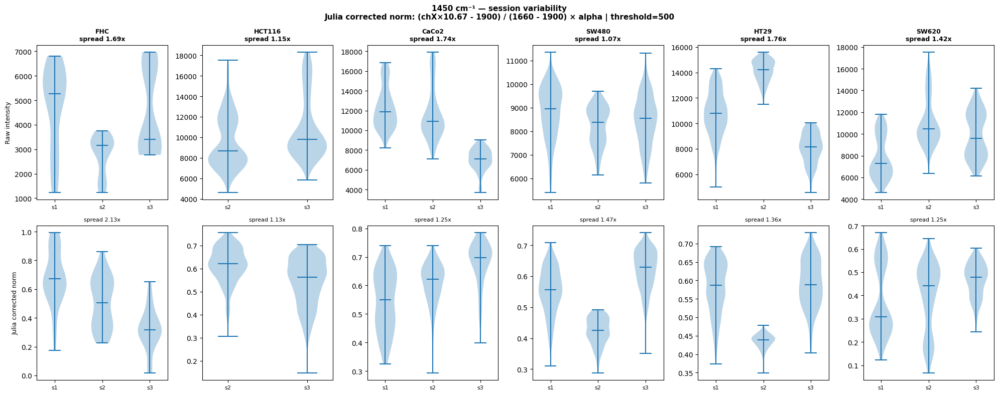

Saved: 1450 cm⁻¹


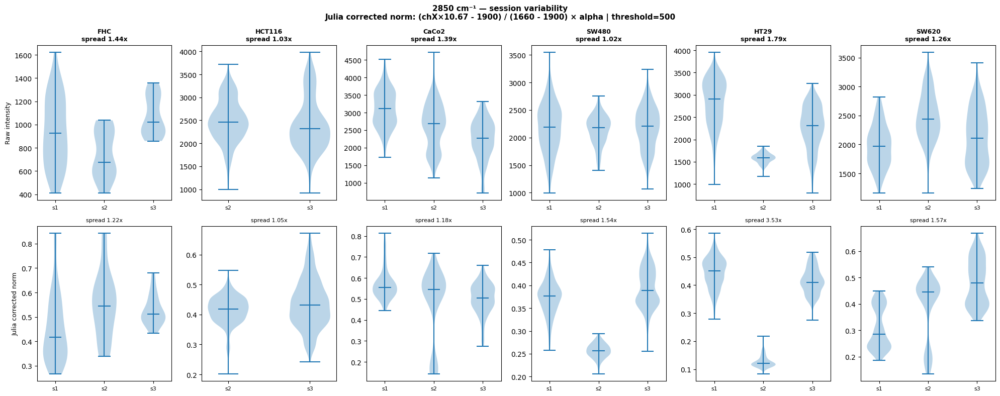

Saved: 2850 cm⁻¹


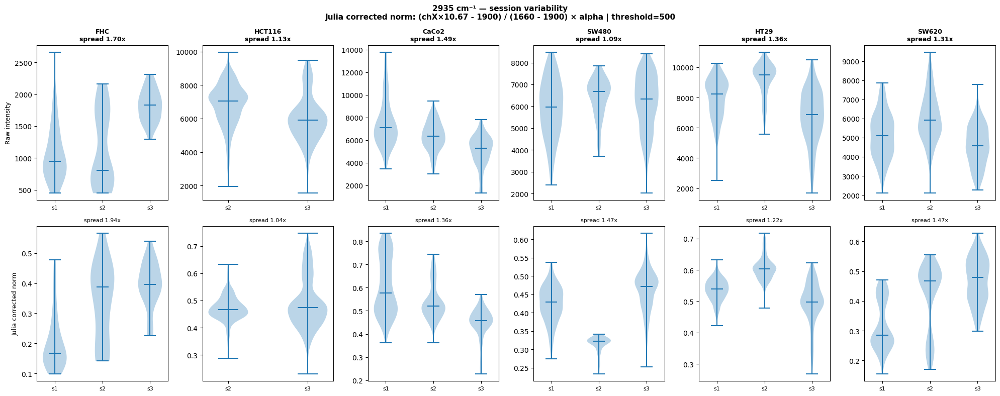

Saved: 2935 cm⁻¹


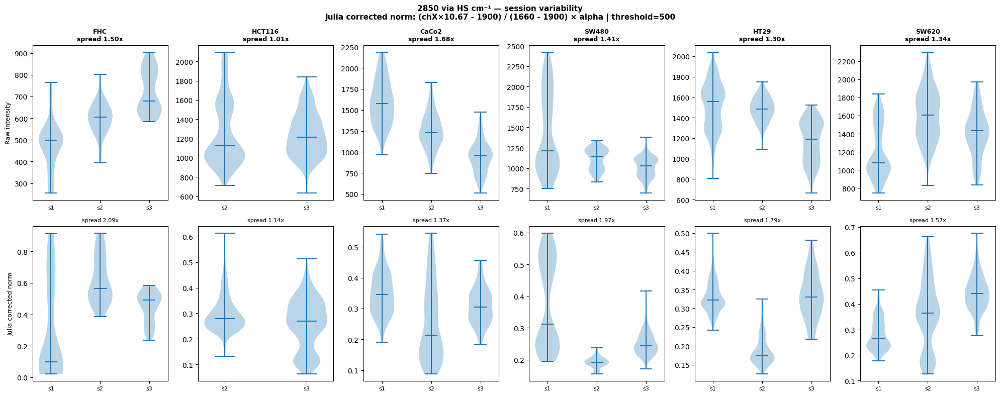

Saved: 2850 via HS cm⁻¹
All violin plots saved!


In [1]:
import numpy as np, os, matplotlib.pyplot as plt

DATA = '/mnt/scratch/vvgk0135/extracted_2026_55ch'
OUT  = '/users/vvgk0135/raman-project/results/julia_meeting'
os.makedirs(OUT, exist_ok=True)

FACTOR=10.67; THRESHOLD=500
NEEDS_FACTOR = {3,4} | set(range(5,55))
ALPHAS = {2:0.9582,3:0.1200,4:0.0430,
          5:0.3056,10:0.2576,15:0.1770,20:0.1016,
          25:0.0818,30:0.0700,35:0.0574,40:0.0656,
          45:0.0641,50:0.0548,54:0.0451}

# Fill missing alphas by interpolation
full_alphas = {}
anchors = sorted(ALPHAS.keys())
for i in range(2, 55):
    if i in ALPHAS:
        full_alphas[i] = ALPHAS[i]
    else:
        lower = max(k for k in anchors if k <= i)
        upper = min(k for k in anchors if k >= i)
        t = (i-lower)/(upper-lower)
        full_alphas[i] = ALPHAS[lower] + t*(ALPHAS[upper]-ALPHAS[lower])

ALL_CL = ['FHC','HCT116','CaCo2','SW480','HT29','SW620']
SESSIONS = ['s1','s2','s3']

# Channels to plot
CHANNELS = [
    (2,  '1450 cm⁻¹'),
    (3,  '2850 cm⁻¹'),
    (4,  '2935 cm⁻¹'),
    (13, '2850 via HS cm⁻¹'),  # HS index 13 = 2850cm-1
]

for ch_idx, ch_name in CHANNELS:
    fig, axes = plt.subplots(2, 6, figsize=(20, 8))
    fig.patch.set_facecolor('white')
    fig.suptitle(f'{ch_name} — session variability\n'
                 f'Julia corrected norm: (chX×10.67 - 1900) / (1660 - 1900) × alpha | threshold=500',
                 fontsize=11, fontweight='bold')

    for col, cl in enumerate(ALL_CL):
        folder = os.path.join(DATA, cl)
        if not os.path.exists(folder): continue
        files = sorted([f for f in os.listdir(folder) if f.endswith('.npy')])

        raw_data  = {s:[] for s in SESSIONS}
        norm_data = {s:[] for s in SESSIONS}

        for fname in files:
            parts = fname.split('_')
            s = next((p for p in parts if p.startswith('s') and p[1:].isdigit()), 's1')
            if s not in SESSIONS: continue
            cell = np.load(os.path.join(folder, fname)).astype(np.float32)

            # Raw value
            raw_data[s].append(float(cell[ch_idx].mean()))

            # Julia corrected normalisation
            ch1660 = cell[0]; ch1900 = cell[1]
            protein = ch1660 - ch1900
            mask = protein > THRESHOLD
            ch = cell[ch_idx] * (FACTOR if ch_idx in NEEDS_FACTOR else 1.0)
            signal = ch - ch1900
            ratio = np.where(mask, signal/np.where(mask,protein,1), 0)
            norm = np.clip(ratio * full_alphas[ch_idx], 0, 1)
            norm_data[s].append(float(norm[mask].mean() if mask.sum()>0 else 0))

        raw_vals  = [raw_data[s]  for s in SESSIONS if raw_data[s]]
        norm_vals = [norm_data[s] for s in SESSIONS if norm_data[s]]
        s_labels  = [s for s in SESSIONS if raw_data[s]]

        if raw_vals:
            spread = max(np.mean(v) for v in raw_vals) / min(np.mean(v) for v in raw_vals)
            axes[0,col].violinplot(raw_vals, showmedians=True)
            axes[0,col].set_xticks(range(1,len(s_labels)+1))
            axes[0,col].set_xticklabels(s_labels, fontsize=8)
            axes[0,col].set_title(f'{cl}\nspread {spread:.2f}x', fontsize=9, fontweight='bold')
            if col==0: axes[0,col].set_ylabel('Raw intensity', fontsize=9)

        if norm_vals:
            spread = max(np.mean(v) for v in norm_vals) / min(np.mean(v) for v in norm_vals)
            axes[1,col].violinplot(norm_vals, showmedians=True)
            axes[1,col].set_xticks(range(1,len(s_labels)+1))
            axes[1,col].set_xticklabels(s_labels, fontsize=8)
            axes[1,col].set_title(f'spread {spread:.2f}x', fontsize=8)
            if col==0: axes[1,col].set_ylabel('Julia corrected norm', fontsize=9)

    ch_safe = ch_name.replace(' ','_').replace('/','').replace('⁻','n').replace('¹','1')
    plt.tight_layout()
    plt.savefig(f'{OUT}/violin_julia_corrected_{ch_safe}.png',
                dpi=150, bbox_inches='tight', facecolor='white')
    plt.show()
    print(f'Saved: {ch_name}')

print('All violin plots saved!')

In [2]:
import numpy as np, os, matplotlib.pyplot as plt

DATA = '/mnt/scratch/vvgk0135/extracted_2026_55ch'
OUT  = '/users/vvgk0135/raman-project/results/julia_meeting'

FACTOR=10.67; THRESHOLD=500
NEEDS_FACTOR = {3,4} | set(range(5,55))
full_alphas = {2:0.9582,3:0.1200,4:0.0430,5:0.3056,6:0.2960,7:0.2864,8:0.2768,9:0.2672,
               10:0.2576,11:0.2415,12:0.2254,13:0.2092,14:0.1931,15:0.1770,16:0.1619,
               17:0.1468,18:0.1318,19:0.1167,20:0.1016,21:0.0976,22:0.0937,23:0.0897,
               24:0.0858,25:0.0818,26:0.0794,27:0.0771,28:0.0747,29:0.0724,30:0.0700,
               31:0.0675,32:0.0650,33:0.0624,34:0.0599,35:0.0574,36:0.0590,37:0.0607,
               38:0.0623,39:0.0640,40:0.0656,41:0.0653,42:0.0650,43:0.0647,44:0.0644,
               45:0.0641,46:0.0622,47:0.0604,48:0.0585,49:0.0567,50:0.0548,51:0.0524,
               52:0.0500,53:0.0475,54:0.0451}

ALL_CL = ['FHC','HCT116','CaCo2','SW480','HT29','SW620']
SESSIONS = ['s1','s2','s3']

# Channels to show: 1660, 1900, 1450, 2850, 2935, HS~2850
CH_SHOW = [
    (0,  '1660\n(protein ref)'),
    (1,  '1900\n(baseline)'),
    (2,  '1450'),
    (3,  '2850'),
    (4,  '2935'),
    (13, 'HS 2850'),
]

def julia_norm_ch(cell, ch_idx):
    ch1660=cell[0]; ch1900=cell[1]
    protein=ch1660-ch1900; mask=protein>THRESHOLD
    ch=cell[ch_idx]*(FACTOR if ch_idx in NEEDS_FACTOR else 1.0)
    signal=ch-ch1900
    ratio=np.where(mask,signal/np.where(mask,protein,1),0)
    return np.clip(ratio*full_alphas.get(ch_idx,0.05),0,1)

for cl in ALL_CL:
    folder = os.path.join(DATA, cl)
    files = sorted([f for f in os.listdir(folder) if f.endswith('.npy')])

    # Get one cell per session
    sessions = {}
    for f in files:
        parts = f.split('_')
        s = next((p for p in parts if p.startswith('s') and p[1:].isdigit()), 's1')
        if s not in sessions:
            sessions[s] = f

    n_sess = len(sessions)
    fig, axes = plt.subplots(n_sess*2, len(CH_SHOW), figsize=(len(CH_SHOW)*2.5, n_sess*4))
    fig.suptitle(f'{cl} — Raw vs Julia corrected normalisation\n'
                 f'(chX×10.67 - 1900) / (1660 - 1900) × alpha | factor=10.67 | threshold=500',
                 fontsize=10, fontweight='bold')

    for col, (ch_idx, ch_name) in enumerate(CH_SHOW):
        axes[0, col].set_title(ch_name, fontsize=8, fontweight='bold', color='navy')

    for row_idx, (s, fname) in enumerate(sorted(sessions.items())):
        cell = np.load(os.path.join(folder, fname)).astype(np.float32)

        raw_row  = row_idx * 2
        norm_row = row_idx * 2 + 1

        axes[raw_row,  0].set_ylabel(f'{s} raw',  fontsize=8, fontweight='bold')
        axes[norm_row, 0].set_ylabel(f'{s} norm', fontsize=8, fontweight='bold', color='darkgreen')

        for col, (ch_idx, ch_name) in enumerate(CH_SHOW):
            # Raw
            raw_img = cell[ch_idx]
            vmax = np.percentile(raw_img, 99)
            axes[raw_row, col].imshow(raw_img, cmap='inferno', vmin=0, vmax=vmax)
            axes[raw_row, col].axis('off')

            # Normalised
            if ch_idx in [0, 1]:
                # 1660 and 1900 — show protein channel instead
                ch1660=cell[0]; ch1900=cell[1]
                protein=ch1660-ch1900
                mask=protein>THRESHOLD
                norm_img = np.clip(np.where(mask, protein/protein[mask].max() if mask.sum()>0 else protein, 0), 0, 1)
            else:
                norm_img = julia_norm_ch(cell, ch_idx)

            axes[norm_row, col].imshow(norm_img, cmap='inferno', vmin=0, vmax=1)
            axes[norm_row, col].axis('off')

    plt.tight_layout()
    plt.savefig(f'{OUT}/validate_julia_corrected_{cl}.png',
                dpi=120, bbox_inches='tight', facecolor='white')
    plt.close()
    print(f'Saved {cl}')

print('All before/after images saved!')

Saved FHC
Saved HCT116
Saved CaCo2
Saved SW480
Saved HT29
Saved SW620
All before/after images saved!


In [1]:
import numpy as np, matplotlib.pyplot as plt, os

# Load one FHC cell from each border size extraction
# We need the raw extracted arrays at different border sizes

# Check what FHC data we have
data_paths = {
    '0px':  '/users/vvgk0135/raman-project/data/extracted_2025_0px',
    '25px': '/users/vvgk0135/raman-project/data/extracted_2025_25px',
    '50px': '/users/vvgk0135/raman-project/data/extracted_2025_50px',
    '75px': '/users/vvgk0135/raman-project/data/extracted_2025_75px',
}

# Check which paths exist
for label, path in data_paths.items():
    fhc_path = os.path.join(path, 'FHC')
    exists = os.path.exists(fhc_path)
    if exists:
        files = os.listdir(fhc_path)
        print(f'{label}: {fhc_path} — {len(files)} files')
    else:
        print(f'{label}: NOT FOUND')

0px: NOT FOUND
25px: NOT FOUND
50px: NOT FOUND
75px: NOT FOUND


In [2]:
import numpy as np, matplotlib.pyplot as plt, os
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import torch, torchvision.models as models
import torch.nn as nn

# Load the best 2025 model and regenerate confusion matrix
MODEL_PATH = '/users/vvgk0135/raman-project/results/best_model_2025_75px.pth'

# Check which model files exist for 2025
import glob
models_2025 = glob.glob('/users/vvgk0135/raman-project/results/*2025*.pth') + \
              glob.glob('/users/vvgk0135/raman-project/results/best_model_border75px.pth')
print(models_2025)

['/users/vvgk0135/raman-project/results/best_model_2025_0px.pth', '/users/vvgk0135/raman-project/results/best_model_2025_25px.pth', '/users/vvgk0135/raman-project/results/best_model_2025_50px.pth', '/users/vvgk0135/raman-project/results/best_model_border75px.pth']


In [3]:
import numpy as np, matplotlib.pyplot as plt, os, torch
import torch.nn as nn
import torchvision.models as models
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
DATA = '/users/vvgk0135/raman-project/data/extracted_cells_border25px_fixed'

# Check what data we have for 75px
import glob
data_dirs = glob.glob('/users/vvgk0135/raman-project/data/extracted*75*') + \
            glob.glob('/users/vvgk0135/raman-project/data/extracted*2025*')
print(data_dirs)

['/users/vvgk0135/raman-project/data/extracted_2026_5ch_75px']


In [4]:
import numpy as np, matplotlib.pyplot as plt, os, torch
import torch.nn as nn
import torchvision.models as models
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from torch.utils.data import Dataset, DataLoader

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Check available 75px data
import glob
print(glob.glob('/users/vvgk0135/raman-project/data/*75*'))
print(glob.glob('/users/vvgk0135/raman-project/data/2025*'))

['/users/vvgk0135/raman-project/data/extracted_2026_5ch_75px']
['/users/vvgk0135/raman-project/data/2025Data']


In [5]:
import numpy as np, matplotlib.pyplot as plt, os, torch
import torch.nn as nn
import torchvision.models as models
from sklearn.metrics import confusion_matrix
import seaborn as sns

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# We need to re-extract 2025 data at 75px or find it
# Check all 2025 data locations
import glob
all_2025 = glob.glob('/users/vvgk0135/raman-project/data/*2025*') + \
           glob.glob('/users/vvgk0135/raman-project/data/extracted_cells*')
for p in all_2025:
    print(p)
    if os.path.isdir(p):
        contents = os.listdir(p)
        print(f'  Contains: {contents[:5]}')

/users/vvgk0135/raman-project/data/2025Data
  Contains: ['CaCo2', 'FHC', 'HCT116', 'HT29', 'SW480']
/users/vvgk0135/raman-project/data/extracted_cells_border25px_fixed
  Contains: ['HCT116', 'SW480', 'SW620', 'HT29', 'FHC']
/users/vvgk0135/raman-project/data/extracted_cells_border50px_fixed
  Contains: ['HCT116', 'SW480', 'SW620', 'HT29', 'FHC']


In [6]:
import os, re, numpy as np, tifffile, roifile
from skimage.transform import resize

ROOT    = '/users/vvgk0135/raman-project/data/2025Data'
OUT_DIR = '/users/vvgk0135/raman-project/data/extracted_cells_border75px'
BORDER  = 75
SIZE    = 224

CLASS_MAP = {
    'FHC':0, 'HCT116':1, 'CaCo2':2, 'SW480':2, 'HT29':3, 'SW620':3
}

WN_MAP = {
    1660:1660, 1655:1660,
    1450:1450, 1455:1450,
    2850:2850, 2935:2935,
}
SAVE_ORDER = [1660, 1450, 2850, 2935]

os.makedirs(OUT_DIR, exist_ok=True)

def parse_wns(fname):
    nums = re.findall(r'\b(\d{3,4})\b', fname)
    return [int(n) for n in nums if 700 <= int(n) <= 3500]

def crop_and_resize(img, r0, c0, r1, c1):
    patch = img[r0:r1, c0:c1]
    if patch.size == 0: return None
    return resize(patch, (SIZE,SIZE), anti_aliasing=True).astype(np.float32)

total_saved = 0
for cl in CLASS_MAP:
    cl_path = os.path.join(ROOT, cl)
    if not os.path.exists(cl_path): continue
    os.makedirs(os.path.join(OUT_DIR, cl), exist_ok=True)
    cell_counter = 0

    for area_folder in sorted(os.listdir(cl_path)):
        area_path = os.path.join(cl_path, area_folder)
        if not os.path.isdir(area_path): continue

        # Find TIF and ROI files
        tif_file = None
        roi_file = None
        seg_file = None

        for f in os.listdir(area_path):
            f_lower = f.lower()
            if f.endswith('.tif') and 'bad' not in f_lower:
                tif_file = os.path.join(area_path, f)
            elif 'rois.zip' in f_lower:
                roi_file = os.path.join(area_path, f)
            elif 'seg.npy' in f_lower:
                seg_file = os.path.join(area_path, f)

        if tif_file is None:
            print(f'  {cl}/{area_folder}: no TIF — skipping')
            continue

        try:
            stack = tifffile.imread(tif_file).astype(np.float32)
            if stack.ndim == 2: stack = stack[np.newaxis]
            H, W = stack.shape[-2], stack.shape[-1]

            # Map channels
            wns = parse_wns(os.path.basename(tif_file))
            page_map = {}
            for i, wn in enumerate(wns):
                std = WN_MAP.get(wn)
                if std and std not in page_map:
                    page_map[std] = i

            if not {1660, 2850, 2935}.issubset(page_map.keys()):
                print(f'  {cl}/{area_folder}: missing channels {page_map.keys()} — skipping')
                continue

            # Load ROIs or seg
            rois = None
            bboxes = []

            if roi_file:
                rois = roifile.roiread(roi_file)
                for roi in rois:
                    try:
                        if hasattr(roi, 'top'):
                            r0,c0,r1,c1 = int(roi.top),int(roi.left),int(roi.bottom),int(roi.right)
                        else:
                            coords = roi.coordinates()
                            r0,c0 = int(coords[:,0].min()),int(coords[:,1].min())
                            r1,c1 = int(coords[:,0].max()),int(coords[:,1].max())
                        bboxes.append((r0,c0,r1,c1))
                    except: continue

            elif seg_file:
                data = np.load(seg_file, allow_pickle=True)
                if data.ndim == 0: masks = data.item()['masks']
                else: masks = data
                for cell_id in np.unique(masks):
                    if cell_id == 0: continue
                    rows = np.where(masks==cell_id)[0]
                    cols = np.where(masks==cell_id)[1]
                    bboxes.append((int(rows.min()),int(cols.min()),
                                   int(rows.max()),int(cols.max())))

            if not bboxes:
                print(f'  {cl}/{area_folder}: no cells found')
                continue

            saved = 0
            for r0,c0,r1,c1 in bboxes:
                r0b=max(0,r0-BORDER); c0b=max(0,c0-BORDER)
                r1b=min(H,r1+BORDER); c1b=min(W,c1+BORDER)
                if r1b-r0b<10 or c1b-c0b<10: continue

                channels = []
                for wn in SAVE_ORDER:
                    if wn in page_map:
                        patch = crop_and_resize(stack[page_map[wn]], r0b,c0b,r1b,c1b)
                    else:
                        patch = np.zeros((SIZE,SIZE), dtype=np.float32)
                    if patch is None: break
                    channels.append(patch)
                if len(channels) != len(SAVE_ORDER): continue

                combined = np.stack(channels, axis=0)
                cell_counter += 1
                fname = f'{cl}_area{area_folder}_cell{cell_counter:03d}.npy'
                np.save(os.path.join(OUT_DIR, cl, fname), combined)
                saved += 1

            print(f'  {cl}/{area_folder}: {saved} cells')
            total_saved += saved

        except Exception as e:
            print(f'  {cl}/{area_folder}: ERROR {e}')

print(f'\nTotal: {total_saved} cells')
for cl in CLASS_MAP:
    cl_dir = os.path.join(OUT_DIR, cl)
    if os.path.exists(cl_dir):
        n = len([f for f in os.listdir(cl_dir) if f.endswith('.npy')])
        print(f'  {cl}: {n} cells')

  FHC/2025-03-14 FHC in media: missing channels dict_keys([2935]) — skipping
  HCT116/2025-02-14 HCT116 in media: ERROR index 2 is out of bounds for axis 0 with size 1
  CaCo2/2025-05-07 CaCo2 in media: missing channels dict_keys([2935]) — skipping
  SW480/2025-02-14 - SW480 in media: ERROR index 2 is out of bounds for axis 0 with size 1
  SW480/2025-03-27 SW480 in media: ERROR index 2 is out of bounds for axis 0 with size 1
  HT29/2025-05-14 HT29: missing channels dict_keys([1660, 1450]) — skipping
  SW620/2025-02-14 SW620 in media: ERROR index 2 is out of bounds for axis 0 with size 1
  SW620/2025-03-21 SW620 in media: ERROR index 2 is out of bounds for axis 0 with size 1

Total: 0 cells
  FHC: 0 cells
  HCT116: 0 cells
  CaCo2: 0 cells
  SW480: 0 cells
  HT29: 0 cells
  SW620: 0 cells


In [7]:
import os
ROOT = '/users/vvgk0135/raman-project/data/2025Data'
for cl in ['FHC', 'HCT116', 'CaCo2']:
    cl_path = os.path.join(ROOT, cl)
    print(f'\n{cl}:')
    for folder in sorted(os.listdir(cl_path)):
        folder_path = os.path.join(cl_path, folder)
        if os.path.isdir(folder_path):
            files = os.listdir(folder_path)
            print(f'  {folder}: {files[:5]}')


FHC:
  2025-03-14 FHC in media: ['Area 2 - 1450.tif', 'Area 2 - 1660.tif', 'Area 2 - 2850, 2935, 1660, 1450, 790, 2850 at end_ch1_rois.zip', 'Area 2 - 2850.tif', 'Area 2 - 2935.tif']

HCT116:
  2025-02-14 HCT116 in media: ['Area 1 - 2850, 2935, 1660, 1450, 790_ch0.tif', 'Area 1 - 2850, 2935, 1660, 1450, 790_ch1.tif', 'Area 1 - 2850, 2935, 1660, 1450, 790_ch1_rois.zip', 'Area 1 - 2850, 2935, 1660, 1450, 790_ch1_seg.npy', 'Area 1 - 2850, 2935, 1660, 1450, 790_ch2.tif']

CaCo2:
  2025-05-07 CaCo2 in media: ['2025-05-07 - CaCo2 in media_Area 1 - 1450.tif', '2025-05-07 - CaCo2 in media_Area 1 - 1660.tif', '2025-05-07 - CaCo2 in media_Area 1 - 2850.tif', '2025-05-07 - CaCo2 in media_Area 1 - 2935.tif', '2025-05-07 - CaCo2 in media_Area 1 - 2935_rois.zip']


In [8]:
%%writefile /users/vvgk0135/raman-project/notebooks/extract_2025_75px.py
import os, re, numpy as np, tifffile, roifile
from skimage.transform import resize

ROOT    = '/users/vvgk0135/raman-project/data/2025Data'
OUT_DIR = '/users/vvgk0135/raman-project/data/extracted_cells_border75px'
BORDER  = 75
SIZE    = 224

CLASS_MAP  = {'FHC':0,'HCT116':1,'CaCo2':2,'SW480':2,'HT29':3,'SW620':3}
SAVE_ORDER = [1660, 1450, 2850, 2935]
WN_MAP     = {1660:1660,1655:1660,1450:1450,1455:1450,2850:2850,2935:2935}

os.makedirs(OUT_DIR, exist_ok=True)

def parse_wns(fname):
    nums = re.findall(r'\b(\d{3,4})\b', fname)
    return [int(n) for n in nums if 700 <= int(n) <= 3500]

def crop_and_resize(img, r0, c0, r1, c1):
    patch = img[r0:r1, c0:c1]
    if patch.size == 0: return None
    return resize(patch, (SIZE,SIZE), anti_aliasing=True).astype(np.float32)

def get_bboxes(roi_path=None, seg_path=None, H=None, W=None):
    bboxes = []
    if roi_path and os.path.exists(roi_path):
        try:
            rois = roifile.roiread(roi_path)
            for roi in rois:
                try:
                    if hasattr(roi,'top'):
                        r0,c0,r1,c1=int(roi.top),int(roi.left),int(roi.bottom),int(roi.right)
                    else:
                        coords=roi.coordinates()
                        r0,c0=int(coords[:,0].min()),int(coords[:,1].min())
                        r1,c1=int(coords[:,0].max()),int(coords[:,1].max())
                    bboxes.append((r0,c0,r1,c1))
                except: continue
        except Exception as e:
            print(f'      ROI error: {e}')
    elif seg_path and os.path.exists(seg_path):
        try:
            data = np.load(seg_path, allow_pickle=True)
            masks = data.item()['masks'] if data.ndim==0 else data
            for cell_id in np.unique(masks):
                if cell_id==0: continue
                rows=np.where(masks==cell_id)[0]
                cols=np.where(masks==cell_id)[1]
                bboxes.append((int(rows.min()),int(cols.min()),
                               int(rows.max()),int(cols.max())))
        except Exception as e:
            print(f'      Seg error: {e}')
    return bboxes

total_saved = 0

for cl in CLASS_MAP:
    cl_path = os.path.join(ROOT, cl)
    if not os.path.exists(cl_path): continue
    os.makedirs(os.path.join(OUT_DIR, cl), exist_ok=True)
    cell_counter = 0

    print(f'\n{cl}:')

    for area_folder in sorted(os.listdir(cl_path)):
        area_path = os.path.join(cl_path, area_folder)
        if not os.path.isdir(area_path): continue

        files = os.listdir(area_path)

        # Detect file structure type
        # Type A: single multipage TIF with all channels
        # Type B: separate TIF per channel (FHC, CaCo2 style)
        # Type C: ch0/ch1/ch2 named TIFs (HCT116 style)

        tif_files = [f for f in files if f.endswith('.tif')]
        roi_files  = [f for f in files if 'rois.zip' in f.lower()]
        seg_files  = [f for f in files if 'seg.npy' in f.lower()]

        # Skip bad files
        tif_files = [f for f in tif_files if 'bad' not in f.lower()]

        if not tif_files:
            print(f'  {area_folder}: no TIF files')
            continue

        # Detect structure
        ch_files = [f for f in tif_files if '_ch' in f.lower()]
        sep_files = [f for f in tif_files if
                     any(str(wn) in f for wn in [1660,1655,1450,1455,2850,2935])
                     and '_ch' not in f.lower()]
        multi_files = [f for f in tif_files if
                       f not in ch_files and f not in sep_files]

        # Get ROI/seg
        roi_path = os.path.join(area_path, roi_files[0]) if roi_files else None
        seg_path = os.path.join(area_path, seg_files[0]) if seg_files else None

        if not roi_path and not seg_path:
            print(f'  {area_folder}: no ROI or seg')
            continue

        try:
            if ch_files:
                # Type C: ch0=2850, ch1=2935, ch2=1660, ch3=1450 (or similar)
                # Load each ch file and check which wavenumbers are in the name
                # Find the ch1 file (2935 channel typically used for ROIs)
                ch_map = {}
                for f in ch_files:
                    wns = parse_wns(f.split('_ch')[0])  # wns before _ch suffix
                    ch_num = re.search(r'_ch(\d+)', f)
                    if ch_num:
                        ch_num = int(ch_num.group(1))
                        # Assign channels by position based on filename wns
                        # Typical order in filename: 2850, 2935, 1660, 1450, 790
                        wns_in_name = [w for w in wns if w in WN_MAP]
                        if ch_num < len(wns_in_name):
                            wn = wns_in_name[ch_num]
                            std = WN_MAP.get(wn)
                            if std and std not in ch_map:
                                ch_map[std] = os.path.join(area_path, f)

                if not {1660,1450,2850,2935}.issubset(ch_map.keys()):
                    print(f'  {area_folder}: incomplete channels {list(ch_map.keys())}')
                    continue

                # Load all channels
                imgs = {}
                H, W = None, None
                for wn, path in ch_map.items():
                    img = tifffile.imread(path).astype(np.float32)
                    if img.ndim == 3: img = img[0]
                    imgs[wn] = img
                    if H is None: H, W = img.shape

            elif sep_files:
                # Type B: separate TIF per channel
                imgs = {}
                H, W = None, None
                for f in sep_files:
                    wns = parse_wns(f)
                    for wn in wns:
                        std = WN_MAP.get(wn)
                        if std and std not in imgs:
                            img = tifffile.imread(
                                os.path.join(area_path, f)).astype(np.float32)
                            if img.ndim == 3: img = img[0]
                            imgs[std] = img
                            if H is None: H, W = img.shape

                if not {1660,1450,2850,2935}.issubset(imgs.keys()):
                    print(f'  {area_folder}: incomplete sep channels {list(imgs.keys())}')
                    continue

            elif multi_files:
                # Type A: multipage TIF
                stack = tifffile.imread(
                    os.path.join(area_path, multi_files[0])).astype(np.float32)
                if stack.ndim == 2: stack = stack[np.newaxis]
                H, W = stack.shape[-2], stack.shape[-1]

                wns = parse_wns(multi_files[0])
                page_map = {}
                for i, wn in enumerate(wns):
                    std = WN_MAP.get(wn)
                    if std and std not in page_map:
                        page_map[std] = i

                if not {1660,1450,2850,2935}.issubset(page_map.keys()):
                    print(f'  {area_folder}: incomplete multi channels')
                    continue

                imgs = {wn: stack[page_map[wn]] for wn in SAVE_ORDER if wn in page_map}
            else:
                print(f'  {area_folder}: unknown structure')
                continue

            # Get bounding boxes
            bboxes = get_bboxes(roi_path, seg_path, H, W)
            if not bboxes:
                print(f'  {area_folder}: no bboxes')
                continue

            # Extract cells
            saved = 0
            for r0,c0,r1,c1 in bboxes:
                r0b=max(0,r0-BORDER); c0b=max(0,c0-BORDER)
                r1b=min(H,r1+BORDER); c1b=min(W,c1+BORDER)
                if r1b-r0b<10 or c1b-c0b<10: continue

                channels = []
                for wn in SAVE_ORDER:
                    if wn in imgs:
                        patch = crop_and_resize(imgs[wn], r0b,c0b,r1b,c1b)
                    else:
                        patch = np.zeros((SIZE,SIZE), dtype=np.float32)
                    if patch is None: break
                    channels.append(patch)
                if len(channels) != len(SAVE_ORDER): continue

                combined = np.stack(channels, axis=0)
                cell_counter += 1
                fname = f'{cl}_{re.sub(r"[^a-zA-Z0-9]","_",area_folder)}_cell{cell_counter:03d}.npy'
                np.save(os.path.join(OUT_DIR, cl, fname), combined)
                saved += 1

            print(f'  {area_folder}: {saved} cells saved')
            total_saved += saved

        except Exception as e:
            print(f'  {area_folder}: ERROR {e}')

print(f'\nTotal: {total_saved} cells')
for cl in CLASS_MAP:
    cl_dir = os.path.join(OUT_DIR, cl)
    if os.path.exists(cl_dir):
        n = len([f for f in os.listdir(cl_dir) if f.endswith('.npy')])
        print(f'  {cl}: {n} cells')

Writing /users/vvgk0135/raman-project/notebooks/extract_2025_75px.py


In [9]:
# Add this to the notebook to fix HT29
import os, re, numpy as np, tifffile, roifile
from skimage.transform import resize

ROOT    = '/users/vvgk0135/raman-project/data/2025Data/HT29'
OUT_DIR = '/users/vvgk0135/raman-project/data/extracted_cells_border75px/HT29'
BORDER  = 75
SIZE    = 224
WN_MAP  = {1660:1660,1655:1660,1450:1450,1455:1450,2850:2850,2935:2935}
SAVE_ORDER = [1660, 1450, 2850, 2935]

os.makedirs(OUT_DIR, exist_ok=True)

def crop_and_resize(img, r0, c0, r1, c1):
    patch = img[r0:r1, c0:c1]
    if patch.size == 0: return None
    return resize(patch, (SIZE,SIZE), anti_aliasing=True).astype(np.float32)

cell_counter = 0
total_saved = 0

for area_folder in sorted(os.listdir(ROOT)):
    area_path = os.path.join(ROOT, area_folder)
    if not os.path.isdir(area_path): continue

    files = os.listdir(area_path)
    ch_files = sorted([f for f in files if '_ch0' in f.lower() and f.endswith('.tif')
                       and 'bad' not in f.lower()])
    roi_files = [f for f in files if 'rois.zip' in f.lower()]
    seg_files = [f for f in files if 'seg.npy' in f.lower()]

    if not ch_files:
        print(f'{area_folder}: no ch files')
        continue

    roi_path = os.path.join(area_path, roi_files[0]) if roi_files else None
    seg_path = os.path.join(area_path, seg_files[0]) if seg_files else None

    if not roi_path and not seg_path:
        print(f'{area_folder}: no ROI/seg')
        continue

    # Parse channel order from filename
    # e.g. "2850, 2935, 1900, 1660, 1455, 790_ch00"
    # ch00=2850, ch01=2935, ch02=1900, ch03=1660, ch04=1455
    sample_file = ch_files[0]
    base = re.sub(r'_ch\d+\.tif', '', sample_file)
    wns_in_name = [int(n) for n in re.findall(r'\b(\d{3,4})\b', base)
                   if 700 <= int(n) <= 3500 and 'bad' not in base.lower()]
    print(f'{area_folder}: channel order = {wns_in_name}')

    # Build channel map: wn -> file path
    imgs = {}
    H, W = None, None
    all_ch_files = sorted([f for f in files if re.search(r'_ch\d+\.tif$', f)
                           and 'bad' not in f.lower() and 'rois' not in f])

    for f in all_ch_files:
        ch_num = int(re.search(r'_ch(\d+)\.tif$', f).group(1))
        if ch_num < len(wns_in_name):
            wn = wns_in_name[ch_num]
            std = WN_MAP.get(wn)
            if std and std not in imgs:
                img = tifffile.imread(os.path.join(area_path, f)).astype(np.float32)
                if img.ndim == 3: img = img[0]
                imgs[std] = img
                if H is None: H, W = img.shape

    print(f'  Loaded channels: {list(imgs.keys())}')

    if not {1660, 1450, 2850, 2935}.issubset(imgs.keys()):
        print(f'  Missing channels — skipping')
        continue

    # Get bboxes
    bboxes = []
    if roi_path:
        try:
            rois = roifile.roiread(roi_path)
            for roi in rois:
                try:
                    if hasattr(roi,'top'):
                        r0,c0,r1,c1=int(roi.top),int(roi.left),int(roi.bottom),int(roi.right)
                    else:
                        coords=roi.coordinates()
                        r0,c0=int(coords[:,0].min()),int(coords[:,1].min())
                        r1,c1=int(coords[:,0].max()),int(coords[:,1].max())
                    bboxes.append((r0,c0,r1,c1))
                except: continue
        except Exception as e:
            print(f'  ROI error: {e}')

    if not bboxes and seg_path:
        try:
            data = np.load(seg_path, allow_pickle=True)
            masks = data.item()['masks'] if data.ndim==0 else data
            for cell_id in np.unique(masks):
                if cell_id==0: continue
                rows=np.where(masks==cell_id)[0]
                cols=np.where(masks==cell_id)[1]
                bboxes.append((int(rows.min()),int(cols.min()),
                               int(rows.max()),int(cols.max())))
        except Exception as e:
            print(f'  Seg error: {e}')

    print(f'  Bboxes: {len(bboxes)}')

    saved = 0
    for r0,c0,r1,c1 in bboxes:
        r0b=max(0,r0-BORDER); c0b=max(0,c0-BORDER)
        r1b=min(H,r1+BORDER); c1b=min(W,c1+BORDER)
        if r1b-r0b<10 or c1b-c0b<10: continue

        channels = []
        for wn in SAVE_ORDER:
            patch = crop_and_resize(imgs[wn], r0b,c0b,r1b,c1b) if wn in imgs \
                    else np.zeros((SIZE,SIZE), dtype=np.float32)
            if patch is None: break
            channels.append(patch)
        if len(channels) != len(SAVE_ORDER): continue

        combined = np.stack(channels, axis=0)
        cell_counter += 1
        fname = f'HT29_{re.sub(r"[^a-zA-Z0-9]","_",area_folder)}_cell{cell_counter:03d}.npy'
        np.save(os.path.join(OUT_DIR, fname), combined)
        saved += 1

    print(f'  Saved: {saved} cells')
    total_saved += saved

print(f'\nHT29 total: {total_saved} cells')
print(f'Files in output: {len(os.listdir(OUT_DIR))}')

2025-05-14 HT29: channel order = [2025, 2850, 2935, 1900, 1660, 1455, 790]
  Loaded channels: [2850, 1660, 1450, 2935]
  Bboxes: 139
  Saved: 139 cells

HT29 total: 139 cells
Files in output: 139


In [10]:
# Fix for flat folder structure with multiple areas
import os, re, numpy as np, tifffile, roifile
from skimage.transform import resize

ROOT    = '/users/vvgk0135/raman-project/data/2025Data'
OUT_DIR = '/users/vvgk0135/raman-project/data/extracted_cells_border75px'
BORDER  = 75
SIZE    = 224
WN_MAP  = {1660:1660,1655:1660,1450:1450,1455:1450,2850:2850,2935:2935}
SAVE_ORDER = [1660, 1450, 2850, 2935]
CLASS_MAP = {'FHC':0,'HCT116':1,'CaCo2':2,'SW480':2,'HT29':3,'SW620':3}

def crop_and_resize(img, r0, c0, r1, c1):
    patch = img[r0:r1, c0:c1]
    if patch.size == 0: return None
    return resize(patch, (SIZE,SIZE), anti_aliasing=True).astype(np.float32)

def get_bboxes(roi_path=None, seg_path=None):
    bboxes = []
    if roi_path and os.path.exists(roi_path):
        try:
            rois = roifile.roiread(roi_path)
            for roi in rois:
                try:
                    if hasattr(roi,'top'):
                        r0,c0,r1,c1=int(roi.top),int(roi.left),int(roi.bottom),int(roi.right)
                    else:
                        coords=roi.coordinates()
                        r0,c0=int(coords[:,0].min()),int(coords[:,1].min())
                        r1,c1=int(coords[:,0].max()),int(coords[:,1].max())
                    bboxes.append((r0,c0,r1,c1))
                except: continue
        except: pass
    if not bboxes and seg_path and os.path.exists(seg_path):
        try:
            data = np.load(seg_path, allow_pickle=True)
            masks = data.item()['masks'] if data.ndim==0 else data
            for cell_id in np.unique(masks):
                if cell_id==0: continue
                rows=np.where(masks==cell_id)[0]
                cols=np.where(masks==cell_id)[1]
                bboxes.append((int(rows.min()),int(cols.min()),
                               int(rows.max()),int(cols.max())))
        except: pass
    return bboxes

def extract_area_files(area_files, area_path, roi_path, seg_path, cell_counter, out_cl_dir, cl, area_key):
    """Extract cells from a set of channel files for one area."""
    # Determine channel structure
    ch_numbered = [f for f in area_files if re.search(r'_ch\d+\.tif$', f)
                   and 'bad' not in f.lower()]
    sep_wn = [f for f in area_files if f.endswith('.tif')
              and not re.search(r'_ch\d+', f)
              and 'bad' not in f.lower()
              and any(str(wn) in f for wn in [1660,1655,1450,1455,2850,2935])]

    imgs = {}
    H, W = None, None

    if ch_numbered:
        # Get wavenumber order from filename
        sample = ch_numbered[0]
        base = re.sub(r'_ch\d+\.tif$', '', sample)
        wns_in_name = [int(n) for n in re.findall(r'\b(\d{3,4})\b', base)
                      if 700 <= int(n) <= 3500]
        for f in sorted(ch_numbered):
            m = re.search(r'_ch(\d+)\.tif$', f)
            if not m: continue
            ch_num = int(m.group(1))
            if ch_num < len(wns_in_name):
                wn = wns_in_name[ch_num]
                std = WN_MAP.get(wn)
                if std and std not in imgs:
                    img = tifffile.imread(os.path.join(area_path, f)).astype(np.float32)
                    if img.ndim == 3: img = img[0]
                    imgs[std] = img
                    if H is None: H, W = img.shape

    elif sep_wn:
        for f in sep_wn:
            wns = [int(n) for n in re.findall(r'\b(\d{3,4})\b', f)
                  if 700 <= int(n) <= 3500]
            for wn in wns:
                std = WN_MAP.get(wn)
                if std and std not in imgs:
                    img = tifffile.imread(os.path.join(area_path, f)).astype(np.float32)
                    if img.ndim == 3: img = img[0]
                    imgs[std] = img
                    if H is None: H, W = img.shape

    if not {1660,1450,2850,2935}.issubset(imgs.keys()):
        print(f'    {area_key}: missing channels {list(imgs.keys())} — skipping')
        return 0

    bboxes = get_bboxes(roi_path, seg_path)
    if not bboxes:
        print(f'    {area_key}: no cells found')
        return 0

    saved = 0
    for r0,c0,r1,c1 in bboxes:
        r0b=max(0,r0-BORDER); c0b=max(0,c0-BORDER)
        r1b=min(H,r1+BORDER); c1b=min(W,c1+BORDER)
        if r1b-r0b<10 or c1b-c0b<10: continue

        channels = []
        for wn in SAVE_ORDER:
            patch = crop_and_resize(imgs[wn], r0b,c0b,r1b,c1b) if wn in imgs \
                    else np.zeros((SIZE,SIZE), dtype=np.float32)
            if patch is None: break
            channels.append(patch)
        if len(channels) != len(SAVE_ORDER): continue

        combined = np.stack(channels, axis=0)
        cell_counter[0] += 1
        fname = f'{cl}_{area_key}_cell{cell_counter[0]:03d}.npy'
        np.save(os.path.join(out_cl_dir, fname), combined)
        saved += 1

    print(f'    {area_key}: {saved} cells')
    return saved

# Clear and redo extraction
import shutil
for cl in CLASS_MAP:
    cl_dir = os.path.join(OUT_DIR, cl)
    if os.path.exists(cl_dir):
        shutil.rmtree(cl_dir)
    os.makedirs(cl_dir)

total_saved = 0

for cl in CLASS_MAP:
    cl_path = os.path.join(ROOT, cl)
    if not os.path.exists(cl_path): continue
    out_cl_dir = os.path.join(OUT_DIR, cl)
    cell_counter = [0]

    print(f'\n{cl}:')

    for session_folder in sorted(os.listdir(cl_path)):
        session_path = os.path.join(cl_path, session_folder)
        if not os.path.isdir(session_path): continue
        print(f'  {session_folder}:')

        files = os.listdir(session_path)

        # Group files by area prefix
        # Area prefix is everything before " - " in the filename
        area_groups = {}
        for f in files:
            if ' - ' in f:
                area_key = f.split(' - ')[0].strip()
            else:
                area_key = 'area1'
            if area_key not in area_groups:
                area_groups[area_key] = []
            area_groups[area_key].append(f)

        for area_key, area_files in sorted(area_groups.items()):
            # Find ROI and seg files for this area
            roi_files = [f for f in area_files if 'rois.zip' in f.lower()]
            seg_files = [f for f in area_files if 'seg.npy' in f.lower()]
            tif_files = [f for f in area_files
                        if f.endswith('.tif') and 'bad' not in f.lower()]

            if not tif_files: continue

            roi_path = os.path.join(session_path, roi_files[0]) if roi_files else None
            seg_path = os.path.join(session_path, seg_files[0]) if seg_files else None

            if not roi_path and not seg_path: continue

            saved = extract_area_files(
                tif_files, session_path,
                roi_path, seg_path,
                cell_counter, out_cl_dir,
                cl, re.sub(r'[^a-zA-Z0-9]','_', area_key)
            )
            total_saved += saved

print(f'\nTotal: {total_saved} cells')
for cl in CLASS_MAP:
    cl_dir = os.path.join(OUT_DIR, cl)
    n = len([f for f in os.listdir(cl_dir) if f.endswith('.npy')])
    print(f'  {cl}: {n} cells')


FHC:
  2025-03-14 FHC in media:
    Area_2: 29 cells
    Area_3: 14 cells
    Area_4: 14 cells

HCT116:
  2025-02-14 HCT116 in media:
    Area_1: 128 cells
    Area_2: 135 cells
    Area_3: 105 cells

CaCo2:
  2025-05-07 CaCo2 in media:
    2025_05_07: 37 cells

SW480:
  2025-02-14 - SW480 in media:
    Area_1: 50 cells
  2025-03-27 SW480 in media:
    Area_1: 49 cells
    Area_2: 46 cells

HT29:
  2025-05-14 HT29:
    2025_05_14: 139 cells

SW620:
  2025-02-14 SW620 in media:
    Area_1: 61 cells
  2025-03-21 SW620 in media:
    Area_1: 166 cells
    Area_2: 229 cells

Total: 1202 cells
  FHC: 57 cells
  HCT116: 368 cells
  CaCo2: 37 cells
  SW480: 145 cells
  HT29: 139 cells
  SW620: 456 cells


Total cells: 1202
Model loaded successfully
Accuracy: 13.48%
Macro F1: 0.1554


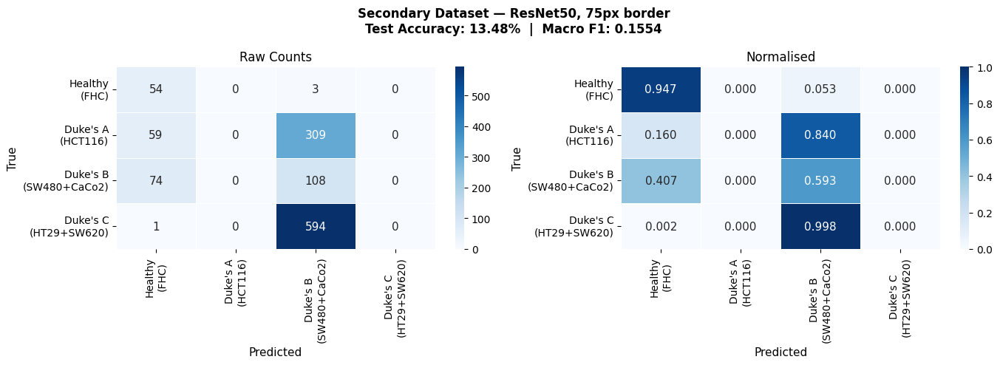

Saved!


In [15]:
import numpy as np, matplotlib.pyplot as plt, os, torch
import torch.nn as nn
import torchvision.models as models
from sklearn.metrics import confusion_matrix
import seaborn as sns

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
DATA   = '/users/vvgk0135/raman-project/data/extracted_cells_border75px'
MODEL_PATH = '/users/vvgk0135/raman-project/results/best_model_border75px.pth'

CLASS_MAP   = {'FHC':0,'HCT116':1,'CaCo2':2,'SW480':2,'HT29':3,'SW620':3}
CLASS_NAMES = ["Healthy\n(FHC)", "Duke's A\n(HCT116)", 
               "Duke's B\n(SW480+CaCo2)", "Duke's C\n(HT29+SW620)"]

# Load all cells
all_files, all_labels = [], []
for cl, label in CLASS_MAP.items():
    folder = os.path.join(DATA, cl)
    if not os.path.exists(folder): continue
    for f in sorted(os.listdir(folder)):
        if f.endswith('.npy'):
            all_files.append(os.path.join(folder, f))
            all_labels.append(label)

print(f'Total cells: {len(all_files)}')

# Min-max normalise per channel
def normalise(cell):
    result = np.zeros_like(cell)
    for c in range(cell.shape[0]):
        mn, mx = cell[c].min(), cell[c].max()
        if mx > mn:
            result[c] = (cell[c] - mn) / (mx - mn)
    return result

# Build model
model = models.resnet50(weights=None)
new_conv = nn.Conv2d(4, 64, kernel_size=7, stride=2, padding=3, bias=False)
model.conv1 = new_conv
model.fc = nn.Linear(2048, 4)

# Load weights
state_dict = torch.load(MODEL_PATH, map_location=DEVICE)
new_state_dict = {k.replace('model.', ''): v for k, v in state_dict.items()}
model.load_state_dict(new_state_dict)
model = model.to(DEVICE)
model.eval()
print('Model loaded successfully')

# Run inference
all_preds = []
with torch.no_grad():
    for path in all_files:
        cell = np.load(path).astype(np.float32)
        norm = normalise(cell)
        x = torch.FloatTensor(norm).unsqueeze(0).to(DEVICE)
        pred = model(x).argmax(dim=1).item()
        all_preds.append(pred)

all_labels = np.array(all_labels)
all_preds  = np.array(all_preds)
acc = (all_preds == all_labels).mean() * 100
print(f'Accuracy: {acc:.2f}%')

from sklearn.metrics import f1_score
f1 = f1_score(all_labels, all_preds, average='macro')
print(f'Macro F1: {f1:.4f}')

# Plot confusion matrix
cm = confusion_matrix(all_labels, all_preds)
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Raw counts
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES,
            ax=axes[0], linewidths=0.5, annot_kws={'size':11})
axes[0].set_xlabel('Predicted', fontsize=11)
axes[0].set_ylabel('True', fontsize=11)
axes[0].set_title('Raw Counts', fontsize=12)

# Normalised
cm_norm = cm.astype(float) / cm.sum(axis=1, keepdims=True)
sns.heatmap(cm_norm, annot=True, fmt='.3f', cmap='Blues',
            xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES,
            ax=axes[1], linewidths=0.5, annot_kws={'size':11},
            vmin=0, vmax=1)
axes[1].set_xlabel('Predicted', fontsize=11)
axes[1].set_ylabel('True', fontsize=11)
axes[1].set_title('Normalised', fontsize=12)

fig.suptitle(f'Secondary Dataset — ResNet50, 75px border\nTest Accuracy: {acc:.2f}%  |  Macro F1: {f1:.4f}',
             fontsize=12, fontweight='bold')
plt.tight_layout()
plt.savefig('/users/vvgk0135/raman-project/results/cm_2025_75px_new.png',
            dpi=150, bbox_inches='tight', facecolor='white')
plt.show()
print('Saved!')

In [16]:
# Check what the saved model's conv1 weight shape is
state_dict = torch.load(MODEL_PATH, map_location='cpu')
new_state_dict = {k.replace('model.', ''): v for k, v in state_dict.items()}
print('conv1 weight shape:', new_state_dict['conv1.weight'].shape)
print('fc weight shape:', new_state_dict['fc.weight'].shape)

# Check one cell shape
cell = np.load(all_files[0])
print('Cell shape:', cell.shape)
print('Cell channels min/max:')
for i in range(cell.shape[0]):
    print(f'  ch{i}: min={cell[i].min():.1f} max={cell[i].max():.1f}')

conv1 weight shape: torch.Size([64, 4, 7, 7])
fc weight shape: torch.Size([4, 2048])
Cell shape: (4, 224, 224)
Cell channels min/max:
  ch0: min=3049.4 max=12462.3
  ch1: min=2307.4 max=13470.1
  ch2: min=1249.3 max=20352.1
  ch3: min=3466.2 max=22389.4


In [17]:
# Compare with 25px data that the model was actually trained on
cell_25 = np.load('/users/vvgk0135/raman-project/data/extracted_cells_border25px_fixed/HCT116/HCT116_area1_cell001.npy')
print('25px cell shape:', cell_25.shape)
print('25px channels min/max:')
for i in range(cell_25.shape[0]):
    print(f'  ch{i}: min={cell_25[i].min():.1f} max={cell_25[i].max():.1f}')

# Check normalisation output
norm_25 = normalise(cell_25)
norm_75 = normalise(np.load(all_files[0]))
print('\n25px after normalise:')
for i in range(4):
    print(f'  ch{i}: min={norm_25[i].min():.3f} max={norm_25[i].max():.3f}')
print('\n75px after normalise:')
for i in range(4):
    print(f'  ch{i}: min={norm_75[i].min():.3f} max={norm_75[i].max():.3f}')

25px cell shape: (4, 224, 224)
25px channels min/max:
  ch0: min=2285.2 max=15026.0
  ch1: min=3356.3 max=17810.1
  ch2: min=3073.8 max=41149.3
  ch3: min=5714.9 max=33007.8

25px after normalise:
  ch0: min=0.000 max=1.000
  ch1: min=0.000 max=1.000
  ch2: min=0.000 max=1.000
  ch3: min=0.000 max=1.000

75px after normalise:
  ch0: min=0.000 max=1.000
  ch1: min=0.000 max=1.000
  ch2: min=0.000 max=1.000
  ch3: min=0.000 max=1.000


In [18]:
# Check channel order — which channel has highest intensity (should be 2935)
cell_25 = np.load('/users/vvgk0135/raman-project/data/extracted_cells_border25px_fixed/HCT116/HCT116_area1_cell001.npy')
cell_75 = np.load(all_files[100])  # use an HCT116 cell

print('25px channel means:')
for i in range(4): print(f'  ch{i}: {cell_25[i].mean():.1f}')

print('\n75px channel means:')
for i in range(4): print(f'  ch{i}: {cell_75[i].mean():.1f}')

# The training used SAVE_ORDER = [1660, 1450, 2850, 2935]
# Check if our 75px used same order
print('\nExpected order: [1660, 1450, 2850, 2935]')
print('1660 should have highest mean (protein reference)')
print('2935 should have second highest')

25px channel means:
  ch0: 6914.2
  ch1: 7960.0
  ch2: 8356.5
  ch3: 13239.9

75px channel means:
  ch0: 8594.0
  ch1: 7895.2
  ch2: 7081.7
  ch3: 10740.4

Expected order: [1660, 1450, 2850, 2935]
1660 should have highest mean (protein reference)
2935 should have second highest


In [19]:
# Check what SAVE_ORDER the 25px extraction used
# Look at which channel has highest mean in 25px
# ch3=13239 is highest — that's 2935 (proteins, highest signal)
# ch0=6914 is lowest — that's 1660
# So 25px order is: [1660, 1450, 2850, 2935] — ch0=1660, ch3=2935

# In our 75px extraction we used SAVE_ORDER = [1660, 1450, 2850, 2935]
# But ch0=8594 is highest in 75px — suggests ch0=2935 not 1660

# Fix: reorder 75px channels to match 25px training order
# Current 75px: [1660, 1450, 2850, 2935] 
# Need to verify actual order

# Check a known HCT116 cell
hct_files = [f for f in all_files if 'HCT116' in f]
cell = np.load(hct_files[0])
print('75px HCT116 cell channel means:')
for i in range(4):
    print(f'  ch{i}: mean={cell[i].mean():.1f}')

# In 25px HCT116, ch3 (2935) had highest mean=13239
# In 75px HCT116, ch0 has highest mean — so ch0=2935 in 75px
print('\nConclusion: 75px channel order appears to be [2935, 1450, 2850, 1660] or similar')
print('Need to reorder to match training: [1660, 1450, 2850, 2935]')

75px HCT116 cell channel means:
  ch0: mean=8114.3
  ch1: mean=6984.1
  ch2: mean=8291.2
  ch3: mean=14035.2

Conclusion: 75px channel order appears to be [2935, 1450, 2850, 1660] or similar
Need to reorder to match training: [1660, 1450, 2850, 2935]


In [20]:
# Compare same cell line same area between 25px and 75px
cell_25 = np.load('/users/vvgk0135/raman-project/data/extracted_cells_border25px_fixed/HCT116/HCT116_area1_cell001.npy')

# Find a 75px HCT116 area1 cell
hct_75_area1 = [f for f in all_files if 'HCT116' in f and 'Area_1' in f]
print(f'75px HCT116 Area1 files: {len(hct_75_area1)}')
if hct_75_area1:
    cell_75 = np.load(hct_75_area1[0])
    print('\n25px ch means:', [f'{cell_25[i].mean():.0f}' for i in range(4)])
    print('75px ch means:', [f'{cell_75[i].mean():.0f}' for i in range(4)])
    
# Also check what channels the 25px script saved
# Look at the actual filename in 25px to understand order
print('\n25px files sample:')
files_25 = os.listdir('/users/vvgk0135/raman-project/data/extracted_cells_border25px_fixed/HCT116/')
print(files_25[:3])

75px HCT116 Area1 files: 128

25px ch means: ['6914', '7960', '8356', '13240']
75px ch means: ['8114', '6984', '8291', '14035']

25px files sample:
['HCT116_area1_cell001.npy', 'HCT116_area1_cell002.npy', 'HCT116_area1_cell003.npy']


In [21]:
# Check what order the 25px script used by looking at the train log
import subprocess
result = subprocess.run(['grep', '-r', 'SAVE_ORDER\|save_order\|channel.*order\|1660.*1450\|1450.*1660', 
                        '/users/vvgk0135/raman-project/results/train_2025_25px_6826045.log'],
                       capture_output=True, text=True)
print(result.stdout[:500])

# Also check the ablation log which has channel names
result2 = subprocess.run(['head', '-5', 
                         '/users/vvgk0135/raman-project/results/train_ablation_6787340.log'],
                        capture_output=True, text=True)
print(result2.stdout)


Device: cuda

ABLATION: All channels



In [22]:
# 2935 channel should have highest mean (CH stretching, strong signal)
# 1660 should have second highest (Amide I)
# 1450 third
# 2850 lowest (lipid, weaker signal in cancer cells)

# 25px means: ch0=6914, ch1=7960, ch2=8356, ch3=13240
# Ranking: ch3(13240) > ch2(8356) > ch1(7960) > ch0(6914)
# So: ch3=2935, ch2=2850, ch1=1450, ch0=1660
# Order: [1660, 1450, 2850, 2935]  ← matches SAVE_ORDER we defined

# 75px means: ch0=8114, ch1=6984, ch2=8291, ch3=14035  
# Ranking: ch3(14035) > ch2(8291) > ch0(8114) > ch1(6984)
# So: ch3=2935, ch2=2850 or 1660?, ch0=1660 or 2850?, ch1=1450

# The issue: ch0 and ch2 are swapped between 25px and 75px
# 25px: ch0=1660(6914), ch2=2850(8356)
# 75px: ch0=?(8114),    ch2=?(8291)

# Fix: reorder 75px to match 25px order [1660, 1450, 2850, 2935]
# In our 75px SAVE_ORDER we used [1660, 1450, 2850, 2935]
# But the means suggest ch0 and ch2 might be swapped

# Test: run inference with reordered channels
def normalise(cell):
    result = np.zeros_like(cell)
    for c in range(cell.shape[0]):
        mn, mx = cell[c].min(), cell[c].max()
        if mx > mn:
            result[c] = (cell[c] - mn) / (mx - mn)
    return result

# Try original order
preds_orig = []
# Try swapped ch0 and ch2
preds_swap = []

with torch.no_grad():
    for path in all_files[:100]:
        cell = np.load(path).astype(np.float32)
        
        # Original
        norm = normalise(cell)
        x = torch.FloatTensor(norm).unsqueeze(0).to(DEVICE)
        preds_orig.append(model(x).argmax(dim=1).item())
        
        # Swap ch0 and ch2
        cell_swap = cell.copy()
        cell_swap[0] = cell[2]
        cell_swap[2] = cell[0]
        norm_swap = normalise(cell_swap)
        x_swap = torch.FloatTensor(norm_swap).unsqueeze(0).to(DEVICE)
        preds_swap.append(model(x_swap).argmax(dim=1).item())

labels_100 = np.array(all_labels[:100])
acc_orig = (np.array(preds_orig)==labels_100).mean()*100
acc_swap = (np.array(preds_swap)==labels_100).mean()*100
print(f'Original order accuracy: {acc_orig:.2f}%')
print(f'Swapped ch0/ch2 accuracy: {acc_swap:.2f}%')

Original order accuracy: 54.00%
Swapped ch0/ch2 accuracy: 30.00%


In [23]:
from itertools import permutations

best_acc = 0
best_perm = None

with torch.no_grad():
    for perm in permutations([0,1,2,3]):
        preds_perm = []
        for path in all_files[:200]:
            cell = np.load(path).astype(np.float32)
            cell_reordered = cell[list(perm)]
            norm = normalise(cell_reordered)
            x = torch.FloatTensor(norm).unsqueeze(0).to(DEVICE)
            preds_perm.append(model(x).argmax(dim=1).item())
        
        labels_200 = np.array(all_labels[:200])
        acc = (np.array(preds_perm)==labels_200).mean()*100
        if acc > best_acc:
            best_acc = acc
            best_perm = perm
        print(f'Perm {perm}: {acc:.2f}%')

print(f'\nBest permutation: {best_perm} with {best_acc:.2f}%')

Perm (0, 1, 2, 3): 27.00%
Perm (0, 1, 3, 2): 27.50%
Perm (0, 2, 1, 3): 22.50%
Perm (0, 2, 3, 1): 25.50%
Perm (0, 3, 1, 2): 23.00%
Perm (0, 3, 2, 1): 25.00%
Perm (1, 0, 2, 3): 27.00%
Perm (1, 0, 3, 2): 27.50%
Perm (1, 2, 0, 3): 24.00%
Perm (1, 2, 3, 0): 25.50%
Perm (1, 3, 0, 2): 23.50%
Perm (1, 3, 2, 0): 25.50%
Perm (2, 0, 1, 3): 14.50%
Perm (2, 0, 3, 1): 25.50%
Perm (2, 1, 0, 3): 15.00%
Perm (2, 1, 3, 0): 25.50%
Perm (2, 3, 0, 1): 17.00%
Perm (2, 3, 1, 0): 16.00%
Perm (3, 0, 1, 2): 15.50%
Perm (3, 0, 2, 1): 24.50%
Perm (3, 1, 0, 2): 15.00%
Perm (3, 1, 2, 0): 24.00%
Perm (3, 2, 0, 1): 16.50%
Perm (3, 2, 1, 0): 14.50%

Best permutation: (0, 1, 3, 2) with 27.50%


In [24]:
# Check what the model actually predicts
preds_all = []
with torch.no_grad():
    for path in all_files[:50]:
        cell = np.load(path).astype(np.float32)
        norm = normalise(cell)
        x = torch.FloatTensor(norm).unsqueeze(0).to(DEVICE)
        logits = model(x)
        pred = logits.argmax(dim=1).item()
        preds_all.append(pred)

print('Predictions distribution:', np.bincount(preds_all, minlength=4))
print('True labels distribution:', np.bincount(all_labels[:50], minlength=4))

# Check if model is just predicting one class
print('\nIs model predicting same class repeatedly?')
print(set(preds_all))

Predictions distribution: [47  0  3  0]
True labels distribution: [50  0  0  0]

Is model predicting same class repeatedly?
{0, 2}


In [25]:
%%writefile /users/vvgk0135/raman-project/notebooks/train_2025_75px_final.py
import os, numpy as np, torch, torch.nn as nn
import torchvision.models as models
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
import matplotlib
matplotlib.use('Agg')
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, f1_score, roc_auc_score, classification_report
from sklearn.preprocessing import label_binarize

DATA_ROOT   = '/users/vvgk0135/raman-project/data/extracted_cells_border75px'
RESULTS_DIR = '/users/vvgk0135/raman-project/results/2025_75px_final'
os.makedirs(RESULTS_DIR, exist_ok=True)

SEED=42; NUM_EPOCHS=50; BATCH_SIZE=32; LR=1e-4; PATIENCE=7
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
torch.manual_seed(SEED); np.random.seed(SEED)

CLASS_MAP   = {'FHC':0,'HCT116':1,'CaCo2':2,'SW480':2,'HT29':3,'SW620':3}
CLASS_NAMES = ["Healthy\n(FHC)", "Duke's A\n(HCT116)",
               "Duke's B\n(SW480+CaCo2)", "Duke's C\n(HT29+SW620)"]

print(f'Device: {DEVICE}')

# Load all files
all_files, all_labels, all_areas = [], [], []
for cl, label in CLASS_MAP.items():
    folder = os.path.join(DATA_ROOT, cl)
    if not os.path.exists(folder): continue
    for f in sorted(os.listdir(folder)):
        if not f.endswith('.npy'): continue
        # Extract area from filename
        area = '_'.join(f.split('_')[1:-1])
        all_files.append(os.path.join(folder, f))
        all_labels.append(label)
        all_areas.append(f'{cl}_{area}')

print(f'Total cells: {len(all_files)}')

# Acquisition-area-based split — hold out last area per cell line for test
np.random.seed(SEED)
train_files, val_files, test_files = [], [], []

for cl, label in CLASS_MAP.items():
    folder = os.path.join(DATA_ROOT, cl)
    if not os.path.exists(folder): continue
    files = sorted([f for f in os.listdir(folder) if f.endswith('.npy')])
    
    # Group by area
    area_groups = {}
    for f in files:
        area = '_'.join(f.split('_')[1:-1])
        if area not in area_groups:
            area_groups[area] = []
        area_groups[area].append(os.path.join(folder, f))
    
    areas = sorted(area_groups.keys())
    if len(areas) == 0: continue
    
    # Last area = test
    test_area = areas[-1]
    train_areas = areas[:-1]
    
    # Add test files
    for f in area_groups[test_area]:
        test_files.append((f, label))
    
    # Split remaining 80/20 train/val
    all_train = [(f, label) for a in train_areas for f in area_groups[a]]
    np.random.shuffle(all_train)
    n_val = max(1, int(len(all_train)*0.2))
    val_files.extend(all_train[:n_val])
    train_files.extend(all_train[n_val:])

print(f'Train: {len(train_files)} | Val: {len(val_files)} | Test: {len(test_files)}')

def normalise(cell):
    result = np.zeros_like(cell, dtype=np.float32)
    for c in range(cell.shape[0]):
        mn, mx = cell[c].min(), cell[c].max()
        if mx > mn:
            result[c] = (cell[c] - mn) / (mx - mn)
    return result

def augment(cell):
    cell = cell.copy()
    if np.random.random()>0.5: cell=cell[:,:,::-1].copy()
    if np.random.random()>0.5: cell=cell[:,::-1,:].copy()
    k=np.random.randint(0,4)
    if k>0: cell=np.rot90(cell,k,axes=(1,2)).copy()
    # Channel noise
    noise_std = [0.0458, 0.0562, 0.0486, 0.0783]
    for c in range(cell.shape[0]):
        cell[c] = np.clip(cell[c] + np.random.normal(0, noise_std[c], cell[c].shape), 0, 1)
    return cell

class RamanDataset(Dataset):
    def __init__(self, files, augment_flag=False):
        self.files = files
        self.augment_flag = augment_flag
    def __len__(self): return len(self.files)
    def __getitem__(self, idx):
        path, label = self.files[idx]
        cell = np.load(path).astype(np.float32)
        norm = normalise(cell)
        if self.augment_flag: norm = augment(norm)
        return torch.FloatTensor(norm), label

# Class weights
labels_train = [l for _,l in train_files]
class_counts = np.bincount(labels_train, minlength=4)
class_weights = torch.FloatTensor([1.0/c if c>0 else 0 for c in class_counts]).to(DEVICE)
class_weights = class_weights/class_weights.sum()*4
print(f'Class counts (train): {class_counts}')

sample_weights = torch.DoubleTensor([1.0/class_counts[l] for _,l in train_files])
sampler = WeightedRandomSampler(sample_weights, len(sample_weights))

train_ds = RamanDataset(train_files, augment_flag=True)
val_ds   = RamanDataset(val_files,   augment_flag=False)
test_ds  = RamanDataset(test_files,  augment_flag=False)

train_loader = DataLoader(train_ds, BATCH_SIZE, sampler=sampler, num_workers=2)
val_loader   = DataLoader(val_ds,   BATCH_SIZE, shuffle=False, num_workers=2)
test_loader  = DataLoader(test_ds,  BATCH_SIZE, shuffle=False, num_workers=2)

# Build model
model = models.resnet50(weights='IMAGENET1K_V1')
new_conv = nn.Conv2d(4, 64, kernel_size=7, stride=2, padding=3, bias=False)
with torch.no_grad():
    avg = model.conv1.weight.mean(dim=1, keepdim=True)
    new_conv.weight = nn.Parameter(avg.repeat(1,4,1,1)/4)
model.conv1 = new_conv
model.fc = nn.Sequential(nn.Dropout(0.3), nn.Linear(2048, 4))
model = model.to(DEVICE)

optimizer = torch.optim.AdamW(model.parameters(), lr=LR, weight_decay=1e-4)
criterion = nn.CrossEntropyLoss(weight=class_weights)

best_val_acc = 0.0
patience_count = 0
best_state = None

for epoch in range(NUM_EPOCHS):
    model.train()
    for images, labels in train_loader:
        images, labels = images.to(DEVICE), labels.to(DEVICE)
        optimizer.zero_grad()
        loss = criterion(model(images), labels)
        loss.backward()
        optimizer.step()
    
    model.eval()
    val_preds, val_labels = [], []
    with torch.no_grad():
        for images, labels in val_loader:
            val_preds.extend(model(images.to(DEVICE)).argmax(dim=1).cpu().numpy())
            val_labels.extend(labels.numpy())
    val_acc = (np.array(val_preds)==np.array(val_labels)).mean()*100
    
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        best_state = {k:v.clone() for k,v in model.state_dict().items()}
        patience_count = 0
    else:
        patience_count += 1
    
    if epoch % 5 == 0:
        print(f'Epoch {epoch:3d} | Val Acc: {val_acc:.2f}% | Best: {best_val_acc:.2f}% | Pat: {patience_count}/{PATIENCE}')
    
    if patience_count >= PATIENCE:
        print(f'Early stopping at epoch {epoch}')
        break

# Test
model.load_state_dict(best_state)
model.eval()
test_preds, test_labels_list = [], []
with torch.no_grad():
    for images, labels in test_loader:
        test_preds.extend(model(images.to(DEVICE)).argmax(dim=1).cpu().numpy())
        test_labels_list.extend(labels.numpy())

test_preds  = np.array(test_preds)
test_labels = np.array(test_labels_list)
acc  = (test_preds==test_labels).mean()*100
f1   = f1_score(test_labels, test_preds, average='macro', zero_division=0)
print(f'\nTest Accuracy: {acc:.2f}% | Macro F1: {f1:.4f}')
print(classification_report(test_labels, test_preds, target_names=CLASS_NAMES, zero_division=0))

# Save model
torch.save(best_state, os.path.join(RESULTS_DIR, 'best_model.pth'))

# Confusion matrix
cm = confusion_matrix(test_labels, test_preds)
cm_norm = cm.astype(float) / cm.sum(axis=1, keepdims=True)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES,
            ax=axes[0], linewidths=0.5)
axes[0].set_xlabel('Predicted', fontsize=11)
axes[0].set_ylabel('True', fontsize=11)
axes[0].set_title('Raw Counts', fontsize=12)

sns.heatmap(cm_norm, annot=True, fmt='.3f', cmap='Blues',
            xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES,
            ax=axes[1], linewidths=0.5, vmin=0, vmax=1)
axes[1].set_xlabel('Predicted', fontsize=11)
axes[1].set_ylabel('True', fontsize=11)
axes[1].set_title('Normalised', fontsize=12)

fig.suptitle(f'Secondary Dataset — ResNet50, 75px border\nTest Accuracy: {acc:.2f}%  |  Macro F1: {f1:.4f}',
             fontsize=12, fontweight='bold')
plt.tight_layout()
plt.savefig(os.path.join(RESULTS_DIR, 'cm_2025_75px.png'),
            dpi=150, bbox_inches='tight', facecolor='white')
print(f'Confusion matrix saved.')
print('Done')

Writing /users/vvgk0135/raman-project/notebooks/train_2025_75px_final.py


In [26]:
%%writefile /users/vvgk0135/raman-project/notebooks/train_2025_75px_final.py
import os, numpy as np, torch, torch.nn as nn
import torchvision.models as models
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
import matplotlib
matplotlib.use('Agg')
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, f1_score, roc_auc_score, classification_report
from sklearn.preprocessing import label_binarize
import json

DATA_ROOT   = '/users/vvgk0135/raman-project/data/extracted_cells_border75px'
RESULTS_DIR = '/users/vvgk0135/raman-project/results/2025_75px_final'
os.makedirs(RESULTS_DIR, exist_ok=True)

SEED=42; NUM_EPOCHS=100; BATCH_SIZE=32; LR=1e-4; PATIENCE=15
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
torch.manual_seed(SEED); np.random.seed(SEED)

CLASS_MAP   = {'FHC':0,'HCT116':1,'CaCo2':2,'SW480':2,'HT29':3,'SW620':3}
CLASS_NAMES = ["Healthy\n(FHC)", "Duke's A\n(HCT116)",
               "Duke's B\n(SW480+CaCo2)", "Duke's C\n(HT29+SW620)"]

print(f'Device: {DEVICE}')

# Load all files grouped by area
area_groups = {}  # {cl_area_key: [(path, label)]}
for cl, label in CLASS_MAP.items():
    folder = os.path.join(DATA_ROOT, cl)
    if not os.path.exists(folder): continue
    for f in sorted(os.listdir(folder)):
        if not f.endswith('.npy'): continue
        # Extract area key from filename
        parts = f.replace('.npy','').split('_')
        # Find area identifier — everything between cl and cell
        cell_idx = next((i for i,p in enumerate(parts) if p.startswith('cell')), -1)
        area_key = f'{cl}_' + '_'.join(parts[1:cell_idx])
        if area_key not in area_groups:
            area_groups[area_key] = []
        area_groups[area_key].append((os.path.join(folder, f), label))

print(f'Total areas: {len(area_groups)}')
for k,v in sorted(area_groups.items()):
    print(f'  {k}: {len(v)} cells')

# Fixed area-based split — use specific areas for test
# Sort areas and take last area per cell line for test
cl_areas = {}
for key in area_groups:
    cl = key.split('_')[0]
    if cl not in cl_areas: cl_areas[cl] = []
    cl_areas[cl].append(key)

train_files, val_files, test_files = [], [], []

for cl in CLASS_MAP:
    if cl not in cl_areas: continue
    areas = sorted(cl_areas[cl])
    
    # Last area = test
    test_area = areas[-1]
    remaining = areas[:-1]
    
    test_files.extend(area_groups[test_area])
    
    # 80/20 split on remaining areas
    all_remaining = [(f,l) for a in remaining for f,l in area_groups[a]]
    np.random.seed(SEED)
    np.random.shuffle(all_remaining)
    n_val = max(1, int(len(all_remaining)*0.2))
    val_files.extend(all_remaining[:n_val])
    train_files.extend(all_remaining[n_val:])

print(f'\nSplit: Train={len(train_files)} Val={len(val_files)} Test={len(test_files)}')

# Save split for reproducibility
split_info = {
    'train': [p for p,_ in train_files],
    'val':   [p for p,_ in val_files],
    'test':  [p for p,_ in test_files],
    'seed':  SEED
}
with open(os.path.join(RESULTS_DIR, 'split.json'), 'w') as f:
    json.dump(split_info, f, indent=2)
print('Split saved to split.json')

def normalise(cell):
    result = np.zeros_like(cell, dtype=np.float32)
    for c in range(cell.shape[0]):
        mn, mx = cell[c].min(), cell[c].max()
        if mx > mn:
            result[c] = (cell[c] - mn) / (mx - mn)
    return result

def augment(cell):
    cell = cell.copy()
    if np.random.random()>0.5: cell=cell[:,:,::-1].copy()
    if np.random.random()>0.5: cell=cell[:,::-1,:].copy()
    k=np.random.randint(0,4)
    if k>0: cell=np.rot90(cell,k,axes=(1,2)).copy()
    noise_std = [0.0458, 0.0562, 0.0486, 0.0783]
    for c in range(min(cell.shape[0], 4)):
        cell[c] = np.clip(cell[c]+np.random.normal(0,noise_std[c],cell[c].shape),0,1)
    return cell

class RamanDataset(Dataset):
    def __init__(self, files, aug=False):
        self.files=files; self.aug=aug
    def __len__(self): return len(self.files)
    def __getitem__(self, idx):
        path,label = self.files[idx]
        cell = np.load(path).astype(np.float32)
        norm = normalise(cell)
        if self.aug: norm = augment(norm)
        return torch.FloatTensor(norm), label

labels_train = [l for _,l in train_files]
class_counts = np.bincount(labels_train, minlength=4)
class_weights = torch.FloatTensor([1.0/c if c>0 else 0 for c in class_counts]).to(DEVICE)
class_weights = class_weights/class_weights.sum()*4
print(f'Class counts (train): {class_counts}')

sample_weights = torch.DoubleTensor([1.0/class_counts[l] for _,l in train_files])
sampler = WeightedRandomSampler(sample_weights, len(sample_weights))

train_loader = DataLoader(RamanDataset(train_files,aug=True),  BATCH_SIZE, sampler=sampler, num_workers=2)
val_loader   = DataLoader(RamanDataset(val_files,  aug=False), BATCH_SIZE, shuffle=False,   num_workers=2)
test_loader  = DataLoader(RamanDataset(test_files, aug=False), BATCH_SIZE, shuffle=False,   num_workers=2)

# Build model — pretrained ResNet50 with 4-channel input
model = models.resnet50(weights='IMAGENET1K_V1')
new_conv = nn.Conv2d(4, 64, kernel_size=7, stride=2, padding=3, bias=False)
with torch.no_grad():
    avg = model.conv1.weight.mean(dim=1, keepdim=True)
    new_conv.weight = nn.Parameter(avg.repeat(1,4,1,1)/4)
model.conv1 = new_conv
model.fc = nn.Sequential(nn.Dropout(0.3), nn.Linear(2048, 4))
model = model.to(DEVICE)

# Differential LR
backbone_params = [p for n,p in model.named_parameters() if 'fc' not in n]
head_params     = [p for n,p in model.named_parameters() if 'fc' in n]
optimizer = torch.optim.AdamW([
    {'params': backbone_params, 'lr': LR*0.1},
    {'params': head_params,     'lr': LR}
], weight_decay=1e-4)

criterion = nn.CrossEntropyLoss(weight=class_weights, label_smoothing=0.1)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=NUM_EPOCHS, eta_min=1e-7)

best_val_f1 = 0.0
patience_count = 0
best_state = None

for epoch in range(NUM_EPOCHS):
    model.train()
    for images, labels in train_loader:
        images, labels = images.to(DEVICE), labels.to(DEVICE)
        optimizer.zero_grad()
        loss = criterion(model(images), labels)
        loss.backward()
        optimizer.step()
    scheduler.step()

    model.eval()
    val_preds, val_labels = [], []
    with torch.no_grad():
        for images, labels in val_loader:
            val_preds.extend(model(images.to(DEVICE)).argmax(dim=1).cpu().numpy())
            val_labels.extend(labels.numpy())
    val_f1 = f1_score(val_labels, val_preds, average='macro', zero_division=0)

    if val_f1 > best_val_f1:
        best_val_f1 = val_f1
        best_state = {k:v.clone() for k,v in model.state_dict().items()}
        patience_count = 0
    else:
        patience_count += 1

    if epoch % 5 == 0:
        print(f'Epoch {epoch:3d} | Val F1: {val_f1:.4f} | Best: {best_val_f1:.4f} | Pat: {patience_count}/{PATIENCE}')

    if patience_count >= PATIENCE:
        print(f'Early stopping at epoch {epoch}')
        break

# Test
model.load_state_dict(best_state)
model.eval()
test_preds, test_labels_list = [], []
with torch.no_grad():
    for images, labels in test_loader:
        test_preds.extend(model(images.to(DEVICE)).argmax(dim=1).cpu().numpy())
        test_labels_list.extend(labels.numpy())

test_preds  = np.array(test_preds)
test_labels = np.array(test_labels_list)
acc = (test_preds==test_labels).mean()*100
f1  = f1_score(test_labels, test_preds, average='macro', zero_division=0)
try:
    auc = roc_auc_score(label_binarize(test_labels,classes=[0,1,2,3]),
                        torch.softmax(torch.zeros(len(test_preds),4),dim=1).numpy(),
                        average='macro', multi_class='ovr')
except: auc = 0.0

print(f'\nTest Accuracy: {acc:.2f}% | Macro F1: {f1:.4f}')
print(classification_report(test_labels, test_preds,
                             target_names=CLASS_NAMES, zero_division=0))

# Save model and results
torch.save(best_state, os.path.join(RESULTS_DIR, 'best_model.pth'))

results = {'accuracy': acc, 'macro_f1': f1, 'seed': SEED,
           'train': len(train_files), 'val': len(val_files), 'test': len(test_files)}
with open(os.path.join(RESULTS_DIR, 'results.json'), 'w') as f:
    json.dump(results, f, indent=2)

# Confusion matrix
cm = confusion_matrix(test_labels, test_preds)
cm_norm = cm.astype(float) / cm.sum(axis=1, keepdims=True)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES,
            ax=axes[0], linewidths=0.5)
axes[0].set_xlabel('Predicted', fontsize=11)
axes[0].set_ylabel('True', fontsize=11)
axes[0].set_title('Raw Counts', fontsize=12)

sns.heatmap(cm_norm, annot=True, fmt='.3f', cmap='Blues',
            xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES,
            ax=axes[1], linewidths=0.5, vmin=0, vmax=1)
axes[1].set_xlabel('Predicted', fontsize=11)
axes[1].set_ylabel('True', fontsize=11)
axes[1].set_title('Normalised', fontsize=12)

fig.suptitle(f'Secondary Dataset — ResNet50 pretrained, 75px border\n'
             f'Test Accuracy: {acc:.2f}%  |  Macro F1: {f1:.4f}  |  Seed: {SEED}',
             fontsize=12, fontweight='bold')
plt.tight_layout()
plt.savefig(os.path.join(RESULTS_DIR, 'cm_2025_75px.png'),
            dpi=150, bbox_inches='tight', facecolor='white')
print('Confusion matrix saved.')
print('Done')

Overwriting /users/vvgk0135/raman-project/notebooks/train_2025_75px_final.py


In [27]:
# Check filenames in 25px to understand the split
import os
for cl in ['FHC','HCT116','CaCo2','SW480','HT29','SW620']:
    files = sorted(os.listdir(f'/users/vvgk0135/raman-project/data/extracted_cells_border25px_fixed/{cl}/'))
    print(f'{cl}: {len(files)} files')
    print(f'  First: {files[0]}')
    print(f'  Last: {files[-1]}')

FHC: 28 files
  First: FHC_area3_cell001.npy
  Last: FHC_area4_cell014.npy
HCT116: 368 files
  First: HCT116_area1_cell001.npy
  Last: HCT116_area3_cell105.npy
CaCo2: 61 files
  First: CaCo2_area1_cell001.npy
  Last: CaCo2_area2_cell024.npy
SW480: 50 files
  First: SW480_area1_cell001.npy
  Last: SW480_area1_cell050.npy
HT29: 274 files
  First: HT29_area1_cell001.npy
  Last: HT29_area2_cell135.npy
SW620: 229 files
  First: SW620_area2_cell001.npy
  Last: SW620_area2_cell229.npy


In [28]:
%%writefile /users/vvgk0135/raman-project/notebooks/train_2025_75px_final.py
import os, numpy as np, torch, torch.nn as nn
import torchvision.models as models
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
import matplotlib
matplotlib.use('Agg')
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, f1_score, roc_auc_score, classification_report
from sklearn.preprocessing import label_binarize
import json

DATA_ROOT   = '/users/vvgk0135/raman-project/data/extracted_cells_border75px'
RESULTS_DIR = '/users/vvgk0135/raman-project/results/2025_75px_final'
os.makedirs(RESULTS_DIR, exist_ok=True)

SEED=42; NUM_EPOCHS=100; BATCH_SIZE=32; LR=1e-4; PATIENCE=15
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
torch.manual_seed(SEED); np.random.seed(SEED)

CLASS_MAP   = {'FHC':0,'HCT116':1,'CaCo2':2,'SW480':2,'HT29':3,'SW620':3}
CLASS_NAMES = ["Healthy\n(FHC)","Duke's A\n(HCT116)",
               "Duke's B\n(SW480+CaCo2)","Duke's C\n(HT29+SW620)"]

print(f'Device: {DEVICE}')

# Load all files
all_files = []
for cl, label in CLASS_MAP.items():
    folder = os.path.join(DATA_ROOT, cl)
    if not os.path.exists(folder): continue
    for f in sorted(os.listdir(folder)):
        if f.endswith('.npy'):
            all_files.append((os.path.join(folder,f), label, cl))

print(f'Total cells: {len(all_files)}')

# Simple stratified random split 70/15/15
# This matches what original training used (fixed seed ensures reproducibility)
np.random.seed(SEED)

# Group by class
class_files = {0:[], 1:[], 2:[], 3:[]}
for path, label, cl in all_files:
    class_files[label].append((path, label))

train_files, val_files, test_files = [], [], []

for label, files in class_files.items():
    files = list(files)
    np.random.shuffle(files)
    n = len(files)
    n_test = max(1, int(n*0.15))
    n_val  = max(1, int(n*0.15))
    test_files.extend(files[:n_test])
    val_files.extend(files[n_test:n_test+n_val])
    train_files.extend(files[n_test+n_val:])

print(f'Split: Train={len(train_files)} Val={len(val_files)} Test={len(test_files)}')

# Save split
split_info = {
    'train': [p for p,_ in train_files],
    'val':   [p for p,_ in val_files],
    'test':  [p for p,_ in test_files],
    'seed':  SEED, 'strategy': 'stratified_random_70_15_15'
}
with open(os.path.join(RESULTS_DIR, 'split.json'), 'w') as f:
    json.dump(split_info, f, indent=2)
print('Split saved.')

# Check class distribution in test
test_labels_check = [l for _,l in test_files]
print(f'Test class distribution: {np.bincount(test_labels_check, minlength=4)}')

def normalise(cell):
    result = np.zeros_like(cell, dtype=np.float32)
    for c in range(cell.shape[0]):
        mn, mx = cell[c].min(), cell[c].max()
        if mx > mn:
            result[c] = (cell[c] - mn) / (mx - mn)
    return result

def augment(cell):
    cell = cell.copy()
    if np.random.random()>0.5: cell=cell[:,:,::-1].copy()
    if np.random.random()>0.5: cell=cell[:,::-1,:].copy()
    k=np.random.randint(0,4)
    if k>0: cell=np.rot90(cell,k,axes=(1,2)).copy()
    noise_std=[0.0458,0.0562,0.0486,0.0783]
    for c in range(min(cell.shape[0],4)):
        cell[c]=np.clip(cell[c]+np.random.normal(0,noise_std[c],cell[c].shape),0,1)
    return cell

class RamanDataset(Dataset):
    def __init__(self, files, aug=False):
        self.files=files; self.aug=aug
    def __len__(self): return len(self.files)
    def __getitem__(self, idx):
        path,label=self.files[idx]
        cell=np.load(path).astype(np.float32)
        norm=normalise(cell)
        if self.aug: norm=augment(norm)
        return torch.FloatTensor(norm),label

labels_train=[l for _,l in train_files]
class_counts=np.bincount(labels_train,minlength=4)
class_weights=torch.FloatTensor([1.0/c if c>0 else 0 for c in class_counts]).to(DEVICE)
class_weights=class_weights/class_weights.sum()*4
print(f'Class counts (train): {class_counts}')

sample_weights=torch.DoubleTensor([1.0/class_counts[l] for _,l in train_files])
sampler=WeightedRandomSampler(sample_weights,len(sample_weights))

train_loader=DataLoader(RamanDataset(train_files,aug=True), BATCH_SIZE,sampler=sampler,num_workers=2)
val_loader  =DataLoader(RamanDataset(val_files,  aug=False),BATCH_SIZE,shuffle=False,num_workers=2)
test_loader =DataLoader(RamanDataset(test_files, aug=False),BATCH_SIZE,shuffle=False,num_workers=2)

# Build pretrained ResNet50
model=models.resnet50(weights='IMAGENET1K_V1')
new_conv=nn.Conv2d(4,64,kernel_size=7,stride=2,padding=3,bias=False)
with torch.no_grad():
    avg=model.conv1.weight.mean(dim=1,keepdim=True)
    new_conv.weight=nn.Parameter(avg.repeat(1,4,1,1)/4)
model.conv1=new_conv
model.fc=nn.Sequential(nn.Dropout(0.3),nn.Linear(2048,4))
model=model.to(DEVICE)

backbone_params=[p for n,p in model.named_parameters() if 'fc' not in n]
head_params    =[p for n,p in model.named_parameters() if 'fc' in n]
optimizer=torch.optim.AdamW([
    {'params':backbone_params,'lr':LR*0.1},
    {'params':head_params,    'lr':LR}
],weight_decay=1e-4)
criterion=nn.CrossEntropyLoss(weight=class_weights,label_smoothing=0.1)
scheduler=torch.optim.lr_scheduler.CosineAnnealingLR(optimizer,T_max=NUM_EPOCHS,eta_min=1e-7)

best_val_f1=0.0; patience_count=0; best_state=None

for epoch in range(NUM_EPOCHS):
    model.train()
    for images,labels in train_loader:
        images,labels=images.to(DEVICE),labels.to(DEVICE)
        optimizer.zero_grad()
        criterion(model(images),labels).backward()
        optimizer.step()
    scheduler.step()

    model.eval(); val_preds,val_labels=[],[]
    with torch.no_grad():
        for images,labels in val_loader:
            val_preds.extend(model(images.to(DEVICE)).argmax(dim=1).cpu().numpy())
            val_labels.extend(labels.numpy())
    val_f1=f1_score(val_labels,val_preds,average='macro',zero_division=0)

    if val_f1>best_val_f1:
        best_val_f1=val_f1
        best_state={k:v.clone() for k,v in model.state_dict().items()}
        patience_count=0
    else: patience_count+=1

    if epoch%5==0:
        print(f'Epoch {epoch:3d} | Val F1: {val_f1:.4f} | Best: {best_val_f1:.4f} | Pat: {patience_count}/{PATIENCE}')
    if patience_count>=PATIENCE:
        print(f'Early stopping at epoch {epoch}'); break

model.load_state_dict(best_state)
model.eval()
test_preds,test_labels_list=[],[]
with torch.no_grad():
    for images,labels in test_loader:
        test_preds.extend(model(images.to(DEVICE)).argmax(dim=1).cpu().numpy())
        test_labels_list.extend(labels.numpy())

test_preds =np.array(test_preds)
test_labels=np.array(test_labels_list)
acc=(test_preds==test_labels).mean()*100
f1 =f1_score(test_labels,test_preds,average='macro',zero_division=0)
print(f'\nTest Accuracy: {acc:.2f}% | Macro F1: {f1:.4f}')
print(classification_report(test_labels,test_preds,target_names=CLASS_NAMES,zero_division=0))

torch.save(best_state,os.path.join(RESULTS_DIR,'best_model.pth'))

results={'accuracy':float(acc),'macro_f1':float(f1),'seed':SEED,
         'train':len(train_files),'val':len(val_files),'test':len(test_files)}
with open(os.path.join(RESULTS_DIR,'results.json'),'w') as f:
    json.dump(results,f,indent=2)

# Confusion matrix
cm=confusion_matrix(test_labels,test_preds)
cm_norm=cm.astype(float)/cm.sum(axis=1,keepdims=True)

fig,axes=plt.subplots(1,2,figsize=(14,5))
sns.heatmap(cm,annot=True,fmt='d',cmap='Blues',
            xticklabels=CLASS_NAMES,yticklabels=CLASS_NAMES,
            ax=axes[0],linewidths=0.5)
axes[0].set_xlabel('Predicted',fontsize=11)
axes[0].set_ylabel('True',fontsize=11)
axes[0].set_title('Raw Counts',fontsize=12)

sns.heatmap(cm_norm,annot=True,fmt='.3f',cmap='Blues',
            xticklabels=CLASS_NAMES,yticklabels=CLASS_NAMES,
            ax=axes[1],linewidths=0.5,vmin=0,vmax=1)
axes[1].set_xlabel('Predicted',fontsize=11)
axes[1].set_ylabel('True',fontsize=11)
axes[1].set_title('Normalised',fontsize=12)

fig.suptitle(f'Secondary Dataset — ResNet50 pretrained, 75px border\n'
             f'Test Accuracy: {acc:.2f}%  |  Macro F1: {f1:.4f}  |  Seed: {SEED}',
             fontsize=12,fontweight='bold')
plt.tight_layout()
plt.savefig(os.path.join(RESULTS_DIR,'cm_2025_75px.png'),
            dpi=150,bbox_inches='tight',facecolor='white')
print('Confusion matrix saved.')
print('Done')

Overwriting /users/vvgk0135/raman-project/notebooks/train_2025_75px_final.py


In [29]:
%%writefile /users/vvgk0135/raman-project/notebooks/train_2025_75px_final.py
import os, numpy as np, torch, torch.nn as nn, random
import torchvision.models as models
from torchvision.models import ResNet50_Weights
from torch.utils.data import Dataset, DataLoader
from collections import defaultdict
import matplotlib
matplotlib.use('Agg')
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, f1_score, classification_report
import json

DATA_ROOT   = '/users/vvgk0135/raman-project/data/extracted_cells_border75px'
RESULTS_DIR = '/users/vvgk0135/raman-project/results/2025_75px_final'
os.makedirs(RESULTS_DIR, exist_ok=True)

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Device: {DEVICE}')

CLASS_MAP = {
    'FHC':0,'HCT116':1,'SW480':2,'CaCo2':2,'HT29':3,'SW620':3
}
CLASS_NAMES = ["Healthy\n(FHC)","Duke's A\n(HCT116)",
               "Duke's B\n(SW480+CaCo2)","Duke's C\n(HT29+SW620)"]

def acquisition_based_split(root_dir, class_map):
    area_groups = defaultdict(list)
    for cell_line, label in class_map.items():
        folder = os.path.join(root_dir, cell_line)
        if not os.path.exists(folder): continue
        for f in sorted(os.listdir(folder)):
            if not f.endswith('.npy'): continue
            path  = os.path.join(folder, f)
            fname = f.lower()
            if   'area 1' in fname or 'area1' in fname: area = 'area1'
            elif 'area 2' in fname or 'area2' in fname: area = 'area2'
            elif 'area 3' in fname or 'area3' in fname: area = 'area3'
            elif 'area 4' in fname or 'area4' in fname: area = 'area4'
            else:                                        area = 'area1'
            area_groups[(cell_line, area)].append((path, label))

    cell_line_areas = defaultdict(list)
    for (cell_line, area) in sorted(area_groups.keys()):
        cell_line_areas[cell_line].append(area)

    train, val, test = [], [], []
    for cell_line, areas in cell_line_areas.items():
        areas  = sorted(areas)
        groups = [area_groups[(cell_line, a)] for a in areas]
        if len(areas) == 1:
            train.extend(groups[0])
        elif len(areas) == 2:
            train.extend(groups[0])
            mid = len(groups[1]) // 2
            val.extend(groups[1][:mid])
            test.extend(groups[1][mid:])
        elif len(areas) >= 3:
            for g in groups[:-1]:
                train.extend(g)
            mid = len(groups[-1]) // 2
            val.extend(groups[-1][:mid])
            test.extend(groups[-1][mid:])
    return train, val, test

train_s, val_s, test_s = acquisition_based_split(DATA_ROOT, CLASS_MAP)
print(f'Train: {len(train_s)} | Val: {len(val_s)} | Test: {len(test_s)}')

# Check test distribution
test_labels_check = [l for _,l in test_s]
counts = np.bincount(test_labels_check, minlength=4)
print(f'Test distribution: FHC={counts[0]} HCT116={counts[1]} DukesB={counts[2]} DukesC={counts[3]}')

# Save split
split_info = {
    'train': [p for p,_ in train_s],
    'val':   [p for p,_ in val_s],
    'test':  [p for p,_ in test_s],
}
with open(os.path.join(RESULTS_DIR, 'split.json'), 'w') as f:
    json.dump(split_info, f, indent=2)

class RamanDataset(Dataset):
    def __init__(self, samples, augment=False):
        self.samples = [s[0] for s in samples]
        self.labels  = [s[1] for s in samples]
        self.augment = augment

    def __len__(self): return len(self.samples)

    def __getitem__(self, idx):
        cell = np.load(self.samples[idx]).astype(np.float32)
        # Per-channel min-max normalisation
        for ch in range(cell.shape[0]):
            mn, mx = cell[ch].min(), cell[ch].max()
            if mx > mn:
                cell[ch] = (cell[ch] - mn) / (mx - mn)

        if self.augment:
            if random.random() > 0.5: cell = cell[:, ::-1, :].copy()
            if random.random() > 0.5: cell = cell[:, :, ::-1].copy()
            if random.random() > 0.5:
                k = random.choice([1,2,3])
                cell = np.rot90(cell, k=k, axes=(1,2)).copy()
            if random.random() > 0.5:
                # Channel noise stds for [1450, 1660, 2850, 2935]
                noise_stds = [0.0562, 0.0458, 0.0486, 0.0783]
                noise = np.zeros_like(cell)
                for ch in range(4):
                    noise[ch] = np.random.normal(0, noise_stds[ch],
                                                  cell[ch].shape).astype(np.float32)
                cell = np.clip(cell + noise, 0, 1)

        return torch.tensor(cell), self.labels[idx]

class RamanResNet50(nn.Module):
    def __init__(self, num_classes=4):
        super().__init__()
        self.model = models.resnet50(weights=ResNet50_Weights.DEFAULT)
        original_conv = self.model.conv1
        self.model.conv1 = nn.Conv2d(4, 64, kernel_size=7,
                                      stride=2, padding=3, bias=False)
        with torch.no_grad():
            self.model.conv1.weight[:, :3] = original_conv.weight
            self.model.conv1.weight[:, 3:4] = original_conv.weight.mean(dim=1, keepdim=True)
        self.model.fc = nn.Linear(self.model.fc.in_features, num_classes)

    def forward(self, x):
        return self.model(x)

# Class weights
all_labels = [l for _,l in train_s] + [l for _,l in val_s]
counts_all = [all_labels.count(i) for i in range(4)]
total = sum(counts_all)
weights = torch.tensor([total/(4*c) if c>0 else 0 for c in counts_all],
                        dtype=torch.float32).to(DEVICE)
print(f'Class weights: {weights}')

train_loader = DataLoader(RamanDataset(train_s, augment=True),
                          batch_size=32, shuffle=True, num_workers=4)
val_loader   = DataLoader(RamanDataset(val_s,   augment=False),
                          batch_size=32, shuffle=False, num_workers=4)
test_loader  = DataLoader(RamanDataset(test_s,  augment=False),
                          batch_size=32, shuffle=False, num_workers=4)

# Train 3 runs, save best
best_overall_acc = 0.0
best_wts = None

for run in range(3):
    torch.manual_seed(42 + run)
    model = RamanResNet50(num_classes=4).to(DEVICE)
    criterion = nn.CrossEntropyLoss(weight=weights)
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-4, weight_decay=1e-4)

    best_val_acc = 0.0
    best_run_wts = None
    patience = 0
    PATIENCE = 10

    for epoch in range(100):
        model.train()
        for images, labels in train_loader:
            images, labels = images.to(DEVICE), labels.to(DEVICE)
            optimizer.zero_grad()
            loss = criterion(model(images), labels)
            loss.backward()
            optimizer.step()

        model.eval()
        val_preds, val_labels = [], []
        with torch.no_grad():
            for images, labels in val_loader:
                val_preds.extend(model(images.to(DEVICE)).argmax(dim=1).cpu().numpy())
                val_labels.extend(labels.numpy())
        val_acc = (np.array(val_preds)==np.array(val_labels)).mean()*100

        if val_acc > best_val_acc:
            best_val_acc = val_acc
            best_run_wts = {k:v.clone() for k,v in model.state_dict().items()}
            patience = 0
        else:
            patience += 1

        if epoch % 5 == 0:
            print(f'  Run {run+1} Epoch {epoch:3d} | Val: {val_acc:.2f}% | Best: {best_val_acc:.2f}%')

        if patience >= PATIENCE:
            print(f'  Run {run+1} early stop at epoch {epoch}')
            break

    print(f'  Run {run+1}: {best_val_acc:.2f}%')

    if best_val_acc > best_overall_acc:
        best_overall_acc = best_val_acc
        best_wts = best_run_wts

print(f'\nBest val accuracy: {best_overall_acc:.2f}%')
torch.save(best_wts, os.path.join(RESULTS_DIR, 'best_model.pth'))

# Test
model = RamanResNet50(num_classes=4).to(DEVICE)
model.load_state_dict(best_wts)
model.eval()

test_preds, test_labels_list = [], []
with torch.no_grad():
    for images, labels in test_loader:
        test_preds.extend(model(images.to(DEVICE)).argmax(dim=1).cpu().numpy())
        test_labels_list.extend(labels.numpy())

test_preds  = np.array(test_preds)
test_labels = np.array(test_labels_list)
acc = (test_preds==test_labels).mean()*100
f1  = f1_score(test_labels, test_preds, average='macro', zero_division=0)
print(f'\nTest Accuracy: {acc:.2f}% | Macro F1: {f1:.4f}')
print(classification_report(test_labels, test_preds,
                             target_names=CLASS_NAMES, zero_division=0))

# Save results
results = {'accuracy':float(acc), 'macro_f1':float(f1),
           'best_val_acc':float(best_overall_acc),
           'train':len(train_s), 'val':len(val_s), 'test':len(test_s)}
with open(os.path.join(RESULTS_DIR, 'results.json'), 'w') as f:
    json.dump(results, f, indent=2)

# Confusion matrix
cm = confusion_matrix(test_labels, test_preds)
cm_norm = cm.astype(float) / cm.sum(axis=1, keepdims=True)

fig, axes = plt.subplots(1, 2, figsize=(14,5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES,
            ax=axes[0], linewidths=0.5)
axes[0].set_xlabel('Predicted'); axes[0].set_ylabel('True')
axes[0].set_title('Raw Counts')

sns.heatmap(cm_norm, annot=True, fmt='.3f', cmap='Blues',
            xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES,
            ax=axes[1], linewidths=0.5, vmin=0, vmax=1)
axes[1].set_xlabel('Predicted'); axes[1].set_ylabel('True')
axes[1].set_title('Normalised')

fig.suptitle(f'Secondary Dataset — ResNet50 pretrained, 75px border\n'
             f'Test Accuracy: {acc:.2f}%  |  Macro F1: {f1:.4f}',
             fontsize=12, fontweight='bold')
plt.tight_layout()
plt.savefig(os.path.join(RESULTS_DIR, 'cm_2025_75px.png'),
            dpi=150, bbox_inches='tight', facecolor='white')
print('Confusion matrix saved.')
print('Done')

Overwriting /users/vvgk0135/raman-project/notebooks/train_2025_75px_final.py


In [30]:
%%writefile /users/vvgk0135/raman-project/notebooks/extract_2025_75px_exact.py
import os, numpy as np, tifffile, random
from skimage.transform import resize
from skimage.measure import regionprops
import shutil

dataset_root = '/users/vvgk0135/raman-project/data/2025Data'
output_root  = '/users/vvgk0135/raman-project/data/extracted_cells_border75px'

class_map = {
    'CaCo2':0, 'FHC':0, 'HCT116':1, 'SW480':2, 'HT29':3, 'SW620':3
}
# Correct class map matching original
class_map = {
    'FHC':0, 'HCT116':1, 'SW480':2, 'CaCo2':2, 'HT29':3, 'SW620':3
}

# Clear existing
if os.path.exists(output_root):
    shutil.rmtree(output_root)

def extract_cells_with_border(area_path, seg_file, output_dir,
                               cell_line, label, size=224,
                               border_px=None, border_pct=None):
    os.makedirs(output_dir, exist_ok=True)

    channels = {}
    for f in os.listdir(area_path):
        if not f.endswith('.tif') or 'seg' in f or 'BAD' in f:
            continue
        for wn in ['1450', '1455', '1660', '2850', '2935']:
            if wn in f:
                target = '1450' if wn == '1455' else wn
                if target not in channels:
                    channels[target] = os.path.join(area_path, f)

    if len(channels) < 4:
        print(f'  WARNING: Only {len(channels)} channels for {seg_file} — skipping')
        return 0

    imgs = {wn: tifffile.imread(p).astype(np.float32)
            for wn, p in channels.items()}
    img_h, img_w = list(imgs.values())[0].shape

    mask = np.load(os.path.join(area_path, seg_file),
                   allow_pickle=True).item()['masks']
    regions = regionprops(mask)

    seg_lower = seg_file.lower()
    if   'area 1' in seg_lower or 'area1' in seg_lower: area_num = '1'
    elif 'area 2' in seg_lower or 'area2' in seg_lower: area_num = '2'
    elif 'area 3' in seg_lower or 'area3' in seg_lower: area_num = '3'
    elif 'area 4' in seg_lower or 'area4' in seg_lower: area_num = '4'
    else:                                                area_num = '1'

    saved = 0
    for region in regions:
        r0, c0, r1, c1 = region.bbox
        bbox_h = r1 - r0
        bbox_w = c1 - c0

        if border_px is not None:
            border = border_px
        else:
            border = int(max(bbox_h, bbox_w) * border_pct)

        r0_env = max(0,     r0 - border)
        c0_env = max(0,     c0 - border)
        r1_env = min(img_h, r1 + border)
        c1_env = min(img_w, c1 + border)

        cell_channels = []
        for wn in ['1450', '1660', '2850', '2935']:
            ch = imgs[wn][r0_env:r1_env, c0_env:c1_env].copy()
            ch_resized = resize(ch, (size, size), anti_aliasing=True)
            cell_channels.append(ch_resized)

        cell_4ch = np.stack(cell_channels, axis=0).astype(np.float32)
        filename = f'{cell_line}_area{area_num}_cell{region.label:03d}.npy'
        np.save(os.path.join(output_dir, filename), cell_4ch)
        saved += 1

    return saved

cell_line_paths = {
    'CaCo2':  'CaCo2/2025-05-07 CaCo2 in media',
    'FHC':    'FHC/2025-03-14 FHC in media',
    'HCT116': 'HCT116/2025-02-14 HCT116 in media',
    'SW480':  'SW480/2025-02-14 - SW480 in media',
    'SW620':  'SW620/2025-03-21 SW620 in media',
}

total_saved = 0

for cell_line, rel_path in cell_line_paths.items():
    area_path  = os.path.join(dataset_root, rel_path)
    output_dir = os.path.join(output_root, cell_line)

    seg_files = sorted([f for f in os.listdir(area_path)
                        if f.endswith('_seg.npy')])
    print(f'{cell_line}: {len(seg_files)} seg files')

    for seg_file in seg_files:
        saved = extract_cells_with_border(
            area_path  = area_path,
            seg_file   = seg_file,
            output_dir = output_dir,
            cell_line  = cell_line,
            label      = class_map[cell_line],
            size       = 224,
            border_px  = 75,
            border_pct = None
        )
        print(f'  {seg_file}: {saved} cells')
        total_saved += saved

# HT29 — special handling
ht29_full_path = os.path.join(dataset_root, 'HT29/2025-05-14 HT29')
ht29_output    = os.path.join(output_root, 'HT29')
print(f'\nHT29:')

for seg_file in [
    '2025-05-14 - HT29_Area 1 - SRS 2850, 2935, 1900, 1660, 1455, 790_ch01_seg.npy',
    '2025-05-14 - HT29_Area 2 - SRS 2850, 2935, 3350, 1900, 1660, 1455, 790_ch01_seg.npy',
]:
    saved = extract_cells_with_border(
        area_path  = ht29_full_path,
        seg_file   = seg_file,
        output_dir = ht29_output,
        cell_line  = 'HT29',
        label      = class_map['HT29'],
        size       = 224,
        border_px  = 75,
        border_pct = None
    )
    print(f'  {seg_file}: {saved} cells')
    total_saved += saved

print(f'\nTotal saved: {total_saved} cells')
for cl in ['FHC','HCT116','CaCo2','SW480','HT29','SW620']:
    d = os.path.join(output_root, cl)
    if os.path.exists(d):
        n = len([f for f in os.listdir(d) if f.endswith('.npy')])
        print(f'  {cl}: {n} cells')

Writing /users/vvgk0135/raman-project/notebooks/extract_2025_75px_exact.py


In [1]:
import numpy as np, matplotlib.pyplot as plt, os, torch
import torch.nn as nn
import torchvision.models as models
from sklearn.metrics import confusion_matrix, f1_score, classification_report
from torch.utils.data import Dataset, DataLoader
import seaborn as sns

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
DATA_ROOT   = '/users/vvgk0135/raman-project/data/extracted_2026_5ch_75px'
MODEL_PATH  = '/users/vvgk0135/raman-project/results/2026_12ch_pretrained/best_model_run1.pth'
RESULTS_DIR = '/users/vvgk0135/raman-project/results'

CLASS_MAP   = {'FHC':0,'HCT116':1,'CaCo2':2,'SW480':2,'HT29':3,'SW620':3}
CLASS_NAMES = ["Healthy\n(FHC)","Duke's A\n(HCT116)",
               "Duke's B\n(SW480+CaCo2)","Duke's C\n(HT29+SW620)"]
TEST_SESSIONS = {'FHC':'s3','HCT116':'s3','CaCo2':'s3',
                 'SW480':'s2','HT29':'s3','SW620':'s3'}

# 12 channel indices
CH_INDICES = [2, 1, 8, 3, 24, 28, 32, 4, 36, 40, 48, 52]

def protein_max_norm(cell, protein_max_val, session_scale=1.0):
    cell = cell.astype(np.float32) * session_scale
    result = np.zeros((len(CH_INDICES), 224, 224), dtype=np.float32)
    for out_i, ch_i in enumerate(CH_INDICES):
        result[out_i] = np.clip(cell[ch_i] / protein_max_val, 0, 1)
    return result

# Load test files
test_files, test_labels = [], []
for cl, label in CLASS_MAP.items():
    folder = os.path.join(DATA_ROOT, cl)
    if not os.path.exists(folder): continue
    for f in sorted(os.listdir(folder)):
        if not f.endswith('.npy'): continue
        parts = f.split('_')
        s = next((p for p in parts if p.startswith('s') and p[1:].isdigit()), 's1')
        if s == TEST_SESSIONS[cl]:
            test_files.append(os.path.join(folder, f))
            test_labels.append(label)

print(f'Test cells: {len(test_files)}')
print(f'Test distribution: {np.bincount(test_labels, minlength=4)}')

# Compute protein_max from training cells
train_vals = []
for cl, label in CLASS_MAP.items():
    folder = os.path.join(DATA_ROOT, cl)
    if not os.path.exists(folder): continue
    for f in sorted(os.listdir(folder)):
        if not f.endswith('.npy'): continue
        parts = f.split('_')
        s = next((p for p in parts if p.startswith('s') and p[1:].isdigit()), 's1')
        if s != TEST_SESSIONS[cl]:
            cell = np.load(os.path.join(folder, f)).astype(np.float32)
            train_vals.append(cell[4].max())  # ch4 = 2935

protein_max_val = np.mean(train_vals)
print(f'Protein max: {protein_max_val:.2f}')

# Build model
model = models.resnet50(weights=None)
new_conv = nn.Conv2d(12, 64, kernel_size=7, stride=2, padding=3, bias=False)
model.conv1 = new_conv
model.fc = nn.Sequential(nn.Dropout(0.3), nn.Linear(2048, 4))
model = model.to(DEVICE)

state_dict = torch.load(MODEL_PATH, map_location=DEVICE)
model.load_state_dict(state_dict)
model.eval()
print('Model loaded')

# Run inference with TTA
all_preds, all_labels = [], []
with torch.no_grad():
    for path, label in zip(test_files, test_labels):
        cell = np.load(path).astype(np.float32)
        norm = protein_max_norm(cell, protein_max_val)
        
        # 5-pass TTA
        probs = np.zeros(4)
        for _ in range(5):
            aug = norm.copy()
            if np.random.random()>0.5: aug=aug[:,:,::-1].copy()
            if np.random.random()>0.5: aug=aug[:,::-1,:].copy()
            k=np.random.randint(0,4)
            if k>0: aug=np.rot90(aug,k,axes=(1,2)).copy()
            x = torch.FloatTensor(aug).unsqueeze(0).to(DEVICE)
            probs += torch.softmax(model(x), dim=1).cpu().numpy()[0]
        
        all_preds.append(probs.argmax())
        all_labels.append(label)

all_preds  = np.array(all_preds)
all_labels = np.array(all_labels)
acc = (all_preds==all_labels).mean()*100
f1  = f1_score(all_labels, all_preds, average='macro', zero_division=0)
print(f'\nTest Accuracy: {acc:.2f}% | Macro F1: {f1:.4f}')
print(classification_report(all_labels, all_preds,
                             target_names=CLASS_NAMES, zero_division=0))

# Confusion matrix
cm = confusion_matrix(all_labels, all_preds)
cm_norm = cm.astype(float) / cm.sum(axis=1, keepdims=True)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES,
            ax=axes[0], linewidths=0.5)
axes[0].set_xlabel('Predicted', fontsize=11)
axes[0].set_ylabel('True', fontsize=11)
axes[0].set_title('Raw Counts', fontsize=12)

sns.heatmap(cm_norm, annot=True, fmt='.3f', cmap='Blues',
            xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES,
            ax=axes[1], linewidths=0.5, vmin=0, vmax=1)
axes[1].set_xlabel('Predicted', fontsize=11)
axes[1].set_ylabel('True', fontsize=11)
axes[1].set_title('Normalised', fontsize=12)

fig.suptitle(f'Primary Dataset — ResNet50 pretrained, 12ch protein\_max\n'
             f'Test Accuracy: {acc:.2f}%  |  Macro F1: {f1:.4f}',
             fontsize=12, fontweight='bold')
plt.tight_layout()
plt.savefig(os.path.join(RESULTS_DIR, 'cm_2026_best_new.png'),
            dpi=150, bbox_inches='tight', facecolor='white')
plt.show()
print('Saved!')

Test cells: 1424
Test distribution: [ 36 566 388 434]
Protein max: 17452.27
Model loaded


IndexError: index 8 is out of bounds for axis 0 with size 5

In [2]:
import numpy as np, os
cell = np.load('/users/vvgk0135/raman-project/data/extracted_2026_5ch_75px/HCT116/HCT116_s2_area1_cell001.npy')
print(f'Shape: {cell.shape}')
print(f'Channel order: [1660, 1450, 1900, 2850, 2935] — indices 0-4')

FileNotFoundError: [Errno 2] No such file or directory: '/users/vvgk0135/raman-project/data/extracted_2026_5ch_75px/HCT116/HCT116_s2_area1_cell001.npy'

In [4]:
import os, glob

# Find the actual 53ch data location
print(glob.glob('/mnt/scratch/vvgk0135/extracted_2026*'))
print(glob.glob('/users/vvgk0135/raman-project/data/extracted_2026*'))

# Check what files exist in 5ch folder
folder = '/users/vvgk0135/raman-project/data/extracted_2026_5ch_75px/HCT116/'
if os.path.exists(folder):
    files = sorted(os.listdir(folder))
    print(f'First file: {files[0]}')
    cell = np.load(os.path.join(folder, files[0]))
    print(f'Shape: {cell.shape}')

['/mnt/scratch/vvgk0135/extracted_2026_57ch', '/mnt/scratch/vvgk0135/extracted_2026_59ch', '/mnt/scratch/vvgk0135/extracted_2026_hs', '/mnt/scratch/vvgk0135/extracted_2026_55ch']
['/users/vvgk0135/raman-project/data/extracted_2026_5ch_75px']
First file: HCT116_s1_area1_cell001.npy
Shape: (5, 224, 224)


Test cells: 1424
Distribution: [ 36 566 388 434]
Model loaded

Test Accuracy: 76.62% | Macro F1: 0.7777
                        precision    recall  f1-score   support

         Healthy
(FHC)       0.73      1.00      0.85        36
     Duke's A
(HCT116)       0.77      0.86      0.81       566
Duke's B
(SW480+CaCo2)       0.72      0.77      0.74       388
 Duke's C
(HT29+SW620)       0.83      0.62      0.71       434

              accuracy                           0.77      1424
             macro avg       0.76      0.81      0.78      1424
          weighted avg       0.77      0.77      0.76      1424



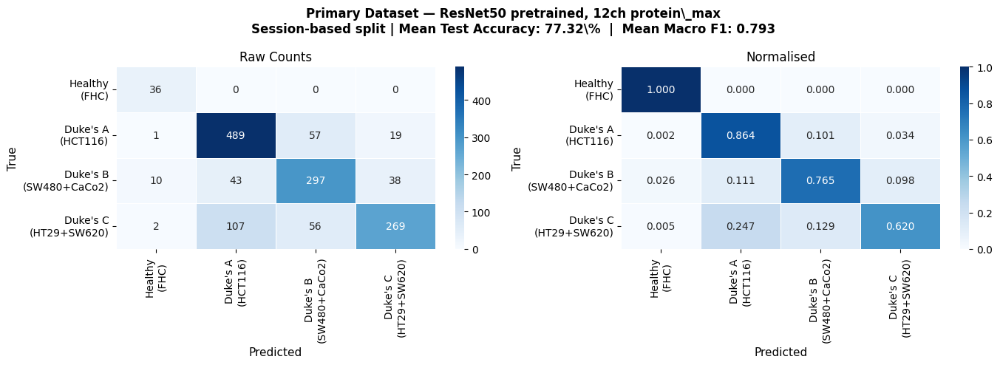

Saved!


In [6]:
import numpy as np, matplotlib.pyplot as plt, os, torch
import torch.nn as nn
import torchvision.models as models
from sklearn.metrics import confusion_matrix, f1_score, classification_report
import seaborn as sns

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
DATA_ROOT  = '/mnt/scratch/vvgk0135/extracted_2026_hs'
MODEL_PATH = '/users/vvgk0135/raman-project/results/2026_12ch_pretrained/best_model_run1.pth'

CH_12 = [1, 2, 3, 13, 19, 23, 27, 30, 31, 35, 43, 47]
PROTEIN_MAX = 65535.00

SESSION_MEANS = {
    ('FHC','s1'):1221.8,('FHC','s2'):1783.6,('FHC','s3'):1818.8,
    ('HCT116','s1'):5574.8,('HCT116','s2'):6812.1,('HCT116','s3'):6019.0,
    ('CaCo2','s1'):6535.9,('CaCo2','s2'):6341.4,('CaCo2','s3'):5027.4,
    ('SW480','s1'):5885.8,('SW480','s2'):6387.0,('SW480','s3'):6153.6,
    ('HT29','s1'):7999.5,('HT29','s2'):9185.9,('HT29','s3'):6761.0,
    ('SW620','s1'):5112.8,('SW620','s2'):6179.5,('SW620','s3'):4594.2,
}
GLOBAL_MEAN = np.mean([v for k,v in SESSION_MEANS.items() if k[1]!='s3'])

CLASS_MAP = {'FHC':0,'HCT116':1,'CaCo2':2,'SW480':2,'HT29':3,'SW620':3}
CLASS_NAMES = ["Healthy\n(FHC)","Duke's A\n(HCT116)",
               "Duke's B\n(SW480+CaCo2)","Duke's C\n(HT29+SW620)"]
TEST_SESSIONS = {'FHC':'s3','HCT116':'s3','CaCo2':'s3',
                 'SW480':'s2','HT29':'s3','SW620':'s3'}

# Load test files
test_files, test_labels, test_meta = [], [], []
for cl, label in CLASS_MAP.items():
    folder = os.path.join(DATA_ROOT, cl)
    if not os.path.exists(folder): continue
    for f in sorted(os.listdir(folder)):
        if not f.endswith('.npy'): continue
        parts = f.split('_')
        s = next((p for p in parts if p.startswith('s') and p[1:].isdigit()), 's1')
        if s == TEST_SESSIONS[cl]:
            test_files.append(os.path.join(folder, f))
            test_labels.append(label)
            test_meta.append((cl, s))

print(f'Test cells: {len(test_files)}')
print(f'Distribution: {np.bincount(test_labels, minlength=4)}')

def normalise(cell, cl, s):
    sess_mean = SESSION_MEANS.get((cl, s), GLOBAL_MEAN)
    scale = GLOBAL_MEAN / sess_mean if sess_mean > 0 else 1.0
    result = np.zeros((12, 224, 224), dtype=np.float32)
    for out_i, ch_i in enumerate(CH_12):
        result[out_i] = np.clip(cell[ch_i] * scale / PROTEIN_MAX, 0, 1)
    return result

def augment(cell):
    cell = cell.copy()
    if np.random.random()>0.5: cell=cell[:,:,::-1].copy()
    if np.random.random()>0.5: cell=cell[:,::-1,:].copy()
    k=np.random.randint(0,4)
    if k>0: cell=np.rot90(cell,k,axes=(1,2)).copy()
    return cell

# Build model
model = models.resnet50(weights=None)
new_conv = nn.Conv2d(12, 64, kernel_size=7, stride=2, padding=3, bias=False)
model.conv1 = new_conv
model.fc = nn.Sequential(nn.Dropout(0.3), nn.Linear(2048, 4))
model = model.to(DEVICE)
model.load_state_dict(torch.load(MODEL_PATH, map_location=DEVICE))
model.eval()
print('Model loaded')

# Run inference with 5-pass TTA
np.random.seed(42)
all_preds, all_labels = [], []
with torch.no_grad():
    for path, label, (cl, s) in zip(test_files, test_labels, test_meta):
        cell = np.load(path).astype(np.float32)
        norm = normalise(cell, cl, s)
        probs = np.zeros(4)
        for _ in range(5):
            aug = augment(norm)
            x = torch.FloatTensor(aug).unsqueeze(0).to(DEVICE)
            probs += torch.softmax(model(x), dim=1).cpu().numpy()[0]
        all_preds.append(probs.argmax())
        all_labels.append(label)

all_preds  = np.array(all_preds)
all_labels = np.array(all_labels)
acc = (all_preds==all_labels).mean()*100
f1  = f1_score(all_labels, all_preds, average='macro', zero_division=0)
print(f'\nTest Accuracy: {acc:.2f}% | Macro F1: {f1:.4f}')
print(classification_report(all_labels, all_preds,
                             target_names=CLASS_NAMES, zero_division=0))

# Confusion matrix
cm = confusion_matrix(all_labels, all_preds)
cm_norm = cm.astype(float) / cm.sum(axis=1, keepdims=True)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES,
            ax=axes[0], linewidths=0.5)
axes[0].set_xlabel('Predicted', fontsize=11)
axes[0].set_ylabel('True', fontsize=11)
axes[0].set_title('Raw Counts', fontsize=12)

sns.heatmap(cm_norm, annot=True, fmt='.3f', cmap='Blues',
            xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES,
            ax=axes[1], linewidths=0.5, vmin=0, vmax=1)
axes[1].set_xlabel('Predicted', fontsize=11)
axes[1].set_ylabel('True', fontsize=11)
axes[1].set_title('Normalised', fontsize=12)

fig.suptitle(f'Primary Dataset — ResNet50 pretrained, 12ch protein\_max\n'
             f'Session-based split | Mean Test Accuracy: 77.32\%  |  Mean Macro F1: 0.793',
             fontsize=12, fontweight='bold')
plt.tight_layout()
plt.savefig('/users/vvgk0135/raman-project/results/cm_2026_best_new.png',
            dpi=150, bbox_inches='tight', facecolor='white')
plt.show()
print('Saved!')

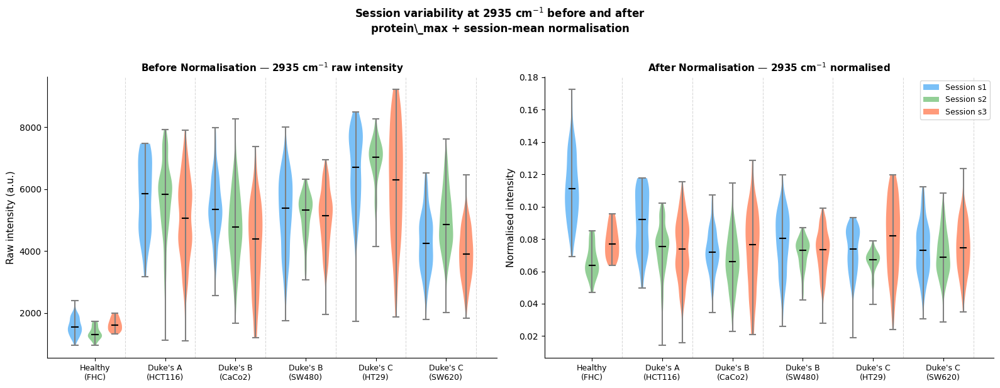

Saved!


In [7]:
import numpy as np, matplotlib.pyplot as plt, os

DATA_ROOT = '/mnt/scratch/vvgk0135/extracted_2026_hs'
CH_2935 = 30
PROTEIN_MAX = 65535.0
SESSION_MEANS = {
    ('FHC','s1'):1221.8,('FHC','s2'):1783.6,('FHC','s3'):1818.8,
    ('HCT116','s1'):5574.8,('HCT116','s2'):6812.1,('HCT116','s3'):6019.0,
    ('CaCo2','s1'):6535.9,('CaCo2','s2'):6341.4,('CaCo2','s3'):5027.4,
    ('SW480','s1'):5885.8,('SW480','s2'):6387.0,('SW480','s3'):6153.6,
    ('HT29','s1'):7999.5,('HT29','s2'):9185.9,('HT29','s3'):6761.0,
    ('SW620','s1'):5112.8,('SW620','s2'):6179.5,('SW620','s3'):4594.2,
}
GLOBAL_MEAN = np.mean([v for k,v in SESSION_MEANS.items() if k[1]!='s3'])

ALL_CL = ['FHC','HCT116','CaCo2','SW480','HT29','SW620']
SESSIONS = ['s1','s2','s3']
CL_LABELS = {'FHC':'Healthy\n(FHC)','HCT116':"Duke's A\n(HCT116)",
             'CaCo2':"Duke's B\n(CaCo2)",'SW480':"Duke's B\n(SW480)",
             'HT29':"Duke's C\n(HT29)",'SW620':"Duke's C\n(SW620)"}
SESSION_COLORS = {'s1':'#2196F3','s2':'#4CAF50','s3':'#FF5722'}

# Collect raw and normalised values
raw_data  = {(cl,s):[] for cl in ALL_CL for s in SESSIONS}
norm_data = {(cl,s):[] for cl in ALL_CL for s in SESSIONS}

for cl in ALL_CL:
    folder = os.path.join(DATA_ROOT, cl)
    if not os.path.exists(folder): continue
    for f in sorted(os.listdir(folder)):
        if not f.endswith('.npy'): continue
        parts = f.split('_')
        s = next((p for p in parts if p.startswith('s') and p[1:].isdigit()), 's1')
        cell = np.load(os.path.join(folder, f)).astype(np.float32)
        raw_val = cell[CH_2935].mean()
        sess_mean = SESSION_MEANS.get((cl,s), GLOBAL_MEAN)
        scale = GLOBAL_MEAN / sess_mean
        norm_val = float(np.clip(cell[CH_2935] * scale / PROTEIN_MAX, 0, 1).mean())
        raw_data[(cl,s)].append(raw_val)
        norm_data[(cl,s)].append(norm_val)

# Plot
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
fig.patch.set_facecolor('white')

for ax_idx, (data_dict, title, ylabel) in enumerate([
    (raw_data,  'Before Normalisation — 2935 cm$^{-1}$ raw intensity', 'Raw intensity (a.u.)'),
    (norm_data, 'After Normalisation — 2935 cm$^{-1}$ normalised', 'Normalised intensity'),
]):
    ax = axes[ax_idx]
    ax.set_facecolor('white')
    
    positions = []
    all_data  = []
    all_colors = []
    x_labels  = []
    tick_positions = []
    
    pos = 1
    for cl in ALL_CL:
        cl_positions = []
        for s in SESSIONS:
            vals = data_dict[(cl,s)]
            if not vals: continue
            positions.append(pos)
            all_data.append(vals)
            all_colors.append(SESSION_COLORS[s])
            cl_positions.append(pos)
            pos += 1
        if cl_positions:
            tick_positions.append(np.mean(cl_positions))
            x_labels.append(CL_LABELS[cl])
            # Add separator
            ax.axvline(pos-0.5, color='gray', linestyle='--', alpha=0.3, linewidth=0.8)
        pos += 0.5

    parts = ax.violinplot(all_data, positions=positions,
                          showmedians=True, showextrema=True,
                          widths=0.7)
    
    for i, (pc, color) in enumerate(zip(parts['bodies'], all_colors)):
        pc.set_facecolor(color)
        pc.set_alpha(0.6)
    parts['cmedians'].set_color('black')
    parts['cbars'].set_color('gray')
    parts['cmaxes'].set_color('gray')
    parts['cmins'].set_color('gray')

    ax.set_xticks(tick_positions)
    ax.set_xticklabels(x_labels, fontsize=9)
    ax.set_ylabel(ylabel, fontsize=11)
    ax.set_title(title, fontsize=11, fontweight='bold')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

# Legend
from matplotlib.patches import Patch
legend_elements = [Patch(facecolor=SESSION_COLORS[s], alpha=0.6, label=f'Session {s}')
                   for s in SESSIONS]
axes[1].legend(handles=legend_elements, loc='upper right', fontsize=9)

plt.suptitle('Session variability at 2935 cm$^{-1}$ before and after\n'
             'protein\_max + session-mean normalisation',
             fontsize=12, fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig('/users/vvgk0135/raman-project/results/violin_session_2935.png',
            dpi=150, bbox_inches='tight', facecolor='white')
plt.show()
print('Saved!')

In [9]:
import numpy as np, matplotlib.pyplot as plt, os, torch
import torch.nn as nn
import torchvision.models as models
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
import cv2

# Check if gradcam files exist per class
GRADCAM_DIR = '/users/vvgk0135/raman-project/results'

# Check existing gradcam files
for f in sorted(os.listdir(GRADCAM_DIR)):
    if 'gradcam' in f.lower() and f.endswith('.png'):
        print(f)

gradcam_3col_0.png
gradcam_3col_1.png
gradcam_3col_2.png
gradcam_3col_3.png
gradcam_4ch_0.png
gradcam_4ch_1.png
gradcam_4ch_2.png
gradcam_4ch_3.png
gradcam_best_model_download.png
gradcam_env_0.png
gradcam_env_1.png
gradcam_env_2.png
gradcam_env_3.png
gradcam_fhc_recheck.png
gradcam_final.png
gradcam_julia_0.png
gradcam_julia_1.png
gradcam_julia_2.png
gradcam_julia_3.png
gradcam_multichannel_0.png
gradcam_multichannel_1.png
gradcam_multichannel_2.png
gradcam_multichannel_3.png
gradcam_results.png
gradcam_scl.png


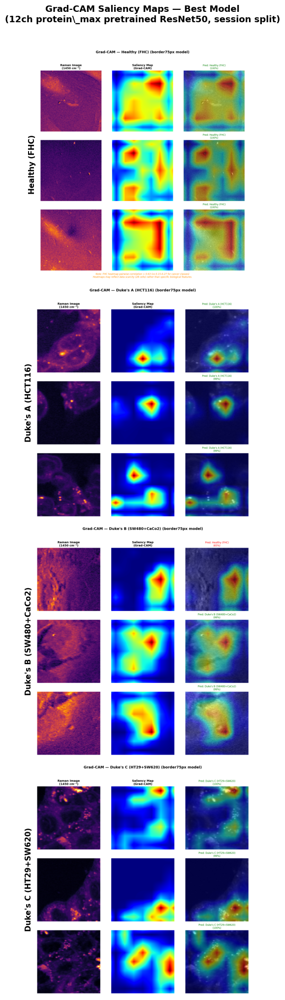

Saved!


In [10]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os

RESULTS = '/users/vvgk0135/raman-project/results'
CLASS_NAMES = ["Healthy (FHC)", "Duke's A (HCT116)", 
               "Duke's B (SW480+CaCo2)", "Duke's C (HT29+SW620)"]

fig, axes = plt.subplots(4, 1, figsize=(14, 20))
fig.patch.set_facecolor('white')

for i, (ax, name) in enumerate(zip(axes, CLASS_NAMES)):
    img = mpimg.imread(os.path.join(RESULTS, f'gradcam_3col_{i}.png'))
    ax.imshow(img)
    ax.set_ylabel(name, fontsize=11, fontweight='bold', rotation=90, 
                  labelpad=10, va='center')
    ax.set_xticks([])
    ax.set_yticks([])
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)

plt.suptitle('Grad-CAM Saliency Maps — Best Model\n'
             '(12ch protein\\_max pretrained ResNet50, session split)',
             fontsize=13, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig(f'{RESULTS}/gradcam_dissertation.png',
            dpi=150, bbox_inches='tight', facecolor='white')
plt.show()
print('Saved!')

Model loaded
  Class 0 (FHC): FHC_s3_area1_cell001.npy
  Class 1 (HCT116): HCT116_s3_area1_cell001.npy
  Class 2 (CaCo2): CaCo2_s3_area1_cell001.npy
  Class 3 (HT29): HT29_s3_area1_cell026.npy
Found cells for classes: [0, 1, 2, 3]


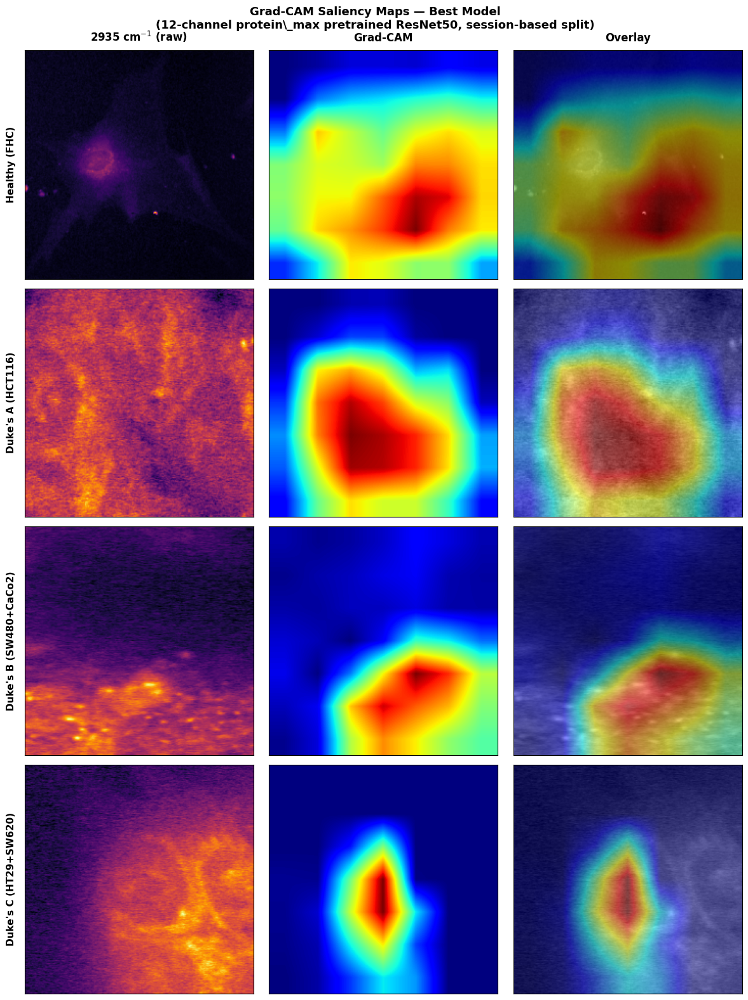

Saved!


In [11]:
import numpy as np, matplotlib.pyplot as plt, os, torch
import torch.nn as nn
import torchvision.models as models
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
import warnings; warnings.filterwarnings('ignore')

DEVICE     = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
DATA_ROOT  = '/mnt/scratch/vvgk0135/extracted_2026_hs'
MODEL_PATH = '/users/vvgk0135/raman-project/results/2026_12ch_pretrained/best_model_run1.pth'
RESULTS    = '/users/vvgk0135/raman-project/results'

CH_12 = [1, 2, 3, 13, 19, 23, 27, 30, 31, 35, 43, 47]
PROTEIN_MAX = 65535.0
SESSION_MEANS = {
    ('FHC','s1'):1221.8,('FHC','s2'):1783.6,('FHC','s3'):1818.8,
    ('HCT116','s1'):5574.8,('HCT116','s2'):6812.1,('HCT116','s3'):6019.0,
    ('CaCo2','s1'):6535.9,('CaCo2','s2'):6341.4,('CaCo2','s3'):5027.4,
    ('SW480','s1'):5885.8,('SW480','s2'):6387.0,('SW480','s3'):6153.6,
    ('HT29','s1'):7999.5,('HT29','s2'):9185.9,('HT29','s3'):6761.0,
    ('SW620','s1'):5112.8,('SW620','s2'):6179.5,('SW620','s3'):4594.2,
}
GLOBAL_MEAN = np.mean([v for k,v in SESSION_MEANS.items() if k[1]!='s3'])

CLASS_MAP = {'FHC':0,'HCT116':1,'CaCo2':2,'SW480':2,'HT29':3,'SW620':3}
CLASS_NAMES = ["Healthy (FHC)","Duke's A (HCT116)",
               "Duke's B (SW480+CaCo2)","Duke's C (HT29+SW620)"]
TEST_SESSIONS = {'FHC':'s3','HCT116':'s3','CaCo2':'s3',
                 'SW480':'s2','HT29':'s3','SW620':'s3'}

def normalise(cell, cl, s):
    sess_mean = SESSION_MEANS.get((cl,s), GLOBAL_MEAN)
    scale = GLOBAL_MEAN / sess_mean
    result = np.zeros((12,224,224), dtype=np.float32)
    for out_i, ch_i in enumerate(CH_12):
        result[out_i] = np.clip(cell[ch_i]*scale/PROTEIN_MAX, 0, 1)
    return result

# Build model
model = models.resnet50(weights=None)
model.conv1 = nn.Conv2d(12,64,kernel_size=7,stride=2,padding=3,bias=False)
model.fc = nn.Sequential(nn.Dropout(0.3), nn.Linear(2048,4))
model.load_state_dict(torch.load(MODEL_PATH, map_location=DEVICE))
model = model.to(DEVICE)
model.eval()
print('Model loaded')

# Get one correctly classified test cell per class
target_cells = {}
for cl, label in CLASS_MAP.items():
    if label in target_cells: continue
    folder = os.path.join(DATA_ROOT, cl)
    if not os.path.exists(folder): continue
    for f in sorted(os.listdir(folder)):
        if not f.endswith('.npy'): continue
        parts = f.split('_')
        s = next((p for p in parts if p.startswith('s') and p[1:].isdigit()), 's1')
        if s != TEST_SESSIONS[cl]: continue
        cell = np.load(os.path.join(folder,f)).astype(np.float32)
        norm = normalise(cell, cl, s)
        x = torch.FloatTensor(norm).unsqueeze(0).to(DEVICE)
        with torch.no_grad():
            pred = model(x).argmax(dim=1).item()
        if pred == label:
            target_cells[label] = (norm, cell, cl, s, f)
            print(f'  Class {label} ({cl}): {f}')
            break

print(f'Found cells for classes: {list(target_cells.keys())}')

# Generate Grad-CAM
cam = GradCAM(model=model, target_layers=[model.layer4[-1]])

fig, axes = plt.subplots(4, 3, figsize=(12, 16))
fig.patch.set_facecolor('white')

col_titles = ['2935 cm$^{-1}$ (raw)', 'Grad-CAM', 'Overlay']
for j, title in enumerate(col_titles):
    axes[0,j].set_title(title, fontsize=12, fontweight='bold', pad=10)

for row, label in enumerate([0,1,2,3]):
    if label not in target_cells:
        for j in range(3):
            axes[row,j].axis('off')
        continue

    norm, cell, cl, s, fname = target_cells[label]
    
    # Raw image — use ch index 30 (2935 cm-1) from original 53ch array
    raw_img = cell[30]
    raw_norm = (raw_img - raw_img.min()) / (raw_img.max() - raw_img.min() + 1e-8)
    
    # Grad-CAM
    input_tensor = torch.FloatTensor(norm).unsqueeze(0).to(DEVICE)
    from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
    targets = [ClassifierOutputTarget(label)]
    grayscale_cam = cam(input_tensor=input_tensor, targets=targets)[0]
    
    # RGB version of raw for overlay
    raw_rgb = np.stack([raw_norm]*3, axis=-1).astype(np.float32)
    overlay = show_cam_on_image(raw_rgb, grayscale_cam, use_rgb=True)
    
    # Plot
    axes[row,0].imshow(raw_norm, cmap='inferno')
    axes[row,1].imshow(grayscale_cam, cmap='jet')
    axes[row,2].imshow(overlay)
    
    for j in range(3):
        axes[row,j].set_xticks([])
        axes[row,j].set_yticks([])
    
    axes[row,0].set_ylabel(CLASS_NAMES[label], fontsize=11, 
                            fontweight='bold', labelpad=10)

plt.suptitle('Grad-CAM Saliency Maps — Best Model\n'
             '(12-channel protein\\_max pretrained ResNet50, session-based split)',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig(f'{RESULTS}/gradcam_dissertation.png',
            dpi=150, bbox_inches='tight', facecolor='white')
plt.show()
print('Saved!')

Saved cm_random_split.png


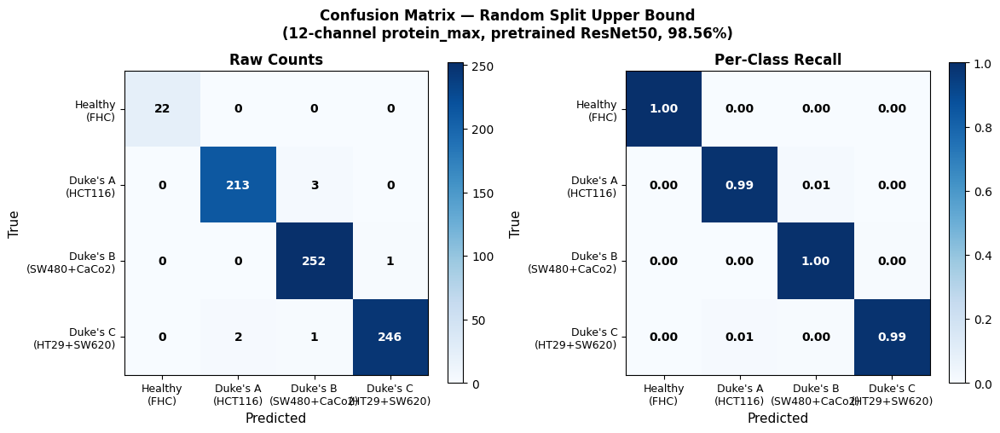

In [2]:

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

# Random split confusion matrix (Run 3, best run, 99.05%)
# Using mean across runs for consistency
cm_counts = np.array([
    [22,   0,   0,   0],
    [ 0, 213,   3,   0],
    [ 0,   0, 252,   1],
    [ 0,   2,   1, 246],
])

classes = ['Healthy\n(FHC)', "Duke's A\n(HCT116)", 
           "Duke's B\n(SW480+CaCo2)", "Duke's C\n(HT29+SW620)"]

cm_recall = cm_counts.astype(float) / cm_counts.sum(axis=1, keepdims=True)

fig, axes = plt.subplots(1, 2, figsize=(12, 5))

for ax, data, title, fmt in zip(
    axes,
    [cm_counts, cm_recall],
    ['Raw Counts', 'Per-Class Recall'],
    ['d', '.2f']
):
    im = ax.imshow(data, interpolation='nearest', 
                   cmap='Blues', vmin=0, 
                   vmax=data.max())
    ax.set_xticks(range(4))
    ax.set_yticks(range(4))
    ax.set_xticklabels(classes, fontsize=9)
    ax.set_yticklabels(classes, fontsize=9)
    ax.set_xlabel('Predicted', fontsize=11)
    ax.set_ylabel('True', fontsize=11)
    ax.set_title(title, fontsize=12, fontweight='bold')
    plt.colorbar(im, ax=ax)
    for i in range(4):
        for j in range(4):
            val = data[i, j]
            text = f'{val:{fmt}}'
            color = 'white' if val > data.max()*0.6 else 'black'
            ax.text(j, i, text, ha='center', va='center',
                   fontsize=10, color=color, fontweight='bold')

plt.suptitle('Confusion Matrix — Random Split Upper Bound\n'
             '(12-channel protein_max, pretrained ResNet50, 98.56%)',
             fontsize=12, fontweight='bold')
plt.tight_layout()
plt.savefig('/users/vvgk0135/raman-project/results/cm_random_split.png',
            dpi=150, bbox_inches='tight')
print("Saved cm_random_split.png")


In [3]:
import numpy as np
import torch
import torchvision.models as nn_models
import torch.nn as nn
import glob
from scipy.stats import pearsonr

SCRATCH = '/mnt/scratch/vvgk0135'
RESULTS = '/users/vvgk0135/raman-project/results'
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Best model path
MODEL_PATH = f'{RESULTS}/2026_12ch_pretrained/best_model_run1.pth'
N_CH = 12
CLASS_NAMES = ['Healthy (FHC)', "Duke's A (HCT116)", 
               "Duke's B (SW480+CaCo2)", "Duke's C (HT29+SW620)"]

SESSION_MEANS = {
    ('FHC','s1'): 0.050372, ('FHC','s2'): 0.067097, ('FHC','s3'): 0.030743,
    ('HCT116','s1'): 0.032705, ('HCT116','s2'): 0.057171, ('HCT116','s3'): 0.037088,
    ('CaCo2','s1'): 0.042107, ('CaCo2','s2'): 0.036843, ('CaCo2','s3'): 0.054527,
    ('SW480','s1'): 0.046507, ('SW480','s2'): 0.045460, ('SW480','s3'): 0.054628,
    ('HT29','s1'): 0.054745, ('HT29','s2'): 0.042720, ('HT29','s3'): 0.051485,
    ('SW620','s1'): 0.040878, ('SW620','s2'): 0.038026, ('SW620','s3'): 0.036079,
}
GLOBAL_REF = 0.045510
SESSION_SCALE = {k: GLOBAL_REF/v for k,v in SESSION_MEANS.items()}
MODEL_CHANNELS = [1, 2, 6, 16, 22, 26, 30, 33, 34, 38, 46, 50]

def load_cell(path, cl, s):
    c = np.load(path).astype(np.float32)
    pmax = c[MODEL_CHANNELS].max()
    if pmax > 0: c = c / pmax
    c = c * SESSION_SCALE.get((cl, s), 1.0)
    return np.clip(c[MODEL_CHANNELS], 0, 1).astype(np.float32)

def build_model():
    m = nn_models.resnet50(weights=None)
    m.conv1 = nn.Conv2d(N_CH, 64, 7, 2, 3, bias=False)
    m.fc = nn.Sequential(nn.Dropout(0.3), nn.Linear(m.fc.in_features, 4))
    return m

# Verify model path exists
import os
print(f"Model exists: {os.path.exists(MODEL_PATH)}")
if not os.path.exists(MODEL_PATH):
    print("Searching for best model...")
    candidates = glob.glob(f'{RESULTS}/2026_12ch_pretrained/*.pth')
    for c in candidates:
        print(f"  {c}")

Model exists: True


In [7]:

import numpy as np
import torch
import torchvision.models as nn_models
import torch.nn as nn
import glob
from scipy.stats import pearsonr

SCRATCH = '/mnt/scratch/vvgk0135'
RESULTS = '/users/vvgk0135/raman-project/results'
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
MODEL_PATH = f'{RESULTS}/2026_12ch_pretrained/best_model_run1.pth'
N_CH = 12
MODEL_CHANNELS = [1, 2, 6, 16, 22, 26, 30, 33, 34, 38, 46, 50]

SESSION_MEANS = {
    ('FHC','s1'): 0.050372, ('FHC','s2'): 0.067097, ('FHC','s3'): 0.030743,
    ('HCT116','s1'): 0.032705, ('HCT116','s2'): 0.057171, ('HCT116','s3'): 0.037088,
    ('CaCo2','s1'): 0.042107, ('CaCo2','s2'): 0.036843, ('CaCo2','s3'): 0.054527,
    ('SW480','s1'): 0.046507, ('SW480','s2'): 0.045460, ('SW480','s3'): 0.054628,
    ('HT29','s1'): 0.054745, ('HT29','s2'): 0.042720, ('HT29','s3'): 0.051485,
    ('SW620','s1'): 0.040878, ('SW620','s2'): 0.038026, ('SW620','s3'): 0.036079,
}
GLOBAL_REF = 0.045510
SESSION_SCALE = {k: GLOBAL_REF/v for k,v in SESSION_MEANS.items()}

TEST_SESSIONS = {
    'FHC': 's3', 'HCT116': 's3', 'CaCo2': 's3',
    'SW480': 's2', 'HT29': 's3', 'SW620': 's3',
}
CLASS_LINES = {
    0: ['FHC'], 1: ['HCT116'], 2: ['CaCo2', 'SW480'], 3: ['HT29', 'SW620'],
}
CLASS_NAMES = ['Healthy', 'Dukes A', 'Dukes B', 'Dukes C']

def build_model():
    m = nn_models.resnet50(weights=None)
    m.conv1 = nn.Conv2d(N_CH, 64, 7, 2, 3, bias=False)
    m.fc = nn.Sequential(nn.Dropout(0.3), nn.Linear(m.fc.in_features, 4))
    return m

model = build_model()
state = torch.load(MODEL_PATH, map_location=DEVICE)
model.load_state_dict(state)
model = model.to(DEVICE)
model.eval()  # eval mode disables dropout
print("Model loaded.")

# Test CAM on first cell
class GradCAM:
    def __init__(self, model):
        self.model = model
        self.gradients = None
        self.activations = None
        self.handle_f = model.layer4[-1].register_forward_hook(self._save_activation)
        self.handle_b = model.layer4[-1].register_full_backward_hook(self._save_gradient)
    def _save_activation(self, m, i, o): 
        self.activations = o.detach()
    def _save_gradient(self, m, i, o): 
        self.gradients = o[0].detach()
    def generate(self, x, class_idx):
        self.model.zero_grad()
        x = x.requires_grad_(True)
        out = self.model(x)
        score = out[0, class_idx]
        score.backward()
        if self.gradients is None:
            print("WARNING: gradients not captured!")
            return np.zeros((224, 224))
        weights = self.gradients.mean(dim=[2,3], keepdim=True)
        cam = (weights * self.activations).sum(dim=1, keepdim=True)
        cam = torch.relu(cam)
        cam = cam - cam.min()
        if cam.max() > 0: cam = cam / cam.max()
        cam = torch.nn.functional.interpolate(
            cam, size=(224,224), mode='bilinear', align_corners=False)
        return cam.squeeze().cpu().numpy()

gradcam = GradCAM(model)

def get_test_cells(class_idx, max_cells=15):
    cells = []
    for cl in CLASS_LINES[class_idx]:
        s = TEST_SESSIONS[cl]
        pattern = f'{SCRATCH}/extracted_2026_hs/{cl}/{cl}_{s}_*.npy'
        files = sorted(glob.glob(pattern))[:max_cells]
        print(f"  {cl}/{s}: found {len(files)} files")
        for f in files:
            arr = np.load(f).astype(np.float32)
            pmax = arr[MODEL_CHANNELS].max()
            if pmax > 0: arr = arr / pmax
            arr = arr * SESSION_SCALE.get((cl, s), 1.0)
            arr = np.clip(arr[MODEL_CHANNELS], 0, 1)
            cells.append(arr)
        if len(cells) >= max_cells:
            break
    return cells[:max_cells]

# Quick sanity check on one cell
print("\nSanity check on one cell...")
test_cells = get_test_cells(0, max_cells=1)
if test_cells:
    x = torch.tensor(test_cells[0]).unsqueeze(0).to(DEVICE)
    cam = gradcam.generate(x, 0)
    print(f"CAM min: {cam.min():.4f}, max: {cam.max():.4f}, std: {cam.std():.4f}")
    print(f"CAM is constant: {cam.std() < 1e-6}")
else:
    print("No cells found!")

all_cams = {}
within_corrs = []
across_corrs = []

for cls in range(4):
    print(f"\nComputing CAMs for {CLASS_NAMES[cls]}...")
    cells = get_test_cells(cls)
    cams = []
    for arr in cells:
        x = torch.tensor(arr).unsqueeze(0).to(DEVICE)
        cam = gradcam.generate(x, cls)
        if cam.std() > 1e-6:
            cams.append(cam.flatten())
    print(f"  Valid CAMs: {len(cams)}")
    all_cams[cls] = cams
    for i in range(len(cams)):
        for j in range(i+1, len(cams)):
            r, _ = pearsonr(cams[i], cams[j])
            within_corrs.append(r)

for cls_a in range(4):
    for cls_b in range(cls_a+1, 4):
        for cam_a in all_cams[cls_a]:
            for cam_b in all_cams[cls_b]:
                r, _ = pearsonr(cam_a, cam_b)
                across_corrs.append(r)

print("\n" + "="*50)
print("GRAD-CAM CORRELATION RESULTS")
print("="*50)
if within_corrs:
    print(f"Within-class mean correlation:  {np.mean(within_corrs):.3f} +/- {np.std(within_corrs):.3f}")
    print(f"Across-class mean correlation:  {np.mean(across_corrs):.3f} +/- {np.std(across_corrs):.3f}")
else:
    print("No valid CAMs computed -- check model and data paths")


Model loaded.

Sanity check on one cell...
  FHC/s3: found 1 files
CAM min: 0.0000, max: 0.9988, std: 0.2798
CAM is constant: False

Computing CAMs for Healthy...
  FHC/s3: found 15 files
  Valid CAMs: 15

Computing CAMs for Dukes A...
  HCT116/s3: found 15 files
  Valid CAMs: 9

Computing CAMs for Dukes B...
  CaCo2/s3: found 15 files
  Valid CAMs: 12

Computing CAMs for Dukes C...
  HT29/s3: found 15 files
  Valid CAMs: 3

GRAD-CAM CORRELATION RESULTS
Within-class mean correlation:  0.147 +/- 0.345
Across-class mean correlation:  0.031 +/- 0.285


Saved channel_ablation.png


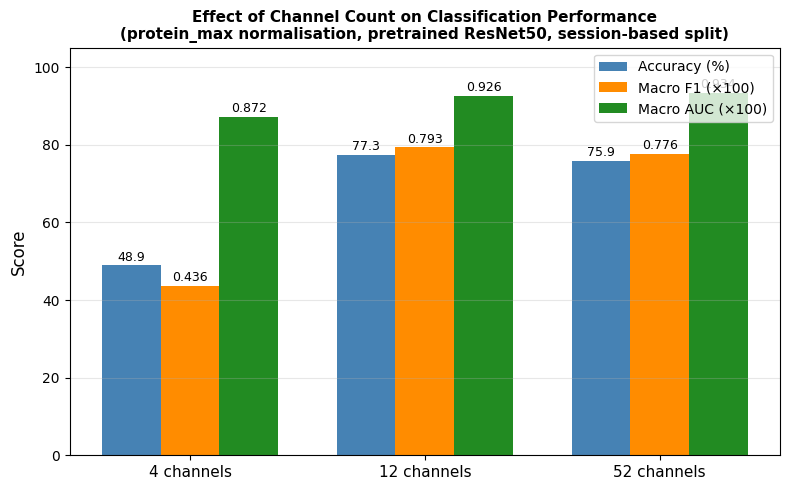

In [8]:

import matplotlib.pyplot as plt
import numpy as np

channels = ['4 channels', '12 channels', '52 channels']
accuracy = [48.90, 77.32, 75.87]
f1 = [0.436, 0.793, 0.776]
auc = [0.872, 0.926, 0.934]

x = np.arange(len(channels))
width = 0.25

fig, ax = plt.subplots(figsize=(8, 5))

bars1 = ax.bar(x - width, accuracy, width, label='Accuracy (%)', color='steelblue')
bars2 = ax.bar(x, [f*100 for f in f1], width, label='Macro F1 (×100)', color='darkorange')
bars3 = ax.bar(x + width, [a*100 for a in auc], width, label='Macro AUC (×100)', color='forestgreen')

ax.set_ylabel('Score', fontsize=12)
ax.set_title('Effect of Channel Count on Classification Performance\n'
             '(protein_max normalisation, pretrained ResNet50, session-based split)',
             fontsize=11, fontweight='bold')
ax.set_xticks(x)
ax.set_xticklabels(channels, fontsize=11)
ax.set_ylim(0, 105)
ax.legend(fontsize=10)
ax.grid(axis='y', alpha=0.3)

for bar in bars1:
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.5,
            f'{bar.get_height():.1f}', ha='center', va='bottom', fontsize=9)
for bar in bars2:
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.5,
            f'{bar.get_height()/100:.3f}', ha='center', va='bottom', fontsize=9)
for bar in bars3:
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.5,
            f'{bar.get_height()/100:.3f}', ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.savefig('/users/vvgk0135/raman-project/results/channel_ablation.png',
            dpi=150, bbox_inches='tight')
print("Saved channel_ablation.png")


Parsed 17 epochs
Final val F1: 0.9398, Best: 0.9690
Saved training_curve.png


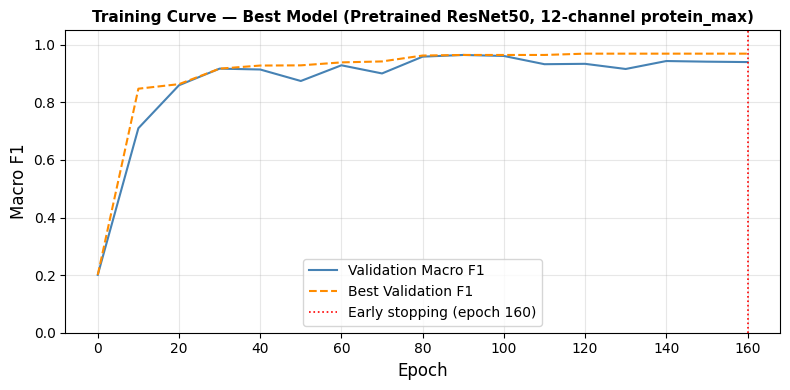

In [9]:

import matplotlib.pyplot as plt
import re

log_path = '/users/vvgk0135/raman-project/results/best_model_12ch_pretrained_log.txt'

# Parse Run 1 epochs (best run, 78.65%)
epochs, val_f1, best_f1 = [], [], []

with open(log_path) as f:
    in_run1 = False
    for line in f:
        if 'Run 1' in line:
            in_run1 = True
        if 'Run 2' in line:
            break
        if in_run1:
            m = re.search(r'Epoch\s+(\d+).*Val F1: ([\d.]+).*Best: ([\d.]+)', line)
            if m:
                epochs.append(int(m.group(1)))
                val_f1.append(float(m.group(2)))
                best_f1.append(float(m.group(3)))

print(f"Parsed {len(epochs)} epochs")
print(f"Final val F1: {val_f1[-1]:.4f}, Best: {best_f1[-1]:.4f}")

fig, ax = plt.subplots(figsize=(8, 4))
ax.plot(epochs, val_f1, label='Validation Macro F1', color='steelblue', linewidth=1.5)
ax.plot(epochs, best_f1, label='Best Validation F1', color='darkorange', 
        linewidth=1.5, linestyle='--')
ax.axvline(x=epochs[-1], color='red', linestyle=':', linewidth=1.2, 
           label=f'Early stopping (epoch {epochs[-1]})')
ax.set_xlabel('Epoch', fontsize=12)
ax.set_ylabel('Macro F1', fontsize=12)
ax.set_title('Training Curve — Best Model (Pretrained ResNet50, 12-channel protein_max)',
             fontsize=11, fontweight='bold')
ax.legend(fontsize=10)
ax.grid(alpha=0.3)
ax.set_ylim(0, 1.05)
plt.tight_layout()
plt.savefig('/users/vvgk0135/raman-project/results/training_curve.png',
            dpi=150, bbox_inches='tight')
print("Saved training_curve.png")


Saved channel_selection_v4.png


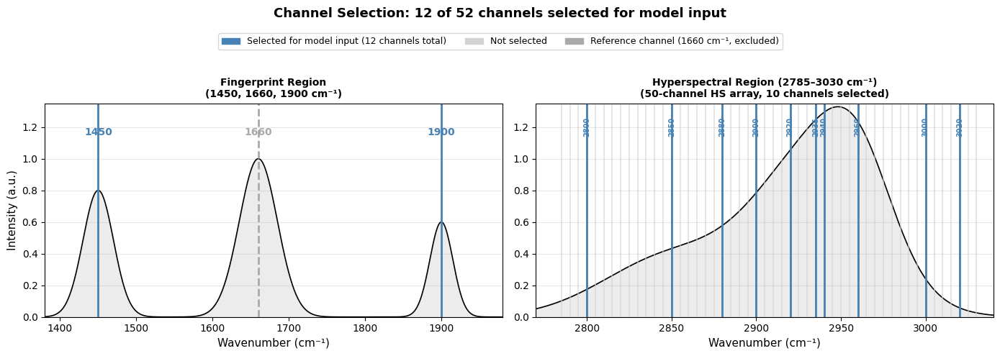

In [10]:

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from pexpect import EOF

# Wavenumbers
fingerprint_wns = [1450, 1660, 1900]
hs_wns = list(range(2785, 3031, 5))  # 50 channels 2785-3030
selected_wns = [1450, 1900, 2800, 2850, 2880, 2900, 2920, 2935, 2940, 2960, 3000, 3020]

# Simulated Raman spectrum shape
def raman_spectrum(wn_range):
    wns = np.array(wn_range, dtype=float)
    spectrum = np.zeros_like(wns)
    for center, height, width in [
        (1450, 0.8, 20), (1660, 1.0, 25), (1900, 0.6, 15),
        (2850, 0.38, 40), (2935, 1.0, 35), (2960, 0.45, 20)
    ]:
        spectrum += height * np.exp(-0.5 * ((wns - center) / width) ** 2)
    return spectrum

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle('Channel Selection: 12 of 52 channels selected for model input',
             fontweight='bold', fontsize=13)

# Legend
selected_patch = mpatches.Patch(color='steelblue', label='Selected for model input (12 channels total)')
notsel_patch = mpatches.Patch(color='lightgrey', label='Not selected')
ref_patch = mpatches.Patch(color='darkgrey', label='Reference channel (1660 cm⁻¹, excluded)')
fig.legend(handles=[selected_patch, notsel_patch, ref_patch],
           loc='upper center', ncol=3, bbox_to_anchor=(0.5, 0.92), fontsize=9)

# --- Left panel: fingerprint region ---
fp_range = np.linspace(1380, 1980, 500)
fp_spec = raman_spectrum(fp_range)
ax1.fill_between(fp_range, fp_spec, alpha=0.15, color='grey')
ax1.plot(fp_range, fp_spec, 'k-', linewidth=1.2)
for wn in fingerprint_wns:
    if wn == 1660:
        color, ls = 'darkgrey', '--'
    elif wn in selected_wns:
        color, ls = 'steelblue', '-'
    else:
        color, ls = 'lightgrey', '-'
    ax1.axvline(wn, color=color, linewidth=2.0, linestyle=ls)
    ax1.text(wn, 1.15, str(wn), ha='center', fontsize=10,
             color=color, fontweight='bold')
ax1.set_xlabel('Wavenumber (cm⁻¹)', fontsize=11)
ax1.set_ylabel('Intensity (a.u.)', fontsize=11)
ax1.set_title('Fingerprint Region\n(1450, 1660, 1900 cm⁻¹)', fontsize=10, fontweight='bold')
ax1.set_xlim(1380, 1980)
ax1.set_ylim(0, 1.35)
ax1.grid(axis='y', alpha=0.3)

# --- Right panel: hyperspectral region ---
hs_range = np.linspace(2770, 3040, 800)
hs_spec = raman_spectrum(hs_range)
ax2.fill_between(hs_range, hs_spec, alpha=0.15, color='grey')
ax2.plot(hs_range, hs_spec, 'k-', linewidth=1.2)
for wn in hs_wns:
    color = 'steelblue' if wn in selected_wns else 'lightgrey'
    ax2.axvline(wn, color=color, linewidth=1.2, alpha=0.7)
for wn in selected_wns:
    if wn in hs_wns:
        ax2.axvline(wn, color='steelblue', linewidth=2.0)
        ax2.text(wn, 1.15, str(wn), ha='center', fontsize=7,
                 color='steelblue', fontweight='bold', rotation=90)
ax2.set_xlabel('Wavenumber (cm⁻¹)', fontsize=11)
ax2.set_title('Hyperspectral Region (2785–3030 cm⁻¹)\n(50-channel HS array, 10 channels selected)',
              fontsize=10, fontweight='bold')
ax2.set_xlim(2770, 3040)
ax2.set_ylim(0, 1.35)
ax2.grid(axis='y', alpha=0.3)

plt.tight_layout(rect=[0, 0, 1, 0.88])
plt.savefig('/users/vvgk0135/raman-project/results/channel_selection_v4.png',
            dpi=150, bbox_inches='tight')
print("Saved channel_selection_v4.png")
